# CSCI E83 – Fall Term 2023- Fundamental of Data Science     
# Graduate Credit Project – Asma Naeem: Time Series Demand Forecasting
# Executive Summary:

Forecasting plays a crucial role in airline management—Airlines project demand to plan the supply of services to respond to that demand. Forecasts enable airlines to make informed decisions about pricing, seat inventory control, and catering. Decisions like advertising and sales campaigns, aircraft scheduling, maintenance planning, and opening new sales offices depend upon predicted demand. Forecasts facilitate the creation of new routes and the acquisition of new aircraft. 
<br>
However, accurate forecasting of bookings is a challenging task where seasonality plays an important role. Airlines see a surge in demand during the summer holidays or the festive season compared to the rest of the year. Competition, economic circumstances, and external happenings such as weather conditions, natural disasters, or political unrest also affect flight bookings. Airline companies rely on accurate forecasting to offer competitive prices to attract customers and gain a larger market share. 
<br>
Commonly used techniques to generate a probable data set that relates back to the original data include: -

* Machine learning: A discipline of artificial intelligence that allows computers to learn from data and past experiences without explicit programming to recognize patterns and make future predictions. ML can be used to project bookings. 
* Time Series Analysis: A way of analyzing historical data and identifying patterns and trends. This technique can identify seasonal trends, such as high demand during peak travel seasons, and forecast future demand based on historical patterns.
* Regression analysis: A method to examine the relationship between two or more variables. It can project air travel demand depending upon various aspects, such as the destination, price of tickets, and the time of year.


# Problem Statement:

The objective of this project is to come up with the best forecasting model to predict air travel demand. The selected dataset is public data, which is available from data.world(Original Source: San Francisco Open Data). This dataset is a San Francisco International Airport Report on Monthly Passenger Traffic Statistics by Airline from 2005 to 2016. Airport data is seasonal. Hence, any comparative analyses would be performed on a period-over-period basis (such as March 2015 vs. March 2016) instead of period-to-period (such as. March 2015 vs. April 2015). Notably, fact and attribute field relationships are not always 1-to-1. For example, Passenger Counts belonging to Southwest Airlines will be seen in multiple attribute fields and are additive, allowing us to draw categorical Passenger Counts for the analyses.

# Value Proposition:
The forecasting model developed by this project can be used to predict air travel demand. Airline companies need to make informed decisions about pricing, capacity, and other areas of their business to optimize their operations and maximize their profitability. 
<br>
We will use the five steps mentioned below to find the best forecasting model to predict the demand for air travel.
1. Gather Data
2. Data Pre-Processing and Series Plot Visualization
3. Exploratory Data Analysis(EDA)
4. Create, Fit Model and Generate Forecast
5. Evaluate Model and Conclusion

#### Python Libraries:

In [1]:
from math import sin
from sklearn.preprocessing import PowerTransformer
%matplotlib inline
from collections import defaultdict
import warnings
import itertools
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import scipy as stat
from scipy.stats import t
from scipy.stats import norm
from scipy.stats import chi2
import numpy.random as nr
from math import sqrt
import math
from pandas import Series
from statsmodels.tsa.stattools import adfuller
from matplotlib import pyplot
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib import pyplot as plt
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
from pandas import read_csv
from pandas import DataFrame
from pandas import Grouper
from patsy import dmatrices
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.graphics.gofplots import qqplot
from pandas.plotting import autocorrelation_plot
from math import sqrt
from math import log
from math import exp
from scipy.stats import boxcox
from pandas import read_csv
from pandas import datetime
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from statsmodels.graphics.gofplots import qqplot
from pandas.plotting import autocorrelation_plot
import statsmodels.api as sm
from pandas import read_csv
from pandas import DataFrame
from scipy.stats import boxcox
from pandas import read_csv
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.arima_model import ARIMA
from scipy.stats import boxcox
warnings.filterwarnings("ignore")
import matplotlib.ticker as ticker 
from IPython.display import display, HTML
import plotly.express as px
import plotly.graph_objects as go
display(HTML("<style>.container { width:100% !important; }</style>"))

## 1. Gather Data
### 1.1 Load Data

In [2]:
air_travel = pd.read_csv('dataset//Air_Traffic_Passenger_Statistics.csv')
print('Number of Observations: ', len(air_travel))
display(air_travel.head())

Number of Observations:  15007


,Activity Period,Operating Airline,Operating Airline IATA Code,Published Airline,Published Airline IATA Code,GEO Summary,GEO Region,Activity Type Code,Price Category Code,Terminal,Boarding Area,Passenger Count,Adjusted Activity Type Code,Adjusted Passenger Count,Year,Month
0,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,27271,Deplaned,27271,2005,July
1,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,29131,Enplaned,29131,2005,July
2,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,5415,Thru / Transit * 2,10830,2005,July
3,200507,Air Canada,AC,Air Canada,AC,International,Canada,Deplaned,Other,Terminal 1,B,35156,Deplaned,35156,2005,July
4,200507,Air Canada,AC,Air Canada,AC,International,Canada,Enplaned,Other,Terminal 1,B,34090,Enplaned,34090,2005,July


## 2. Data Pre-Processing and Series Plot Visualization
### 2.1 Describe the Data Summary
Generate descriptive statistics to summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

In [3]:
air_travel.describe() 

,Activity Period,Passenger Count,Adjusted Passenger Count,Year
count,15007.000000,15007.000000,15007.000000,15007.000000
mean,201045.073366,29240.521090,29331.917105,2010.385220
std,313.336196,58319.509284,58284.182219,3.137589
min,200507.000000,1.000000,1.000000,2005.000000
25%,200803.000000,5373.500000,5495.500000,2008.000000
50%,201011.000000,9210.000000,9354.000000,2010.000000
75%,201308.000000,21158.500000,21182.000000,2013.000000
max,201603.000000,659837.000000,659837.000000,2016.000000


We observed that United Airlines, the main carrier at SFO, is listed as 'United Airlines' and 'United Airlines - Pre 07/01/2013'. There is no reference available that explains the second label. For analyzing data prior to July 2013, we relabeled those cases as 'United Airlines'.

In [4]:
air_travel.loc[air_travel["Operating Airline"].str.startswith('United Airlines'), "Operating Airline"] = 'United Airlines'

### 2.2 Create and Format Date columns for calculation
This dataset provides monthly passenger statistics that can be sliced under categories such as geographic regions, price, and activity type codes. We will format travel year and month to project the demand using various models.


In [5]:
month_num = {'January': '01', 'February': '02', 'March': '03', 'April': '04', 'May': '05', 'June': '06', 'July': '07', 
             'August': '08', 'September': '09', 'October': '10', 'November': '11', 'December': '12'}
air_travel['MM'] = air_travel['Month'].map(month_num)
air_travel['YY_MM']= (air_travel['Year'].astype(str) + "-" + air_travel['MM'].astype(str)).astype(str)
air_travel['YY_Month']= (air_travel['Year'].astype(str) + "-" + air_travel['Month']).astype(str)
air_travel['Activity_Period_Start_Date'] = pd.to_datetime(air_travel['Year'].astype(str)  + air_travel['Month'], format='%Y%B')
air_travel.head()

,Activity Period,Operating Airline,Operating Airline IATA Code,Published Airline,Published Airline IATA Code,GEO Summary,GEO Region,Activity Type Code,Price Category Code,Terminal,Boarding Area,Passenger Count,Adjusted Activity Type Code,Adjusted Passenger Count,Year,Month,MM,YY_MM,YY_Month,Activity_Period_Start_Date
0,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Deplaned,Low Fare,Terminal 1,B,27271,Deplaned,27271,2005,July,07,2005-07,2005-July,2005-07-01
1,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Enplaned,Low Fare,Terminal 1,B,29131,Enplaned,29131,2005,July,07,2005-07,2005-July,2005-07-01
2,200507,ATA Airlines,TZ,ATA Airlines,TZ,Domestic,US,Thru / Transit,Low Fare,Terminal 1,B,5415,Thru / Transit * 2,10830,2005,July,07,2005-07,2005-July,2005-07-01
3,200507,Air Canada,AC,Air Canada,AC,International,Canada,Deplaned,Other,Terminal 1,B,35156,Deplaned,35156,2005,July,07,2005-07,2005-July,2005-07-01
4,200507,Air Canada,AC,Air Canada,AC,International,Canada,Enplaned,Other,Terminal 1,B,34090,Enplaned,34090,2005,July,07,2005-07,2005-July,2005-07-01


Specifically, adjusted passenger numbers for the Activity Type Code 'Enplaned' are filtered for the time series analysis.

In [6]:
air_travel_original = air_travel
air_travel = air_travel.loc[air_travel['Activity Type Code'] == 'Enplaned']

### 2.3  Time Bound Data Summary
We select the data for the activity type code 'Enplaned' and group by 'Year' to understand the data count per column and ensure that we have sufficient data points for each year.

In [7]:
air_travel.groupby('Year').count()

,Activity Period,Operating Airline,Operating Airline IATA Code,Published Airline,Published Airline IATA Code,GEO Summary,GEO Region,Activity Type Code,Price Category Code,Terminal,Boarding Area,Passenger Count,Adjusted Activity Type Code,Adjusted Passenger Count,Month,MM,YY_MM,YY_Month,Activity_Period_Start_Date
Year,,,,,,,,,,,,,,,,,,,
2005,317,317,317,317,317,317,317,317,317,317,317,317,317,317,317,317,317,317,317
2006,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624,624
2007,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647
2008,653,653,653,653,653,653,653,653,653,653,653,653,653,653,653,653,653,653,653
2009,638,638,638,638,638,638,638,638,638,638,638,638,638,638,638,638,638,638,638
2010,636,636,633,636,633,636,636,636,636,636,636,636,636,636,636,636,636,636,636
2011,646,646,639,646,639,646,646,646,646,646,646,646,646,646,646,646,646,646,646
2012,650,650,642,650,642,650,650,650,650,650,650,650,650,650,650,650,650,650,650
2013,661,661,655,661,655,661,661,661,661,661,661,661,661,661,661,661,661,661,661


In [8]:
time_bound_summary = air_travel[['Adjusted Passenger Count', 'Year','MM']].pivot_table(index=['MM'],columns=['Year'],aggfunc=sum, fill_value=0).T
time_bound_summary

MM                                  01       02       03       04       05  \
                         Year                                                
Adjusted Passenger Count 2005        0        0        0        0        0   
                         2006  1182313  1094470  1337770  1371576  1408991   
                         2007  1217679  1144391  1405982  1420480  1521884   
                         2008  1297099  1294648  1560380  1504074  1653760   
                         2009  1290035  1173406  1454796  1500465  1592457   
                         2010  1359375  1249672  1541956  1559704  1687160   
                         2011  1409136  1295211  1561541  1593407  1771329   
                         2012  1571845  1493150  1739289  1764188  1915521   
                         2013  1558685  1478579  1794640  1774595  1988752   
                         2014  1675812  1533190  1879974  1916848  2078697   
                         2015  1736575  1611621  2000314  1992518  2173731   
                         2016  1825846  1753761  2070896        0        0   

MM                                  06       07       08       09       10  \
                         Year                                                
Adjusted Passenger Count 2005        0  1569412  1553146  1363140  1384822   
                         2006  1570272  1583055  1539211  1353586  1417003   
                         2007  1650947  1656412  1687024  1471094  1568276   
                         2008  1738334  1761579  1774735  1499313  1569545   
                         2009  1733926  1798641  1790589  1602188  1633418   
                         2010  1836349  1846490  1845624  1683566  1752673   
                         2011  1900610  1932621  1923748  1783953  1804254   
                         2012  2078066  2103777  2165149  1890812  1934113   
                         2013  2092041  2060059  2154833  1884343  1957611   
                         2014  2180660  2195683  2248755  1948420  2034949   
                         2015  2309593  2351298  2356914  2099362  2216408   
                         2016        0        0        0        0        0   

MM                                  11       12  
                         Year                    
Adjusted Passenger Count 2005  1304433  1350000  
                         2006  1325354  1374406  
                         2007  1465087  1477301  
                         2008  1383133  1491674  
                         2009  1490890  1550460  
                         2010  1585534  1591589  
                         2011  1670612  1742295  
                         2012  1744729  1747550  
                         2013  1756833  1916814  
                         2014  1830334  1941106  
                         2015  2017137  2089548  
                         2016        0        0

### 2.4 Stratify Time Series for Training and Testing Dataset 

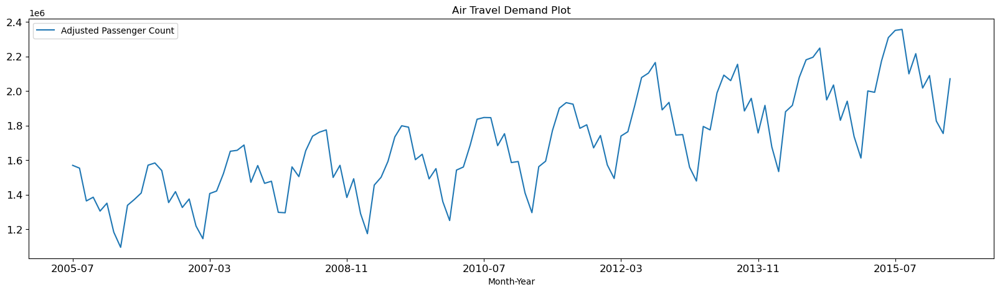

In [9]:
# plot overall dataset plot
dmd_series=air_travel[['YY_MM','Adjusted Passenger Count']].groupby('YY_MM').sum()
dmd_series.plot(figsize=(20, 5), title="Air Travel Demand Plot" , xlabel = "Month-Year", fontsize=12)
plt.show()

Observations: 129
Training Observations: 101
Testing Observations: 28


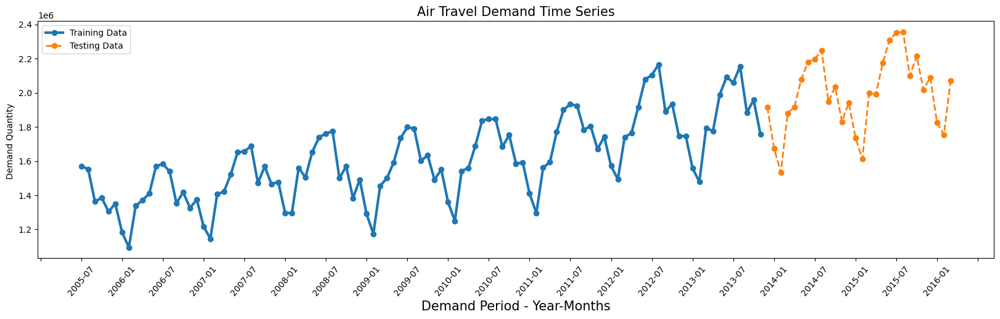

In [10]:
warnings.filterwarnings("ignore")
fig, ax = plt.subplots(figsize=(20, 5) )

train_pctg = 79 
X = dmd_series
train_size = int(len(X) * train_pctg / 100)
train, test = X[0:train_size], X[train_size:len(X)]
print('Observations: %d' % (len(X)))
print('Training Observations: %d' % (len(train)))
print('Testing Observations: %d' % (len(test)))
plt.plot(train ,'o-', label='Training Data', linewidth=3)
plt.plot(test , 'o--', label='Testing Data', linewidth=2)

ax.set_title("Air Travel Demand Time Series", fontsize='15')

ax.set_xlabel("Demand Period - Year-Months" , fontsize=15)
ax.set_ylabel("Demand Quantity ")
# Rotating X-axis labels
ax.tick_params(axis='x', labelrotation = 50)
space = 6
ax.xaxis.set_major_locator(ticker.MultipleLocator(space)) 
plt.legend()
plt.show()

### 2.5 Time Series and Dataset Split by Price Category Code

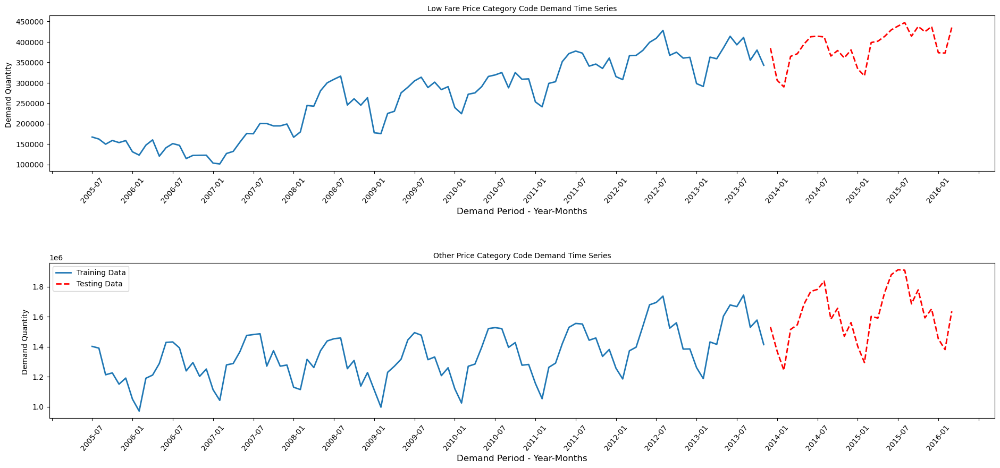

In [11]:
warnings.filterwarnings("ignore")
c = 0 
price_codes=air_travel['Price Category Code'].unique()
# create subplots
fig, ax = plt.subplots(nrows=len(price_codes), ncols=1, figsize=(20, 10) )
for s in price_codes:
    price_codes_series = air_travel[air_travel['Price Category Code']==s]
    price_codes_time_data=price_codes_series[['YY_MM','Adjusted Passenger Count']].groupby('YY_MM').sum()
    X = price_codes_time_data
    train_size = int(len(X) * train_pctg / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    ax[c].plot(train,  label='Training Data', linewidth=2)
    ax[c].plot(test , 'r--', label='Testing Data', linewidth=2)
    # Rotating X-axis labels
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].xaxis.set_major_locator(ticker.MultipleLocator(space)) 
   
    ax[c].set_title("{} Price Category Code Demand Time Series".format(s), fontsize='10')
    ax[c].set_xlabel("Demand Period - Year-Months" , fontsize=12)
    ax[c].set_ylabel("Demand Quantity ")    
    c += 1
    
# using padding
fig.tight_layout(pad=5.0)

plt.legend()


### 2.6 Time Series and Dataset Split by Price Category Code by Year

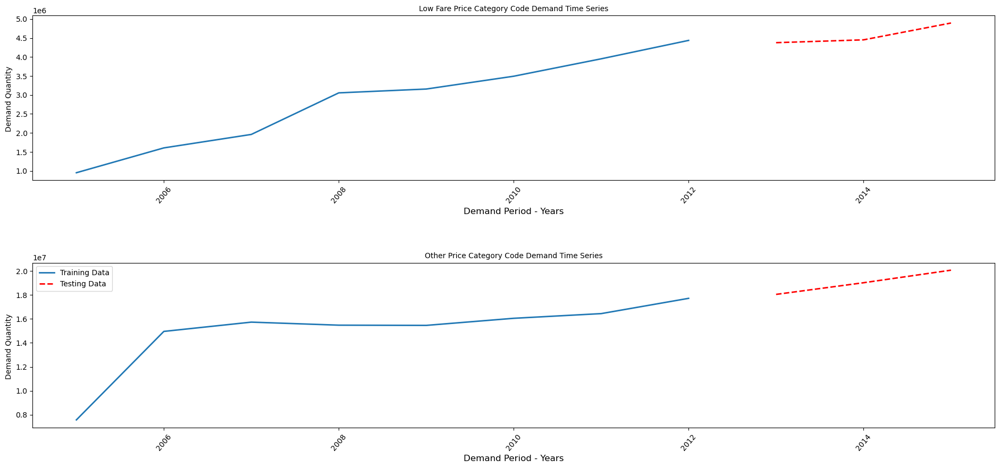

In [12]:
warnings.filterwarnings("ignore")
c = 0 
price_codes=air_travel['Price Category Code'].unique()
# create subplots
fig, ax = plt.subplots(nrows=len(price_codes), ncols=1, figsize=(20, 10) )
for s in price_codes:
    price_codes_series = air_travel[(air_travel['Price Category Code']==s) & (air_travel['Year']<2016)]
    price_codes_time_data=price_codes_series[['Year','Adjusted Passenger Count']].groupby('Year').sum()
    X = price_codes_time_data
    train_size = int(len(X) * train_pctg / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    ax[c].plot(train,  label='Training Data', linewidth=2)
    ax[c].plot(test , 'r--', label='Testing Data', linewidth=2)
    # Rotating X-axis labels
    ax[c].tick_params(axis='x', labelrotation = 50)   
    ax[c].set_title("{} Price Category Code Demand Time Series".format(s), fontsize='10')
    ax[c].set_xlabel("Demand Period - Years" , fontsize=12)
    ax[c].set_ylabel("Demand Quantity ")    
    c += 1
    
# using padding
fig.tight_layout(pad=5.0)

plt.legend()


### 2.7 Time Series Visualisation by Region
We excluded 'South America' region due to insufficient data points.

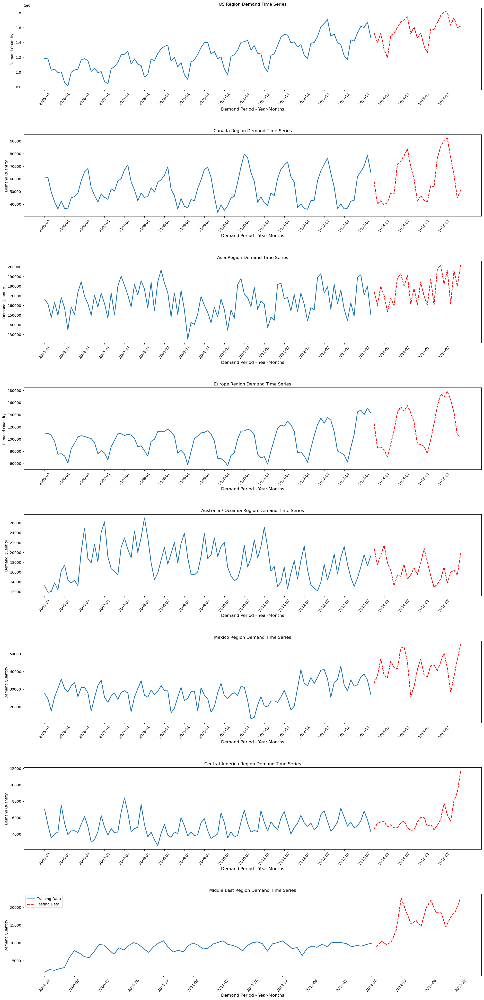

In [13]:
warnings.filterwarnings("ignore")
c = 0 
region=air_travel[air_travel['GEO Region']!='South America']['GEO Region'].unique()
fig, ax = plt.subplots(nrows=len(region), ncols=1, figsize=(20, 40))

for s in region:
    region_series = air_travel[(air_travel['GEO Region']==s) & (air_travel['Year']<2016)  & (air_travel['GEO Region']!='South America')]
    region_time_data=region_series[['YY_MM','Adjusted Passenger Count']].groupby('YY_MM').sum()
    X = region_time_data
    train_size = int(len(X) * train_pctg / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    ax[c].plot(train,  label='Training Data', linewidth=2)
    ax[c].plot(test , 'r--', label='Testing Data', linewidth=2)
    # Rotating X-axis labels
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].xaxis.set_major_locator(ticker.MultipleLocator(space)) 
    ax[c].set_title("{} Region Demand Time Series".format(s), fontsize='12')
    ax[c].set_xlabel("Demand Period - Year-Months" , fontsize=12)
    ax[c].set_ylabel("Demand Quantity ")
    c+=1
    
# using padding
fig.tight_layout(pad=5.0)

plt.legend()
plt.show()

### 2.8 Time Series Visualisation by Region By Year


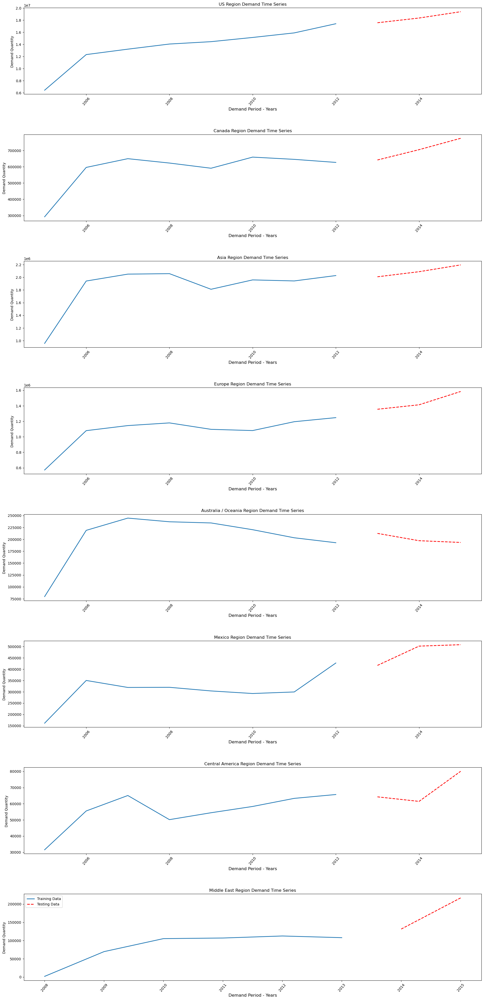

In [14]:
warnings.filterwarnings("ignore")
c = 0 
region=air_travel[air_travel['GEO Region']!='South America']['GEO Region'].unique()
fig, ax = plt.subplots(nrows=len(region), ncols=1, figsize=(20, 40))

for s in region:
    region_series = air_travel[(air_travel['GEO Region']==s) & (air_travel['Year']<2016)  & (air_travel['GEO Region']!='South America')]
    region_time_data=region_series[['Year','Adjusted Passenger Count']].groupby('Year').sum()
    X = region_time_data
    train_size = int(len(X) * train_pctg / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    ax[c].plot(train,  label='Training Data', linewidth=2)
    ax[c].plot(test , 'r--', label='Testing Data', linewidth=2)
    # Rotating X-axis labels
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].set_title("{} Region Demand Time Series".format(s), fontsize='12')
    ax[c].set_xlabel("Demand Period - Years" , fontsize=12)
    ax[c].set_ylabel("Demand Quantity ")
    c+=1
    
# using padding
fig.tight_layout(pad=5.0)

plt.legend()
plt.show()

### 2.9 Time Series Visualisation by GEO Summary

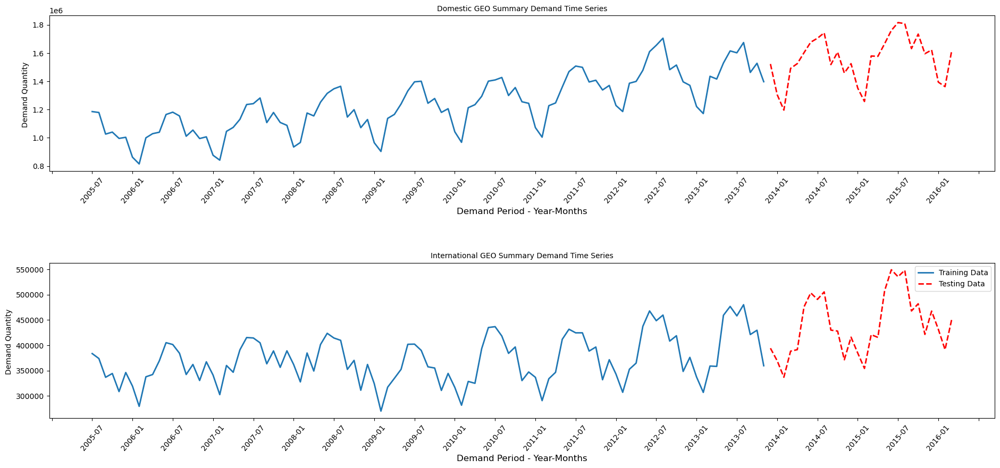

In [15]:
warnings.filterwarnings("ignore")
c = 0 
geo_summary=air_travel['GEO Summary'].unique()
# create subplots
fig, ax = plt.subplots(nrows=len(geo_summary), ncols=1, figsize=(20, 10) )
for s in geo_summary:
    geo_summary_series = air_travel[air_travel['GEO Summary']==s]
    geo_summary_time_data=geo_summary_series[['YY_MM','Adjusted Passenger Count']].groupby('YY_MM').sum()
    X = geo_summary_time_data
    train_size = int(len(X) * train_pctg / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    ax[c].plot(train,  label='Training Data', linewidth=2)
    ax[c].plot(test , 'r--', label='Testing Data', linewidth=2)
    # Rotating X-axis labels
    ax[c].tick_params(axis='x', labelrotation = 50)
    ax[c].xaxis.set_major_locator(ticker.MultipleLocator(space)) 
   
    ax[c].set_title("{} GEO Summary Demand Time Series".format(s), fontsize='10')
    ax[c].set_xlabel("Demand Period - Year-Months" , fontsize=12)
    ax[c].set_ylabel("Demand Quantity ")    
    c += 1
    
# using padding
fig.tight_layout(pad=5.0)

plt.legend()

### 2.10 Adjusted Passenger Count by Operating Airline

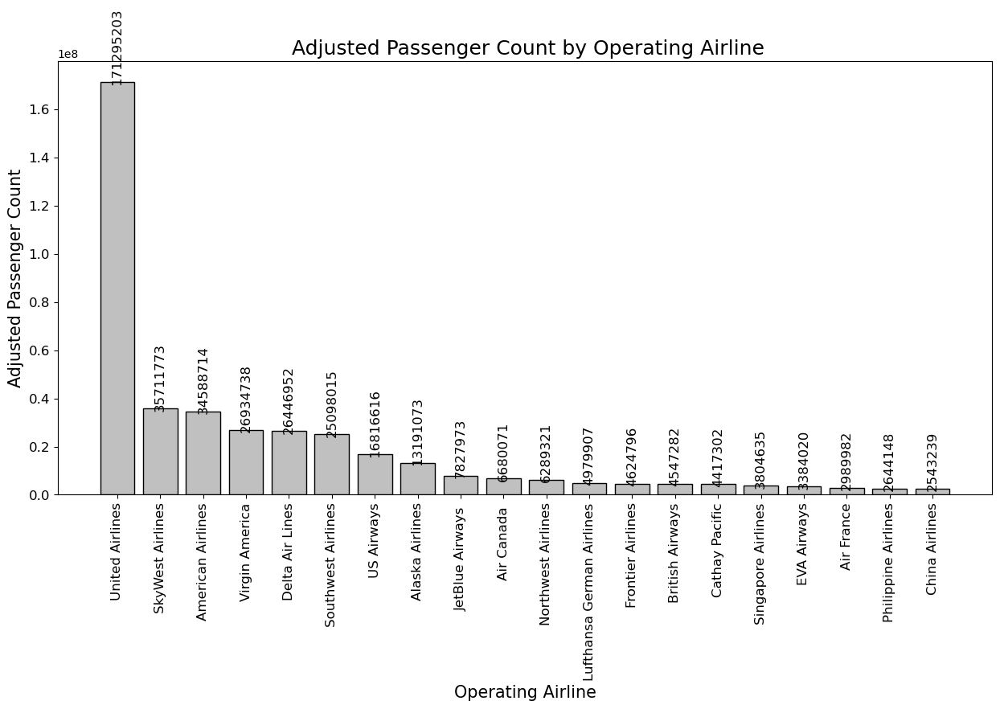

In [16]:
df_airline = air_travel_original.groupby(["Operating Airline"]).sum().sort_values("Adjusted Passenger Count", ascending=False).head(20) 
df_airline.reset_index(inplace=True) 
plt.figure(figsize = (15,7))
plt.title(" Adjusted Passenger Count by Operating Airline", fontsize=18) 
plt.bar(df_airline["Operating Airline"], df_airline["Adjusted Passenger Count"],color= 'silver', #'#227d3d',
        edgecolor='black', linewidth = 1)
plt.xlabel("Operating Airline",fontsize=15)
plt.ylabel("Adjusted Passenger Count",fontsize=15) 
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
for k,v in df_airline["Adjusted Passenger Count"].items():
    if v>300000:
        plt.text(k,v-120000, str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');
    else:
        plt.text(k,v+15000, str(v), fontsize=12,rotation=90,color='k', horizontalalignment='center');

#### Air Traffic Summary ####
We use different categorical variables to create a summary plot with sankey. We will use the sankey_ly function, a plotly wrapper that creates the data transformation and plots with plotly. We will rank the top 20 airlines during 2015 and plot the passengers distribution by airline, travel type (domestic or international), travel geo region, activity type (enplaned, deplaned and transit) and fare type (low or other):

In [17]:
yr_end = 2015
top_n = 20
air_travel_f =air_travel_original.loc[(air_travel_original['Year'] == yr_end)]

air_travel_g = air_travel_f.groupby(['Operating Airline']).sum('Adjusted Passenger Count').reset_index()
top_n_vals= air_travel_g.nlargest(top_n, 'Adjusted Passenger Count')
air_travel_f = air_travel_f[air_travel_f['Operating Airline'].isin(top_n_vals['Operating Airline'])]


color_link = ['#000000', '#FFFF00', '#1CE6FF', '#FF34FF', '#FF4A46',
             '#008941', '#006FA6', '#A30059','#FFDBE5', '#7A4900', 
             '#0000A6', '#63FFAC', '#B79762', '#004D43', '#8FB0FF',
             '#997D87', '#5A0007', '#809693', '#FEFFE6', '#1B4400', 
             '#4FC601', '#3B5DFF', '#4A3B53', '#FF2F80', '#61615A',
             '#BA0900', '#6B7900', '#00C2A0', '#FFAA92', '#FF90C9',
             '#B903AA', '#D16100', '#DDEFFF', '#000035', '#7B4F4B',                
             '#A1C299', '#300018', '#0AA6D8', '#013349', '#00846F',
             '#372101', '#FFB500', '#C2FFED', '#A079BF', '#CC0744',
             '#C0B9B2', '#C2FF99', '#001E09', '#00489C', '#6F0062', 
             '#0CBD66', '#EEC3FF', '#456D75', '#B77B68', '#7A87A1',
             '#788D66', '#885578', '#FAD09F', '#FF8A9A', '#D157A0',
             '#BEC459', '#456648', '#0086ED', '#886F4C', '#34362D', 
             '#B4A8BD', '#00A6AA', '#452C2C', '#636375', '#A3C8C9', 
             '#FF913F', '#938A81', '#575329', '#00FECF', '#B05B6F',
             '#8CD0FF', '#3B9700', '#04F757', '#C8A1A1', '#1E6E00',
             '#7900D7', '#A77500', '#6367A9', '#A05837', '#6B002C',
             '#772600', '#D790FF', '#9B9700', '#549E79', '#FFF69F', 
             '#201625', '#72418F', '#BC23FF', '#99ADC0', '#3A2465',
             '#922329', '#5B4534', '#FDE8DC', '#404E55', '#0089A3',
             '#CB7E98', '#A4E804', '#324E72', '#6A3A4C']

air_travel_g =air_travel_f.groupby(['Operating Airline', 'GEO Summary']).sum('Adjusted Passenger Count').reset_index()

src = air_travel_g['Operating Airline']
tgt = air_travel_g['GEO Summary']
vals = air_travel_g['Adjusted Passenger Count']

air_travel_g =air_travel_f.groupby(['Operating Airline', 'GEO Summary', 'GEO Region']).sum('Adjusted Passenger Count').reset_index()

src = pd.concat([src, air_travel_g['GEO Summary']])
tgt = pd.concat([tgt, air_travel_g['GEO Region']])
vals = pd.concat([vals, air_travel_g['Adjusted Passenger Count']])

air_travel_g =air_travel_f.groupby(['Operating Airline', 'GEO Summary', 'GEO Region', 'Adjusted Activity Type Code']).sum('Adjusted Passenger Count').reset_index()

src = pd.concat([src, air_travel_g['GEO Region']])
tgt = pd.concat([tgt, air_travel_g['Adjusted Activity Type Code']])
vals = pd.concat([vals, air_travel_g['Adjusted Passenger Count']])

air_travel_g =air_travel_f.groupby(['Operating Airline', 'GEO Summary', 'GEO Region', 'Adjusted Activity Type Code', 'Price Category Code']).sum('Adjusted Passenger Count').reset_index()

src = pd.concat([src, air_travel_g['Adjusted Activity Type Code']])
tgt = pd.concat([tgt, air_travel_g['Price Category Code']])
vals = pd.concat([vals, air_travel_g['Adjusted Passenger Count']])

node_label = pd.concat([src, tgt]) 
unq = set(node_label)
node_label = np.array(list(unq))

node_dict = {y:x for x, y in enumerate(node_label)}
source_node = [node_dict[x] for x in src]
target_node = [node_dict[x] for x in tgt]

link3 = dict(source=source_node, target=target_node, value=vals, color=color_link)
node3 = dict(label = node_label, pad=35, thickness=20)
data3 = go.Sankey(link=link3)

fig3 = ig = go.Figure( 
    data=[go.Sankey( # The plot we are interest
        # This part is for the node information
        node = dict( 
            label = node_label
        ),
        # This part is for the link information
        link = dict(
            source = source_node,
            target = target_node,
            value = vals
        ))])
fig3.update_layout(
    hovermode='x',
    title='Passengers Distribution During 2015',
    font=dict(size=10, color='white'),
    paper_bgcolor='#51504f'
)
fig3.show()

Let’s see the distribution of passengers by geo type (domestic vs. international):

In [18]:
air_travel_sum =air_travel_original.loc[(air_travel_original['Year'] == yr_end)].groupby(['GEO Summary']).sum('Adjusted Passenger Count').reset_index()
fig = px.pie(air_travel_original, values='Adjusted Passenger Count', names='GEO Summary')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

About 77% of the air passengers traffic during 2015 were domestic.<br><br>Let’s use tree map plot to see the distribution of passengers by airline and geo region:

In [19]:
fig = px.treemap(air_travel_original.loc[(air_travel_original['Year'] == yr_end) & (air_travel_original['GEO Summary'] == 'Domestic')], path=[px.Constant("Domestic"), 'Operating Airline'], 
                 values='Adjusted Passenger Count', color='Operating Airline', color_discrete_map={'(?)':'lightgrey'})
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.data[0].textinfo = 'label+text+value+percent parent'
fig.show()

fig = px.treemap(air_travel_original.loc[(air_travel['Year'] == yr_end) & (air_travel_original['GEO Summary'] == 'International')], path=[px.Constant("International"), 'Operating Airline'], 
                 values='Adjusted Passenger Count', color='Operating Airline', color_discrete_map={'(?)':'lightgrey'})
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.data[0].textinfo = 'label+text+value+percent parent'
fig.show()

We can see that United Airlines is the major carrier in both domestic and international flights.

#### United States Travel Expenditures: ####

In [20]:
import plotly.graph_objects as go
yr_str = 2005
yr_end = 2016
air_travel_sum =air_travel_original.loc[((air_travel_original['Year'] > yr_str) 
                                     & (air_travel_original['Year'] < yr_end) 
                                     & (air_travel_original['GEO Summary'] == 'Domestic'))]
air_travel_sum = air_travel_sum.groupby(['Year']).sum('Adjusted Passenger Count').reset_index()
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=air_travel_sum['Year'], y=air_travel_sum['Adjusted Passenger Count'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='rgb(184, 247, 212)'),
    stackgroup='one',
    name = 'Domestic'
))

air_travel_sum =air_travel_original.loc[((air_travel_original['Year'] > yr_str) 
                                     & (air_travel_original['Year'] < yr_end) 
                                     & (air_travel_original['GEO Summary'] == 'International'))]
air_travel_sum = air_travel_sum.groupby(['Year']).sum('Adjusted Passenger Count').reset_index()
fig.add_trace(go.Scatter(
    x=air_travel_sum['Year'], y=air_travel_sum['Adjusted Passenger Count'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='rgb(131, 90, 241)'),
    name = 'International',
    stackgroup='one' # define stack group
))
fig.update_layout()
fig.show()

We observe that there is a significant growth in the trend from 2007 up until 2012, with passenger numbers levelling off after that. This is applicable to both domestic and international travel. However, there is a larger demand for domestic air travel.


#### Monthly distribution of passengers: ####

In [21]:
air_travel_sum =air_travel_original.loc[((air_travel_original['Operating Airline'] == 'KLM Royal Dutch Airlines') 
                                     | (air_travel_original['Operating Airline'] == 'American Airlines') 
                                     | (air_travel_original['Operating Airline'] == 'Delta Air Lines') 
                                     | (air_travel_original['Operating Airline'] == 'Southwest Airlines') 
                                     | (air_travel_original['Operating Airline'] == 'United Airlines'))]
air_travel_sum = air_travel_sum.groupby(['Operating Airline', 'Year', 'Month']).sum('Adjusted Passenger Count').reset_index()
month_names = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
fig = px.scatter(air_travel_sum, y="Year", x="Adjusted Passenger Count", color="Operating Airline", facet_col="Month", 
                 labels={"Adjusted Passenger Count": "Passengers"},
                 category_orders={"Month": month_names})
fig.show()

Here is the monthly distribution of pessengers for selected airlines during 2015:

In [22]:
air_travel_sum =air_travel_original.loc[((air_travel_original['Operating Airline'] == 'Southwest Airlines') 
                                     | (air_travel_original['Operating Airline'] == 'Delta Air Lines') 
                                     | (air_travel_original['Operating Airline'] == 'United Airlines'))]
air_travel_sum = air_travel_sum.groupby(['Operating Airline', 'Year', 'MM']).sum('Adjusted Passenger Count').reset_index()

In [23]:
import plotly.graph_objects as go

fig = go.Figure()

yr_end = 2015

fig.add_trace(go.Scatter(
    x=month_names, y=air_travel_sum.loc[(air_travel_sum['Year'] == yr_end) 
                                     & (air_travel_sum['Operating Airline'] == 'Southwest Airlines')]['Adjusted Passenger Count'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='rgb(184, 247, 212)'),
    stackgroup='one',
    name = 'Southwest Airlines'
))
fig.add_trace(go.Scatter(
    x=month_names, y=air_travel_sum.loc[(air_travel_sum['Year'] == yr_end) 
                                     & (air_travel_sum['Operating Airline'] == 'Delta Air Lines')]['Adjusted Passenger Count'],
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='rgb(111, 231, 219)'),
    stackgroup='one',
    name = 'Delta Air Lines'
))
fig.add_trace(go.Scatter(
    x=month_names, y=air_travel_sum.loc[(air_travel_sum['Year'] == yr_end) 
                                     & (air_travel_sum['Operating Airline'] == 'United Airlines')]['Adjusted Passenger Count'], 
    hoverinfo='x+y',
    mode='lines',
    line=dict(width=0.5, color='rgb(131, 90, 241)'),
    name = 'United Airlines',
    stackgroup='one' # define stack group
))
fig.update_layout()
fig.show()

We see that passenger numbers appear to be highest from approximately May — September, after which we see a dip in numbers for the rest of the year.

In [24]:
df_piv = air_travel_original[["Price Category Code","GEO Summary", "Adjusted Passenger Count"]]
pd.pivot_table(df_piv , values = 'Adjusted Passenger Count' , index = 'GEO Summary' , columns = 'Price Category Code' , aggfunc = 'sum')

Price Category Code,Low Fare,Other
GEO Summary,,
Domestic,74527292,264515345
International,680815,100460628


<Axes: xlabel='Price Category Code', ylabel='count'>

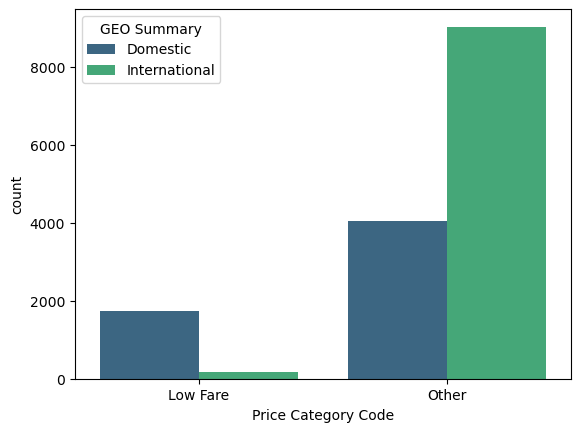

In [25]:
sns.countplot(data = air_travel_original, x = 'Price Category Code' , hue = 'GEO Summary'  , palette = 'viridis')

The above graph shows that the 'Low fare' price code category is popular in Domestic flights. The 'Other' price category code has the most passengers on international flights.

<Axes: xlabel='Price Category Code', ylabel='count'>

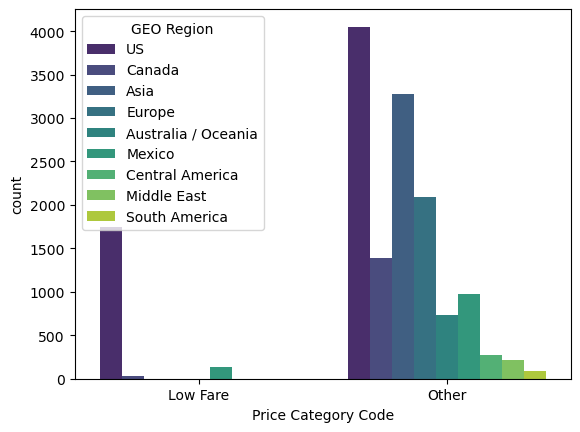

In [26]:
sns.countplot(data = air_travel_original , x = 'Price Category Code' , hue = 'GEO Region'  , palette = 'viridis')

We see the highest air travel demand in the US region under the 'Other' price category code. To evaluate the forecasting models, we will select the 'Other' price code category and US region as sample data.

## 3. Exploratory Data Analysis. (EDA)
### 3.1 Create Datasets for Forecasting by Price Category Code , GEO Region , GEO Summary , and Operating Airline
Here are the main attributes that can be used to slice the data: Price Category Code, GEO Region, GEO Summary, and Operating Airline. We will filter and create separate datasets for each attribute to use in the forecasting model. In our visualizations above, we observed the highest records for some combined attributes, so we will also create some combined datasets to test our model on such high-demand attributes. Sometimes, forecasting on a focused dataset helps businesses improve product projection accuracy across regions, increasing overall sales and profitability.

In [27]:
print(price_codes)
print(region)
print(geo_summary)


['Low Fare' 'Other']
['US' 'Canada' 'Asia' 'Europe' 'Australia / Oceania' 'Mexico'
 'Central America' 'Middle East']
['Domestic' 'International']


In [28]:
# by Price Category Code
low_fare_price_ds= air_travel[air_travel['Price Category Code']=='Low Fare']
other_price_ds= air_travel[air_travel['Price Category Code']=='Other']

In [29]:
# by Price GEO Summary Code
domestic_ds= air_travel[air_travel['GEO Summary']=='Domestic']
international_ds= air_travel[air_travel['GEO Summary']=='International']

In [30]:
# by GEO Region
us_ds= air_travel[air_travel['GEO Region']=='US']
canada_ds= air_travel[air_travel['GEO Region']=='Canada']
asia_ds= air_travel[air_travel['GEO Region']=='Asia']
europe_ds= air_travel[air_travel['GEO Region']=='Europe']
australia_ds= air_travel[air_travel['GEO Region']=='Australia / Oceania']
mexico_ds= air_travel[air_travel['GEO Region']=='Mexico']
central_america_ds= air_travel[air_travel['GEO Region']=='Central America']
middle_east_ds= air_travel[air_travel['GEO Region']=='Middle East']

In [31]:
# Create Combined datasets
us_otherPriceCode_ds= air_travel[ (air_travel['Price Category Code']=='Other') & (air_travel['GEO Region']=='US') ]
domestic_lowFarePriceCode_ds= air_travel[ (air_travel['Price Category Code']=='Low Fare') & (air_travel['GEO Summary']=='Domestic') ]
us_unitedAirline_ds= air_travel[ (air_travel['Operating Airline']=='United Airlines') & (air_travel['GEO Region']=='US') ]

In [32]:
# Create airline datasets
unitedAirline_ds= air_travel[(air_travel['Operating Airline'].str.startswith('United Airlines'))]
display(unitedAirline_ds.head())
americanAirline_ds= air_travel[air_travel['Operating Airline']=='American Airlines']
klm_ds= air_travel[air_travel['Operating Airline']=='KLM Royal Dutch Airlines']

,Activity Period,Operating Airline,Operating Airline IATA Code,Published Airline,Published Airline IATA Code,GEO Summary,GEO Region,Activity Type Code,Price Category Code,Terminal,Boarding Area,Passenger Count,Adjusted Activity Type Code,Adjusted Passenger Count,Year,Month,MM,YY_MM,YY_Month,Activity_Period_Start_Date
90,200507,United Airlines,UA,United Airlines,UA,Domestic,US,Enplaned,Other,Terminal 1,B,60939,Enplaned,60939,2005,July,07,2005-07,2005-July,2005-07-01
92,200507,United Airlines,UA,United Airlines - Pre 07/01/2013,UA,Domestic,US,Enplaned,Low Fare,Terminal 3,E,58277,Enplaned,58277,2005,July,07,2005-07,2005-July,2005-07-01
94,200507,United Airlines,UA,United Airlines - Pre 07/01/2013,UA,Domestic,US,Enplaned,Other,Terminal 3,F,421802,Enplaned,421802,2005,July,07,2005-07,2005-July,2005-07-01
97,200507,United Airlines,UA,United Airlines - Pre 07/01/2013,UA,International,Asia,Enplaned,Other,International,G,68278,Enplaned,68278,2005,July,07,2005-07,2005-July,2005-07-01
100,200507,United Airlines,UA,United Airlines - Pre 07/01/2013,UA,International,Australia / Oceania,Enplaned,Other,International,G,8234,Enplaned,8234,2005,July,07,2005-07,2005-July,2005-07-01


### 3.2 Create Formatted Full + Training + Testing dataset from Main Data source using function
We will create function to create 3 formmated dataset - Full_Dataset, and Train_Dataset, Test_Dataset which we will be used in various function ahead to plot and calculate Foreasting model calculation and plot forecasting output.   

In [33]:
######## Function to Create Traing and Testing Dataset from Dataframe 
def create_dataset(df, train_size_percentage):
    full_dataset=df[['YY_MM','Adjusted Passenger Count']].groupby('YY_MM').sum()
    train_size = round((train_size_percentage / 100) * (len(full_dataset)))
    test_size = len(full_dataset) - train_size
    train_dataset, test_dataset = full_dataset[0:train_size], full_dataset[train_size:len(full_dataset)]
    return full_dataset, train_dataset, test_dataset

In [34]:
# Create Formatted Dataset for Price Category Code
low_fare_full_df, low_fare_train_df , low_fare_test_df = create_dataset(low_fare_price_ds, train_pctg)
other_full_df, other_train_df , other_test_df = create_dataset(low_fare_price_ds, train_pctg)

In [35]:
# Create Formatted Dataset for GEO Region
us_full_df, us_train_df , us_test_df = create_dataset(us_ds, train_pctg)
canada_full_df, canada_train_df , canada_test_df = create_dataset(canada_ds, train_pctg)
asia_full_df, asia_train_df , asia_test_df = create_dataset(asia_ds, train_pctg)
europe_full_df, europe_train_df , europe_test_df = create_dataset(europe_ds, train_pctg)
australia_full_df, australia_train_df , australia_test_df = create_dataset(australia_ds, train_pctg)
mexico_full_df, mexico_train_df , mexico_test_df = create_dataset(mexico_ds, train_pctg)
central_america_df, central_america_train_df , central_america_test_df = create_dataset(central_america_ds, train_pctg)
middle_east_df, middle_east_train_df , middle_east_test_df = create_dataset(middle_east_ds, train_pctg)

In [36]:
# Create Formatted Dataset for GEO Summary
domestic_full_df, domestic_train_df , domestic_test_df = create_dataset(domestic_ds, train_pctg)
international_full_df, international_train_df , international_test_df = create_dataset(international_ds, train_pctg)

In [37]:
# Create Formatted Dataset for Combined datasets
us_otherPriceCode_full_df, us_otherPriceCode_train_df , us_otherPriceCode_test_df = create_dataset(us_otherPriceCode_ds, train_pctg)
domestic_lowFarePriceCode_full_df, domestic_lowFarePriceCode_train_df , domestic_lowFarePriceCode_test_df = create_dataset(domestic_lowFarePriceCode_ds, 66)
us_unitedAirline_full_df, us_unitedAirline_train_df , us_unitedAirline_test_df = create_dataset(us_unitedAirline_ds, train_pctg)

In [38]:
# Create Formatted Dataset for Operating Airline
unitedAirline_full_df, unitedAirline_train_df , unitedAirline_test_df = create_dataset(unitedAirline_ds, train_pctg)
americanAirline_full_df, americanAirline_train_df , americanAirline_test_df = create_dataset(americanAirline_ds, train_pctg)
klm_full_df, klm_train_df , klm_test_df = create_dataset(klm_ds, train_pctg)

In [39]:
####### Function to Create Yearly Traing and Testing Dataset from Dataframe 
def create_yearly_dataset(df, train_size_percentage):
    full_dataset=df[['Year','Adjusted Passenger Count']].groupby('Year').sum()
    train_size = round((train_size_percentage / 100) * (len(full_dataset)))
    test_size = len(full_dataset) - train_size
    train_dataset, test_dataset = full_dataset[0:train_size], full_dataset[train_size:len(full_dataset)]
    return full_dataset, train_dataset, test_dataset

In [40]:
low_fare_yearly_full_df, low_fare_yearly_train_df , low_fare_yearly_test_df = create_yearly_dataset(low_fare_price_ds, train_pctg)
other_yearly_full_df, other_yearly_train_df , other_yearly_test_df = create_yearly_dataset(other_price_ds, train_pctg)

#### For the purpose of this project we will take one or more Dataset from Each Section
From Price Category Code: Other price cateogory code <br>
From GEO Region: US <br>
From GEO Summary: International <br>
From Combined attributes: <br>
Domestic - Low fare price category code <br>
From Operating Airline: <br>
KLM<br>
United Airline <br>
American Airline <br>
### 3.3 Summary Statistics
Summary Statistics summarizes and provides the gist of information about the sample data. It can include mean, median, mode, minimum value, maximum value, range, standard deviation, etc. Below are the summary statistics of the United Airlines and US region datasets.

In [41]:
klm_full_df.describe()

,Adjusted Passenger Count
count,129.000000
mean,9062.155039
std,2584.274473
min,4421.000000
25%,6542.000000
50%,9513.000000
75%,11633.000000
max,12888.000000


In [42]:
unitedAirline_full_df.describe()

,Adjusted Passenger Count
count,129.000000
mean,654412.736434
std,92823.320734
min,453529.000000
25%,591246.000000
50%,649946.000000
75%,715628.000000
max,874616.000000


In [43]:
us_full_df.describe()

,Adjusted Passenger Count
count,1.290000e+02
mean,1.307297e+06
std,2.340760e+05
min,8.150130e+05
25%,1.146897e+06
50%,1.293854e+06
75%,1.482529e+06
max,1.815878e+06


### 3.4 Plot Series Graphs
Graphical visualizations help us understand the trends, seasonality, and residual component in the dataset. This information is required to select a suitable Forecasting Model. We will create a function to plot the following graphs: 

1. Line Plot
2. Histogram Plot
3. Density Plot
4. Box Plot
5. Detrend Residual EDA Plot
<br>
We will take the log transform of data using Boxcox transformation with lambda=0 and then remove the trend component from the series to plot a series graph along with histogram, density, residual & autocorrelation plots.  


In [44]:
def plot_dataseries(df, name):
    from matplotlib import pyplot
    fig, ax = plt.subplots(1, 4 ,figsize=(25, 4) )
    df = df.reset_index()
    df_box= df
    df_box['year'] = df_box['YY_MM'].astype(str).str[:4]
    df_box = df[['year','Adjusted Passenger Count']]
    series= df['Adjusted Passenger Count']
    plt.subplot(1, 4, 1)
    series.plot(title="Series Plot for "+name)
    
    plt.subplot(1, 4, 2)
    series.hist()
    plt.title("Histogram for "+name)
    
    plt.subplot(1, 4, 3)
    series.plot(kind='kde',title="Density Plot for "+name)
   
    plt.subplot(1, 4, 4 )
    sns.boxplot(x=df_box['year'], y=df_box['Adjusted Passenger Count'] , palette="Blues" , width=0.3)
    # Rotating X-axis labels
    plt.tick_params(axis='x', labelrotation = 50)
    
    plt.title("Boxplot for "+name)
    plt.show()


def plot_detrend_series(df , dataset_name ):
    fig, axs = pyplot.subplots(2, 3 ,figsize=(25, 6) )
    series = df
    X= [i for i in range(0, len(df))]
    X = np.reshape(X, (len(X), 1))
    y = boxcox(df['Adjusted Passenger Count'],0.0)  ## Used BoxCoX Transformation to do log transformation with lambda = 0.0
    model = LinearRegression()
    model.fit(X, y)
    trend = model.predict(X)
    # plot trend
    pyplot.subplot(2,3,1)
    pyplot.plot(y)
    pyplot.plot(trend)
    pyplot.title("Log Transform Trend Plot for "+dataset_name)
    trend_df= DataFrame(trend)
    # detrend
    detrended = [y[i]-trend[i] for i in range(0, len(series))]
    #####################################################################  
    # plot detrended
    pyplot.subplot(2, 3, 2)
    pyplot.plot(detrended)
    pyplot.title("De-Trend Plot for "+dataset_name )
    residuals = DataFrame(detrended)
  
    pyplot.subplot(2, 3, 3)
    pyplot.hist(residuals)
    pyplot.title("Histogram of DeTrend Series for "+dataset_name )
    
    # density plot
    pyplot.subplot(2, 3, 4)
    sns.kdeplot(detrended )
    pyplot.title("Density plot for DeTrend Series for "+dataset_name )
   
    pyplot.subplot(2, 3, 5)
    qqplot(residuals, line='r', ax=pyplot.gca())
    pyplot.title("QQ plot DeTrend Series for "+dataset_name )

    pyplot.subplot(2, 3, 6)
    autocorrelation_plot(residuals, ax=pyplot.gca())
    pyplot.title("Autocoraltion DeTrend Series for "+dataset_name )
    pyplot.show()
    return residuals

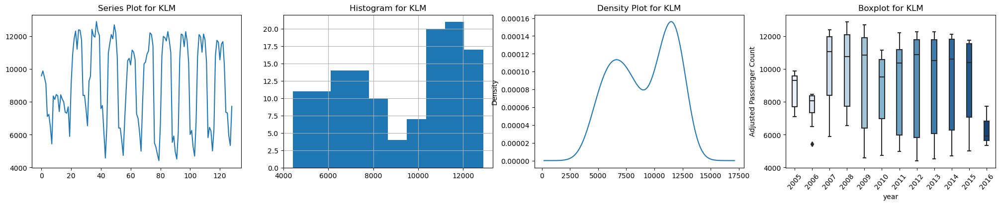

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


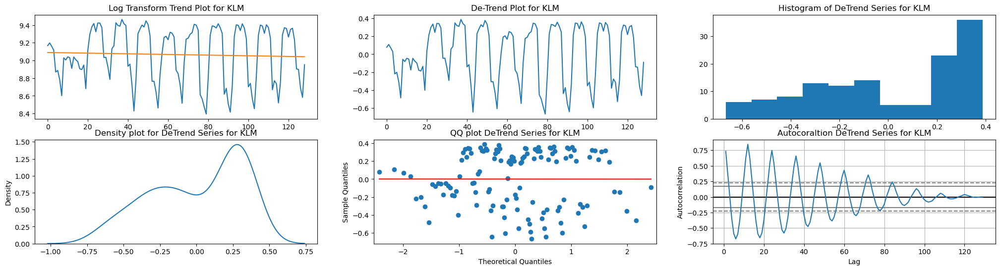

In [45]:
plot_dataseries(klm_full_df,'KLM')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( klm_full_df, "KLM")

#### Observations of KLM
* As we can see from the Line plot KLM time series shows quite a pattern where there is a constant mean, variance and autocorrelation. There appears to be significant seasonality present in the dataset — i.e. significant shifts in the time series trend that occur at certain time intervals. From a visual inspection of the time series, it appears that this shift happens approximately every eight months or so.
* The Density function suggests that the distribution is not Gaussian.
* Box Plot:
    * The median values for each year may show an increasing trend. The year 2016 was an exception. We do not see outliers in the data.
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable.
* De-Trend Transform plot:
    * The Log Transform linear plot shows a trend component in the series.
    * The Density plot is skewed to the left.
    * The auto-correlation plot shows a strong seasonal component. We see some significant lag at various points and will investigate this seasonal component using our forecasting model. Seasonal Model might be better fit model for this series.

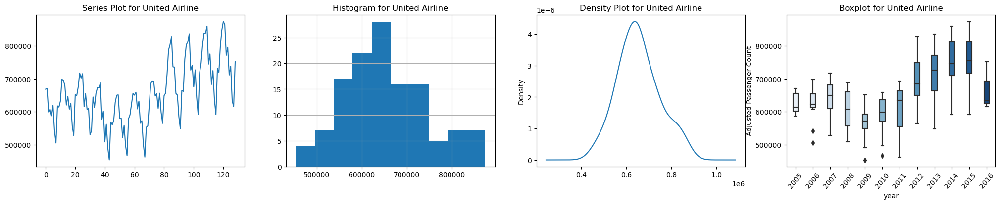

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


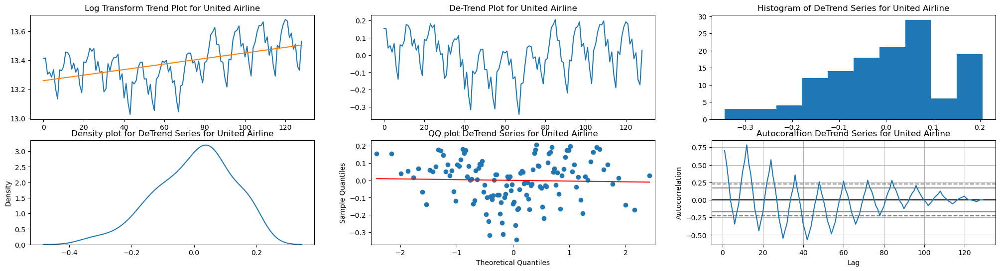

In [46]:
plot_dataseries(unitedAirline_full_df,'United Airline')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( unitedAirline_full_df, "United Airline")

#### Observations of United Airline
* The Line plot suggests that the United Airlines dataset has an additive increase over time with some seasonal spikes.
* The Density function suggests that the distribution is not Gaussian.
* Box Plot:
    * The median values for each year may show an increasing trend. The year 2016 was an exception. We dont see outliers in the data.
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable.
* De-Trend Transform plot:
    * The Log Transform linear plot shows a clear trend component in the series.
    * The Density plot is slightly skewed to the left.
    * The auto-correlation plot shows a strong seasonal component. We see some significant lag at various points and will investigate this seasonal component using our forecasting model.Seasonal Model might be better fit model for this series.

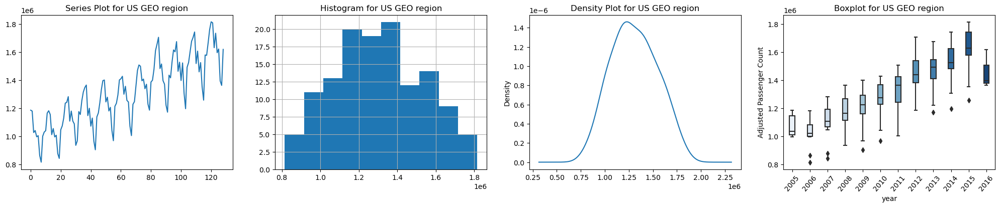

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


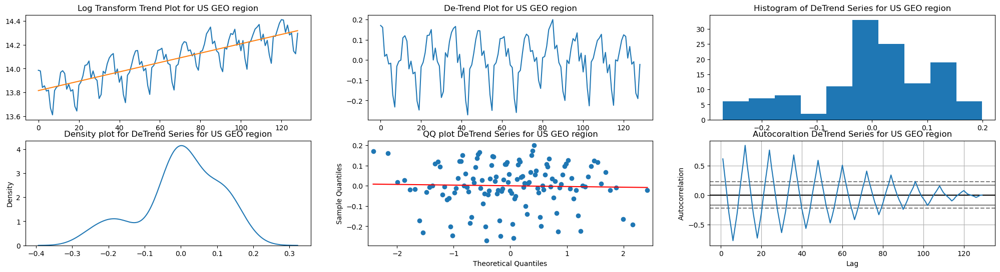

In [47]:
plot_dataseries(us_full_df,'US GEO region')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( us_full_df, "US GEO region")

#### Observations of US GEO region
* The Line plot suggests that the US GEO region dataset has a seasonal component in series with an increasing trend over time.
* The Density function suggests that the distribution is not Gaussian.
* Box Plot: <br> 
    * The median values for each year may show an increasing trend. The year 2016 was an exception. We dont see outliers in the data. 
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable. 
* De-Trend Transform plot:
    * The Log Transform linear Plot of the US GEO region shows a trend component in it. The de-trend series shows a small variation at the end of the series while the initial months have quite a variation.  
    * The Density plot also shows a left lag. The Residual plot is homoskedastic.
    * The auto-Correlation plot shows a strong seasonal component. We see some significant lag at various points and will investigate this seasonal component using our forecasting model. Seasonal Model might be better fit model for this series.

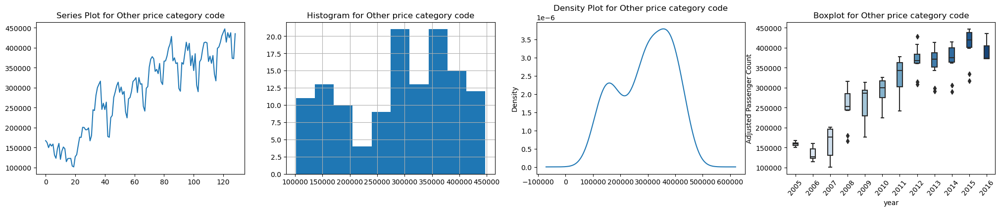

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


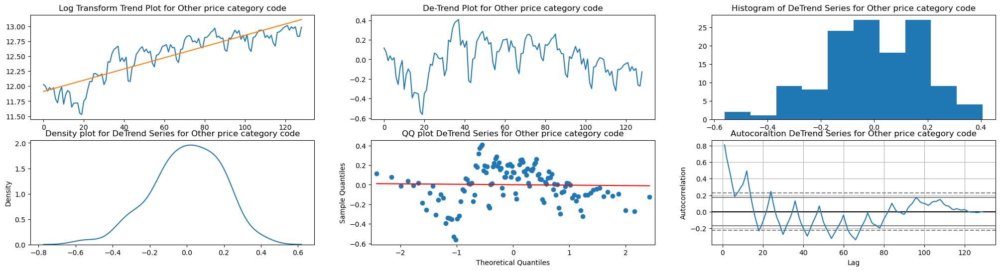

In [48]:
plot_dataseries(other_full_df,'Other price category code')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( other_full_df, "Other price category code")


#### Observations of Other Price category code
* The Line plot suggests that the Other Price category code dataset has a seasonal component in series with an increasing trend over time.  
* The Density function suggests that distribution is not Gaussian.
* Box Plot: <br> 
    * The median values for each year show an increasing trend. The Year 2016 was an exception. We dont see outliers in the data. 
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable. 
* De-Trend Transform plot:
    * The Log Transform linear Plot of the Other Price category code dataset also shows a trend component in it.
    * The Density plot also shows a left lag. The Residual plot is homoskedastic.
    * The Auto-Correlation plot shows a strong seasonal component. We see some significant lag at various points and will investigate this seasonal component using our forecasting model. Seasonal Model might be better fit model for this series.

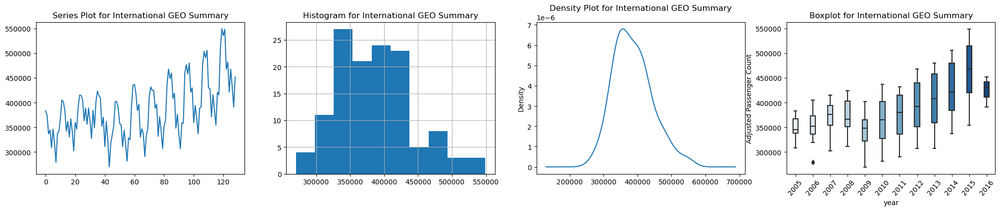

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


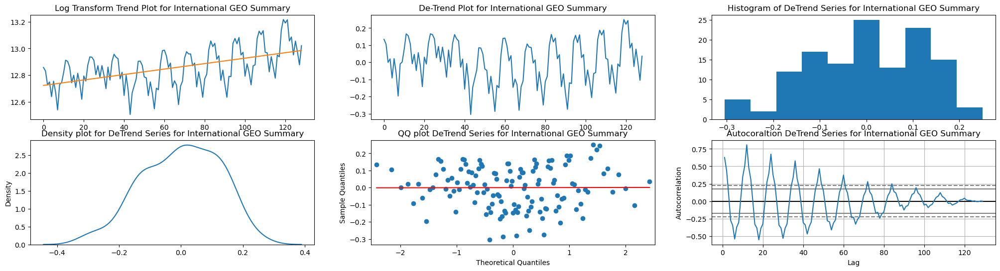

In [49]:
plot_dataseries(international_full_df,'International GEO Summary')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( international_full_df, "International GEO Summary")


#### Observations of International GEO Summary
* The Line plot suggests that the International GEO Summary dataset has a seasonal component in series with increasing trend over time.
* The Density function suggests that the distribution is not Gaussian.
* Box Plot: <br> 
    * The median values for each year show an increasing trend overall. The Year 2016 was an exception. We dont see outliers in the data. 
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable. 
* De-Trend Transform plot:
    * The Log Transform Linear Plot of International GEO Summary also shows a trend component in it.
    * The Density plot also shows a left lag. The Residual plot is homoskedastic.
    * Tha Auto-Correlation plot shows strong seasonal component. We see some significant lag at various points and will investigate this seasonal component using our forecasting model. Seasonal Model might be better fit model for this series.

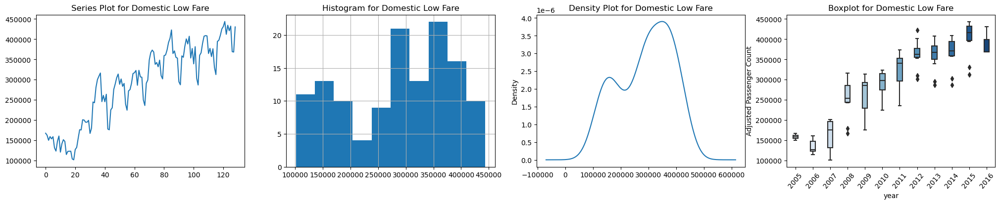

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------


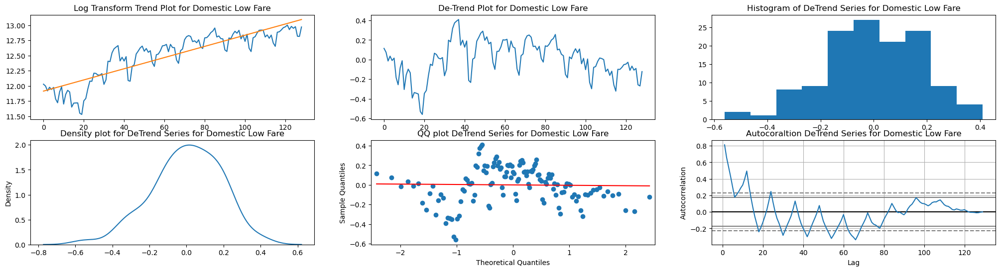

In [50]:
plot_dataseries(domestic_lowFarePriceCode_full_df,'Domestic Low Fare')
print("-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
series_detrend=plot_detrend_series( domestic_lowFarePriceCode_full_df, "Domestic Low Fare")


#### Observations of Domestic Low Fare
* The Line plot suggests that the Domestic Low Fare dataset has a seasonal component in series with increasing trend over time.
* The Density function suggests that the distribution is not Gaussian.
* Box Plot: <br> 
    * The median values for each year may show an increasing trend. The Year 2016 was an exception. We dont see outliers in the data. 
    * The spread or middle 50% of the data (blue boxes) appears reasonably stable. 
* De-Trend Transform plot:
    * The Log Transform Linear Plot of the Domestic Low Fare dataset also shows a trend component in it. De-trend series shows initial variation in demand, which reduces over time.
    * The Density plot also shows a left lag. The Residual plot is homoskedastic.
    * The Auto-Correlation plot shows some seasonal component on postive and negative side. Seasonal Model might be better fir model for this series. Seasonal Model might be better fit model for this series.

### 4. Create, Fit Model and Generate Forecast
We will evaluate below Forecasting Models:
* 4.1 Print Autocorelation Params
* 4.2 Linear Regression Forecasting Model(Deg=2) with BoCox Transformation
* 4.3 ARIMA Forecasting Model
* 4.4 Autoregression Forecasting Model
* 4.5 SARIMAX Forecasting Model
* 4.6 Prophet Foreacst Forecasting Model

### 4.1 Print Autocorelation Params

In [51]:
def print_plot_autocorelation(df,months_in_year, dataset_name):
    from pandas import Series
    #from statsmodels.tsa.stattools import adfuller
    def difference(dataset, interval=1):
        diff = list()
        for i in range(interval, len(dataset)):
            value = dataset[i] - dataset[i - interval]
            diff.append(value)
        return Series(diff)

    X = pd.Series( df['Adjusted Passenger Count']).values #series.values
    #X= series.values
    #print(X)
    X = X.astype('float')
    # difference data
    months_in_year = 12
    stationary = difference(X, months_in_year)
    stationary.index = df.index[months_in_year:]
    # check if stationary
    result = adfuller(stationary)
    print("ADF Statistic for :" + dataset_name)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    ## Plot Stationary
    pyplot.figure(figsize=(20,4))
    pyplot.subplot(131)
    stationary.plot(title = "Stationary Series Plot for "+ dataset_name)
    # Rotating X-axis labels
    plt.tick_params(axis='x', labelrotation = 50)
    
    pyplot.subplot(132)
    plot_acf(stationary, lags=11, ax=pyplot.gca(), title = "Autocorelation plot for :" + dataset_name)
    pyplot.subplot(133)
    plot_pacf(stationary, lags=11, ax=pyplot.gca(), title = "Partial Autocorelation plot for :" + dataset_name)
    pyplot.show()

ADF Statistic for :KLM
ADF Statistic: -2.525378
p-value: 0.109421
Critical Values:
	1%: -3.518
	5%: -2.900
	10%: -2.587


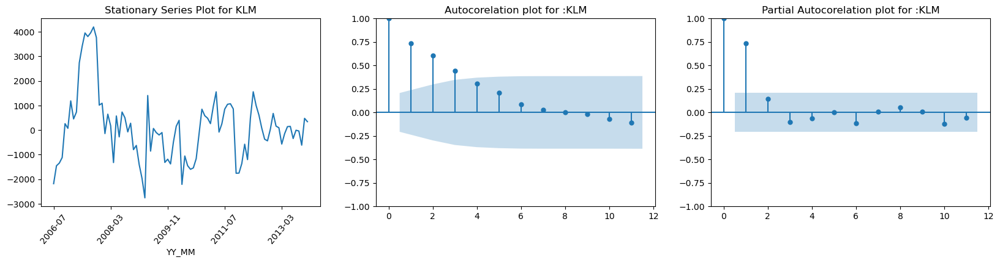

In [52]:
print_plot_autocorelation(klm_train_df,12, "KLM")

#### Autocorelation Observation for KLM

* The results show that the test statistic value -2.5 is greater than the critical value at 1% of -3.5. This suggests that we cannot reject the null hypothesis and can conclude that the process has a unit root, and in turn that the time series is not stationary
* The ACF shows significant lags and declines slowly.
* The PACF shows a significant lag for 1 month, with perhaps some significant lag at 2nd month.

ADF Statistic for :United Airlines
ADF Statistic: -2.260012
p-value: 0.185189
Critical Values:
	1%: -3.506
	5%: -2.895
	10%: -2.584


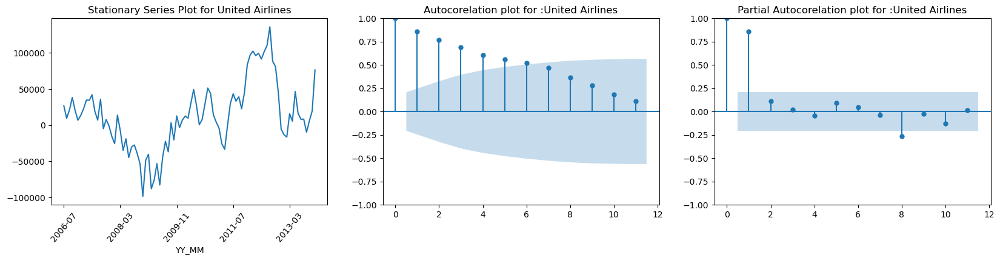

In [53]:
print_plot_autocorelation(unitedAirline_train_df,12, "United Airlines")

#### Autocorelation Observation for United Airline

* The results show that the test statistic value -2.26 is greater than the critical value at 1% of -3.506. This suggests that we cannot reject the null hypothesis and can conclude that the process has a unit root, and in turn that the time series is not stationary
* The autocorrelations decline slowly. The initial lags are significant.
* The PACF shows a significant lag for 1 month, with perhaps some significant lag at 2nd month.

ADF Statistic for :US GEO Region
ADF Statistic: -3.224638
p-value: 0.018602
Critical Values:
	1%: -3.518
	5%: -2.900
	10%: -2.587


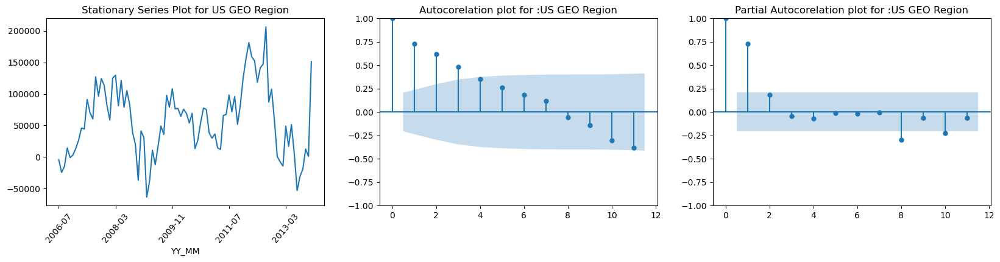

In [54]:
print_plot_autocorelation(us_train_df,12, "US GEO Region")

ADF Statistic for :Other price category code
ADF Statistic: -2.290701
p-value: 0.174985
Critical Values:
	1%: -3.518
	5%: -2.900
	10%: -2.587


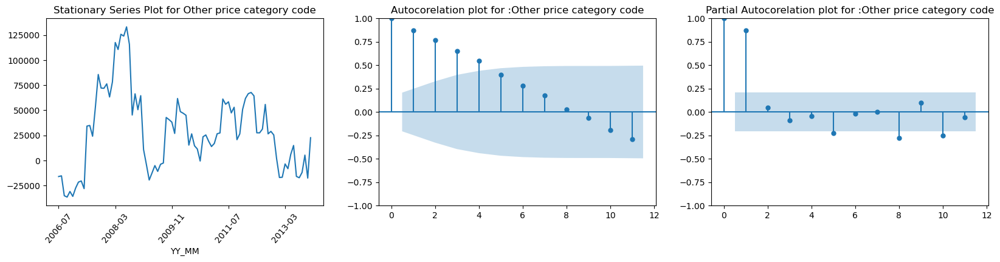

In [55]:
print_plot_autocorelation(other_train_df,12, "Other price category code")

#### Autocorelation Observation for Other price category code

* The results show that the test statistic value -2.29 is greater than the critical value at 1% of -3.518. This suggests that we cannot reject the null hypothesis and can conclude that the process has a unit root, and in turn that the time series is not stationary.
* The ACF shows significant initial lags for first month.
* The PACF shows a significant lag for 1 month, with perhaps some significant lag at 8th and 10th month.   
* Both the ACF and PACF show a drop off at the same point, perhaps suggesting a mix of AR and MA.

ADF Statistic for :International GEO Summary
ADF Statistic: -3.075181
p-value: 0.028445
Critical Values:
	1%: -3.517
	5%: -2.899
	10%: -2.587


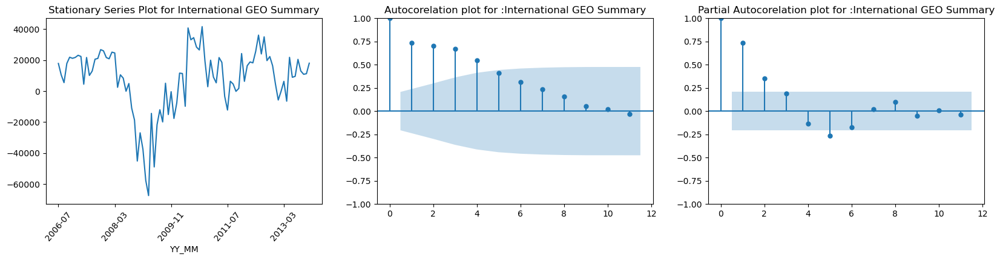

In [56]:
print_plot_autocorelation(international_train_df,12, "International GEO Summary")

### Autocorelation Observation for International GEO Summary

* The results show that the test statistic value -3.075 is greater than the critical value at 1% of -3.517. This suggests that we cannot reject the null hypothesis and can conclude that the process has a unit root, and in turn that the time series is not stationary.
* The ACF shows a slow decline.
* The PACF shows a significant lag for first 4 month , with perhaps some significant lag at 5th month.

ADF Statistic for :Domestic Low Fare
ADF Statistic: -2.255853
p-value: 0.186602
Critical Values:
	1%: -3.544
	5%: -2.911
	10%: -2.593


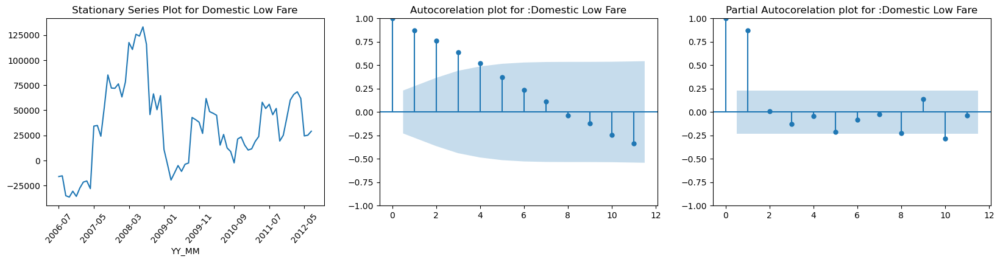

In [57]:
print_plot_autocorelation(domestic_lowFarePriceCode_train_df,12, "Domestic Low Fare")

#### Autocorelation Observation for Domestic Low Fare

* The results show that the test statistic value -2.256 is greater than the critical value at 1% of -3.544. This suggests that we cannot reject the null hypothesis and can conclude that the process has a unit root, and in turn that the time series is not stationary.
* The ACF shows a significant lag for several months.
* The PACF shows a significant lag for 1 month, with perhaps some significant lag at 10th month.

In [58]:
# Create an empty DataFrame with column names for summary
in0 = ['Linear Regression(BoxCox)', 'Linear Regression(BoxCox)', 'Linear Regression(BoxCox)', 'ARIMA', 'ARIMA', 'ARIMA', 'Auto Regression', 'Auto Regression', 'Auto Regression', 'SARIMAX', 'SARIMAX', 'SARIMAX', 'Prophet', 'Prophet']
in1 = ['RMSE', 'MAE', 'MAPE', 'RMSE', 'MAE', 'MAPE', 'RMSE', 'MAE', 'MAPE', 'RMSE', 'MAE', 'MAPE', 'MAE', 'MAPE']
in01 = [np.array(in0),np.array(in1),]
model_summary = pd.DataFrame(index=in01, columns=['KLM', 'United Airline', 'US GEO Region', 'Other price category code', 'International GEO Summary', 'Domestic Low Fare'])

### 4.2 Linear Regression Forecasting Model(Deg=2) with BoCox Transformation

In [59]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
warnings.filterwarnings("ignore")
import matplotlib.ticker as ticker 
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

def boxcox_inverse(value, lam):
    if lam == 0:
        return exp(value)
    return exp(log(lam * value + 1) / lam)

def calculate_boxcox_linreg(df, dataset_name, train_percent):
    series =  df 
    X = DataFrame(series.values)
    X.columns = ['Adjusted Passenger Count']
    X['Adjusted Passenger Count'], lam = boxcox(X['Adjusted Passenger Count'])
    print('BoxCox lambda: %f' %lam)
    pyplot.figure(figsize=(20,3) )
    # line plot
    pyplot.subplot(131)
    pyplot.plot(X['Adjusted Passenger Count'])
    pyplot.title("BoxCox Series Plot :"+ dataset_name)
    # histogram
    pyplot.subplot(132)
    pyplot.hist(X['Adjusted Passenger Count'])
    pyplot.title("BoxCox Series Historgram Plot :"+dataset_name)
    #pyplot.show()
    pyplot.subplot(133)
    qqplot(X['Adjusted Passenger Count'], line='r', ax=pyplot.gca())
    pyplot.title("BoxCox Series QQ Plot :"+dataset_name)
    pyplot.show()
###################################################################
    X = pd.Series( df['Adjusted Passenger Count']).values #series.values
    X = X.astype('float32')
    train_size = int(len(X) * train_percent / 100)
    train, test = X[0:train_size], X[train_size:]

    train_x = np.arange(len(train))
    history = [x for x in train]
    predictions = list()
    for i in range(len(test)):
        transformed ,lam = boxcox(history)
        if lam < -5:
            transformed, lam = history, 1
        fit = np.polyfit(np.arange(len(transformed)), transformed, deg=2)
        fit_function = np.poly1d(fit)
        prediction = fit_function(len(train) + i)
        yhat = boxcox_inverse(prediction, lam)
        predictions.append(yhat)
        # observation
        obs = test[i]
        #history.append(obs)
        print('>Predicted=%.3f, Expected=%.3f' % (yhat, obs))
    # report performance
    rmse = sqrt(mean_squared_error(test, predictions))
    print( "For "+dataset_name + " Dataset : " +'Test RMSE: %.3f' % rmse)
    
    mae = mean_absolute_error(test, predictions)
    print( "For "+dataset_name + " Dataset : " +'Test MAE: %.3f' % mae)
    
    mape = mean_absolute_percentage_error(test, predictions)
    print( "For "+dataset_name + " Dataset : " +'Test MAPE: %.3f' % mape)
    
    train_linreg=list()
    for i in range(len(train)):
        linreg= fit_function(i)
        train_l =boxcox_inverse(linreg, lam)
        train_linreg.append(train_l)    
    pyplot.figure(figsize=(12,5), dpi=100)
    print('BoxCox Lambda of Transformation used: %.3f' % lam)
    
    pyplot.plot(train,  label='Training Data', linewidth=2)
    pyplot.plot( train_linreg , 'r', label='Train_LinReg', linewidth=2)
    pyplot.plot([None for i in train] + [x for x in test] , 'b', label='Testing Data', linewidth=2)
    pyplot.plot([None for i in train] + [x for x in predictions], 'r--', label='Forecast Data', linewidth=2)
    pyplot.title("Linear Regression with BoxCox Transform \n Observed Vs Predicted Plot for " + dataset_name )
    pyplot.legend(loc='upper left', fontsize=8)
    pyplot.show()
    model_summary.loc[('Linear Regression(BoxCox)', 'RMSE'), 
                  dataset_name], model_summary.loc[('Linear Regression(BoxCox)', 'MAE'), 
                dataset_name], model_summary.loc[('Linear Regression(BoxCox)', 'MAPE'), 
                dataset_name]= rmse, mae, mape

BoxCox lambda: 1.163519


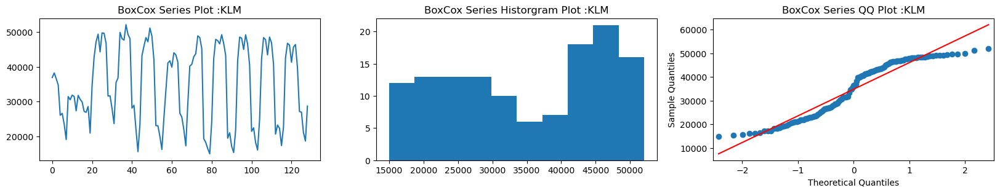

>Predicted=9050.380, Expected=6256.000
>Predicted=9026.256, Expected=5244.000
>Predicted=9001.523, Expected=4695.000
>Predicted=8976.180, Expected=6797.000
>Predicted=8950.226, Expected=10771.000
>Predicted=8923.659, Expected=12097.000
>Predicted=8896.477, Expected=11966.000
>Predicted=8868.680, Expected=11023.000
>Predicted=8840.265, Expected=12130.000
>Predicted=8811.232, Expected=11774.000
>Predicted=8781.577, Expected=10433.000
>Predicted=8751.300, Expected=5822.000
>Predicted=8720.399, Expected=6447.000
>Predicted=8688.872, Expected=6222.000
>Predicted=8656.718, Expected=5012.000
>Predicted=8623.933, Expected=6327.000
>Predicted=8590.517, Expected=10831.000
>Predicted=8556.467, Expected=11745.000
>Predicted=8521.781, Expected=11633.000
>Predicted=8486.458, Expected=10562.000
>Predicted=8450.494, Expected=11510.000
>Predicted=8413.888, Expected=11669.000
>Predicted=8376.637, Expected=10221.000
>Predicted=8338.739, Expected=7366.000
>Predicted=8300.191, Expected=7321.000
>Predicted=

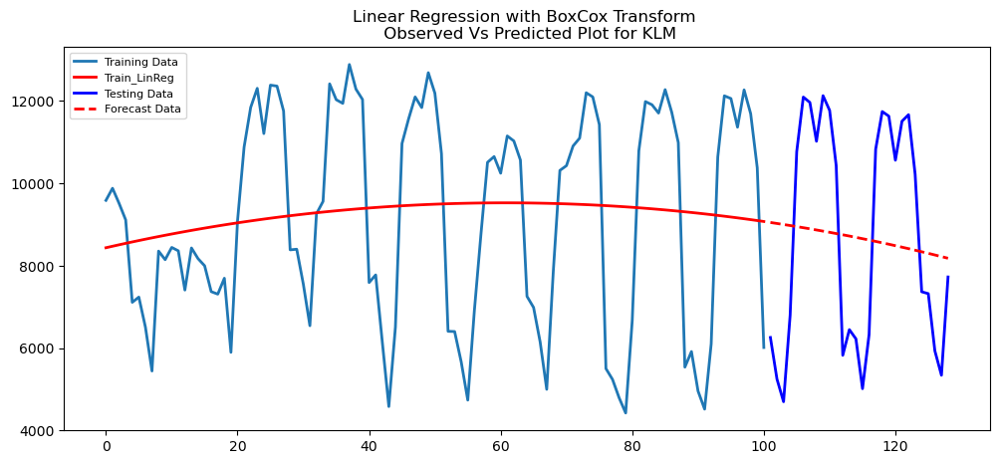

In [60]:
calculate_boxcox_linreg(klm_full_df, "KLM", train_pctg)

BoxCox lambda: 0.144278


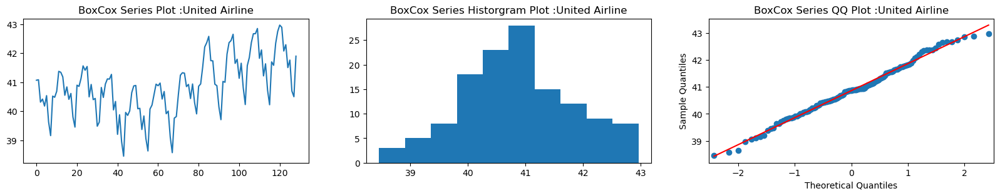

>Predicted=753981.198, Expected=727154.000
>Predicted=760119.839, Expected=644051.000
>Predicted=766393.839, Expected=591906.000
>Predicted=772804.963, Expected=718590.000
>Predicted=779355.015, Expected=747788.000
>Predicted=786045.834, Expected=804017.000
>Predicted=792879.296, Expected=839154.000
>Predicted=799857.315, Expected=839442.000
>Predicted=806981.844, Expected=860524.000
>Predicted=814254.874, Expected=744977.000
>Predicted=821678.433, Expected=775863.000
>Predicted=829254.590, Expected=683178.000
>Predicted=836985.453, Expected=725061.000
>Predicted=844873.171, Expected=636301.000
>Predicted=852919.933, Expected=591246.000
>Predicted=861127.968, Expected=731963.000
>Predicted=869499.546, Expected=719732.000
>Predicted=878036.982, Expected=801291.000
>Predicted=886742.629, Expected=848604.000
>Predicted=895618.887, Expected=874616.000
>Predicted=904668.195, Expected=865614.000
>Predicted=913893.038, Expected=771810.000
>Predicted=923295.945, Expected=795921.000
>Predicted=

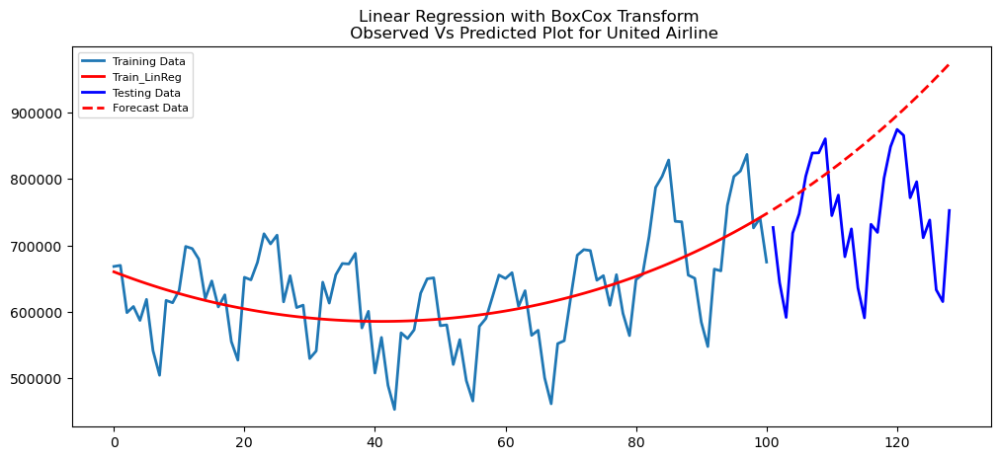

In [61]:
calculate_boxcox_linreg(unitedAirline_full_df, "United Airline", train_pctg)

BoxCox lambda: 0.614556


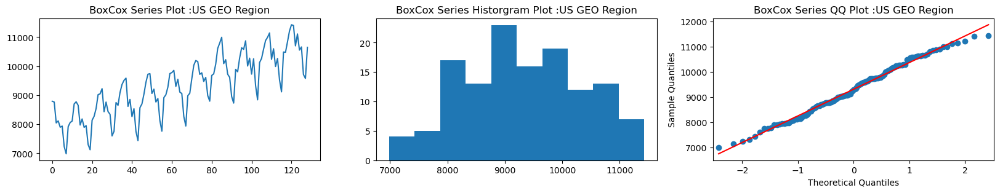

>Predicted=1541057.766, Expected=1522640.000
>Predicted=1548866.128, Expected=1306268.000
>Predicted=1556733.186, Expected=1196235.000
>Predicted=1564659.215, Expected=1491577.000
>Predicted=1572644.493, Expected=1525445.000
>Predicted=1580689.299, Expected=1602808.000
>Predicted=1588793.912, Expected=1677202.000
>Predicted=1596958.614, Expected=1705040.000
>Predicted=1605183.688, Expected=1743348.000
>Predicted=1613469.416, Expected=1518479.000
>Predicted=1621816.084, Expected=1606936.000
>Predicted=1630223.979, Expected=1458968.000
>Predicted=1638693.387, Expected=1525051.000
>Predicted=1647224.597, Expected=1351971.000
>Predicted=1655817.899, Expected=1257293.000
>Predicted=1664473.585, Expected=1579309.000
>Predicted=1673191.946, Expected=1576925.000
>Predicted=1681973.277, Expected=1666018.000
>Predicted=1690817.871, Expected=1760459.000
>Predicted=1699726.026, Expected=1815878.000
>Predicted=1708698.038, Expected=1808823.000
>Predicted=1717734.206, Expected=1631556.000
>Predicted

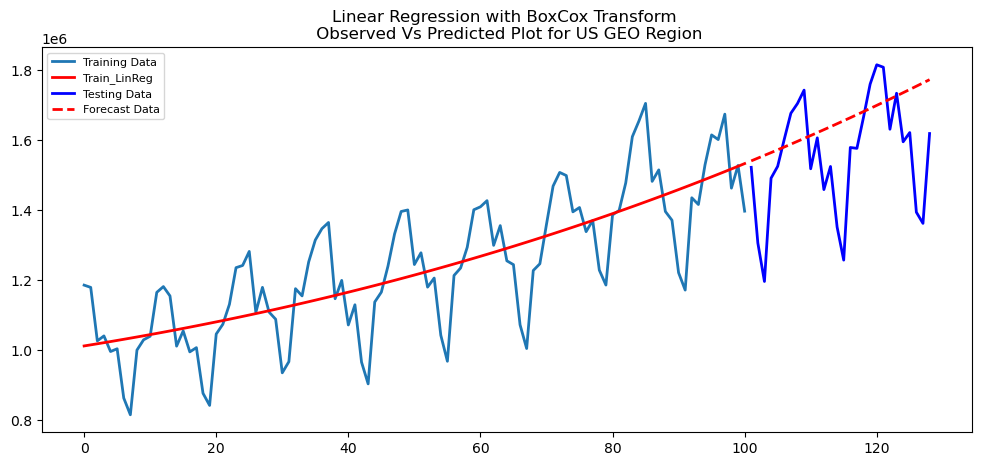

In [62]:
calculate_boxcox_linreg(us_full_df,"US GEO Region", train_pctg)

BoxCox lambda: 1.296379


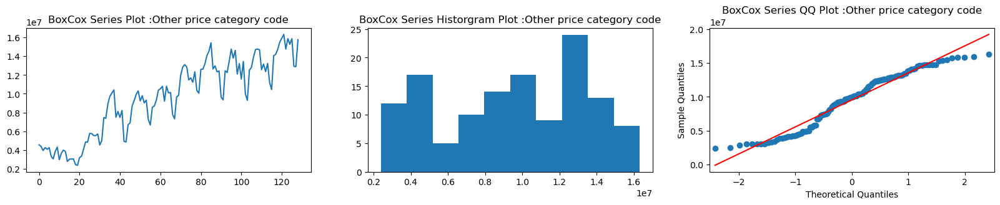

>Predicted=393211.891, Expected=385006.000
>Predicted=395190.848, Expected=306237.000
>Predicted=397152.943, Expected=289944.000
>Predicted=399098.167, Expected=364667.000
>Predicted=401026.514, Expected=371037.000
>Predicted=402937.976, Expected=394907.000
>Predicted=404832.546, Expected=412681.000
>Predicted=406710.216, Expected=414054.000
>Predicted=408570.980, Expected=412197.000
>Predicted=410414.831, Expected=365571.000
>Predicted=412241.761, Expected=378945.000
>Predicted=414051.765, Expected=361020.000
>Predicted=415844.835, Expected=380477.000
>Predicted=417620.965, Expected=334020.000
>Predicted=419380.149, Expected=317115.000
>Predicted=421122.380, Expected=398492.000
>Predicted=422847.653, Expected=401825.000
>Predicted=424555.960, Expected=413415.000
>Predicted=426247.297, Expected=429627.000
>Predicted=427921.657, Expected=438805.000
>Predicted=429579.035, Expected=447315.000
>Predicted=431219.424, Expected=414012.000
>Predicted=432842.820, Expected=437810.000
>Predicted=

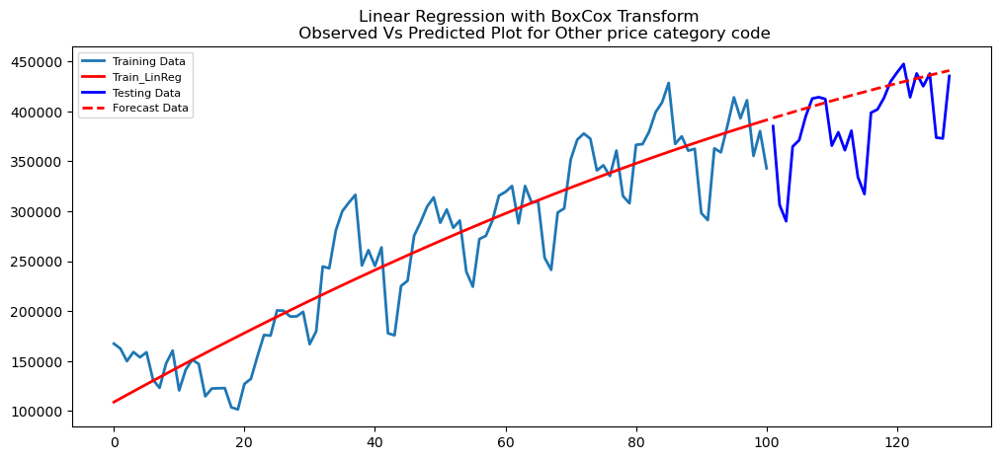

In [63]:
calculate_boxcox_linreg(other_full_df,"Other price category code", train_pctg)

BoxCox lambda: -0.526638


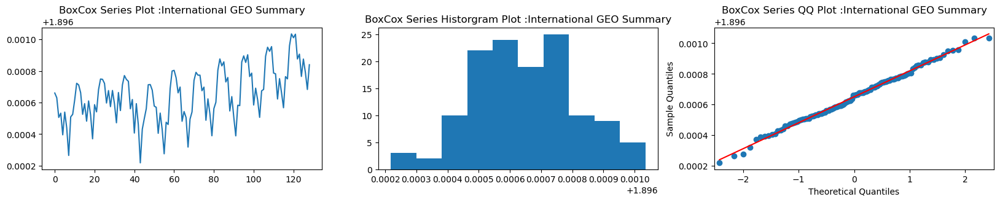

>Predicted=411547.605, Expected=394174.000
>Predicted=413094.888, Expected=369544.000
>Predicted=414666.804, Expected=336955.000
>Predicted=416263.561, Expected=388397.000
>Predicted=417885.374, Expected=391403.000
>Predicted=419532.462, Expected=475889.000
>Predicted=421205.044, Expected=503458.000
>Predicted=422903.346, Expected=490643.000
>Predicted=424627.597, Expected=505407.000
>Predicted=426378.030, Expected=429941.000
>Predicted=428154.881, Expected=428013.000
>Predicted=429958.390, Expected=371366.000
>Predicted=431788.802, Expected=416055.000
>Predicted=433646.364, Expected=384604.000
>Predicted=435531.330, Expected=354328.000
>Predicted=437443.956, Expected=421005.000
>Predicted=439384.502, Expected=415593.000
>Predicted=441353.234, Expected=507713.000
>Predicted=443350.419, Expected=549134.000
>Predicted=445376.332, Expected=535420.000
>Predicted=447431.249, Expected=548091.000
>Predicted=449515.454, Expected=467806.000
>Predicted=451629.231, Expected=481937.000
>Predicted=

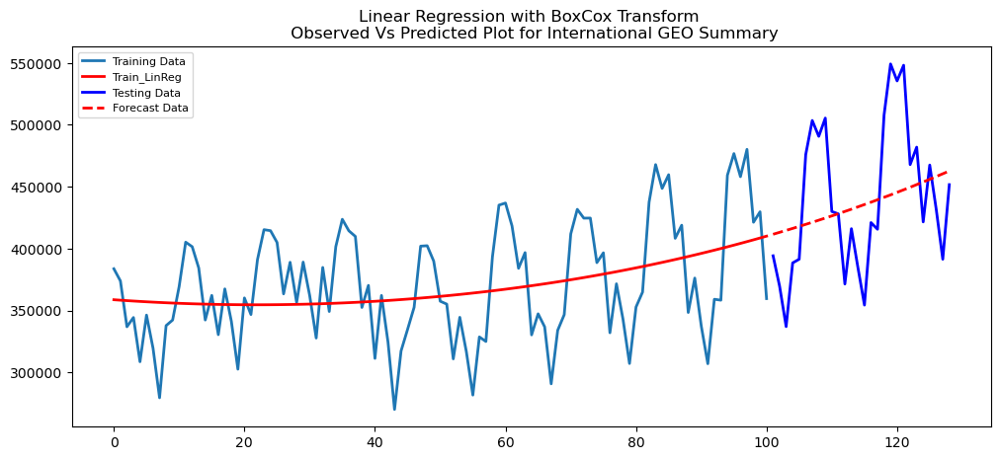

In [64]:
calculate_boxcox_linreg(international_full_df,"International GEO Summary", train_pctg)

BoxCox lambda: 1.320602


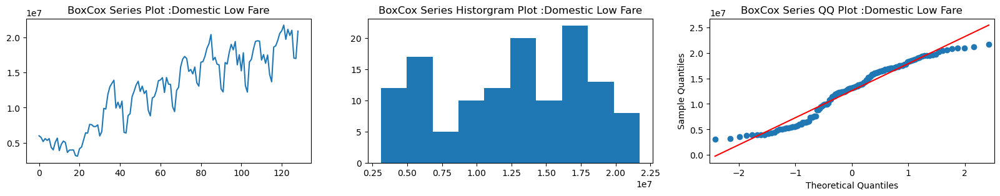

>Predicted=386367.731, Expected=381488.000
>Predicted=388208.520, Expected=303237.000
>Predicted=390031.879, Expected=286688.000
>Predicted=391837.816, Expected=360037.000
>Predicted=393626.336, Expected=366404.000
>Predicted=395397.445, Expected=389918.000
>Predicted=397151.150, Expected=407396.000
>Predicted=398887.456, Expected=408891.000
>Predicted=400606.369, Expected=408134.000
>Predicted=402307.895, Expected=364586.000
>Predicted=403992.039, Expected=377352.000
>Predicted=405658.807, Expected=357033.000
>Predicted=407308.204, Expected=376297.000
>Predicted=408940.235, Expected=330257.000
>Predicted=410554.906, Expected=312523.000
>Predicted=412152.222, Expected=394377.000
>Predicted=413732.187, Expected=397409.000
>Predicted=415294.807, Expected=409591.000
>Predicted=416840.087, Expected=425266.000
>Predicted=418368.030, Expected=431327.000
>Predicted=419878.643, Expected=443774.000
>Predicted=421371.929, Expected=412126.000
>Predicted=422847.893, Expected=434474.000
>Predicted=

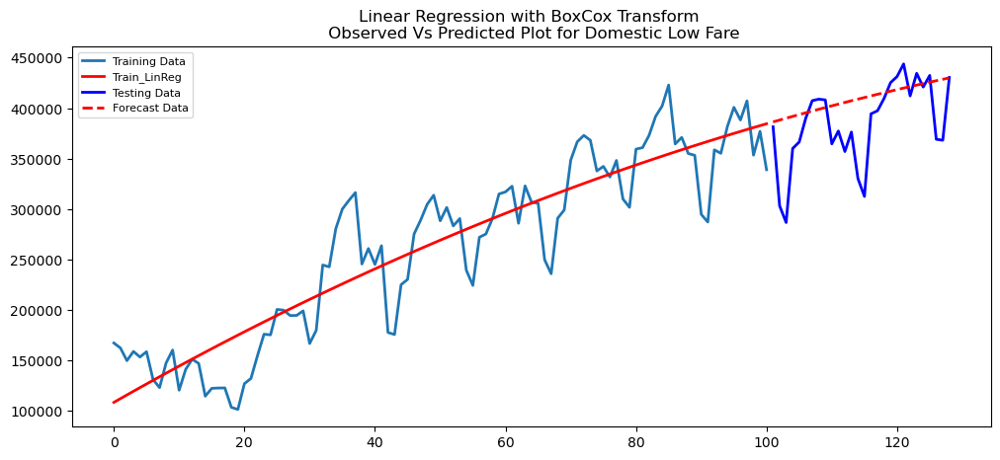

In [65]:
calculate_boxcox_linreg(domestic_lowFarePriceCode_full_df,"Domestic Low Fare", train_pctg)

### 4.3 ARIMA Forecasting Model

#### 4.3.1 Grid Search for Arima Paramater
Define a function to perform a search of ARIMA hyperparameters. Search p, d, and q combinations (skipping those that fail to converge). Return the combination that results in the best performance for the test dataset. Use grid search to explore all combinations in a set of integer values.

In [66]:
import warnings
from math import sqrt
from pandas import read_csv
from pandas import datetime
import statsmodels.tsa.arima_process as arima
from statsmodels.tsa.arima.model import ARIMA, ARIMAResults
from sklearn.metrics import mean_squared_error

warnings.filterwarnings("ignore")

# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order, train_percent):
    # prepare training dataset
    train_size = int(len(X) * train_percent / 100)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    #print(history)
    # make forecast prediction value
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # calculate out of forecast error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values, dataset_name, train_percent):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(dataset, order, train_percent)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    #print('ARIMA%s RMSE=%.3f' % (order,rmse))    
                except:
                    continue
    print( "For "+ dataset_name + ' Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
    return best_score, best_cfg

In [67]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
klm_rmse, klm_arima_order = evaluate_models(klm_full_df.values, p_values, d_values, q_values,"KLM", train_pctg)

For KLM Best ARIMA(4, 0, 2) RMSE=1089.247


**Printing of Intermidiate result for ARIMA Parmater was commented and only Best ARIMA parameter is printed to save the space**

In [68]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
unitedAirline_rmse, unitedAirline_arima_order = evaluate_models(unitedAirline_full_df.values, p_values, d_values, q_values,"United Airline", train_pctg)

For United Airline Best ARIMA(4, 0, 2) RMSE=61138.822


In [69]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
us_rmse, us_arima_order = evaluate_models(us_full_df.values, p_values, d_values, q_values,"US GEO Region", train_pctg)

For US GEO Region Best ARIMA(4, 0, 2) RMSE=123301.060


In [70]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
other_rmse, other_arima_order= evaluate_models(other_full_df.values, p_values, d_values, q_values,"Other price category code", train_pctg)

For Other price category code Best ARIMA(4, 0, 2) RMSE=32222.489


In [71]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
international_rmse, international_arima_order= evaluate_models(international_full_df.values, p_values, d_values, q_values,"International GEO Summary", train_pctg)

For International GEO Summary Best ARIMA(4, 1, 2) RMSE=36794.801


In [72]:
p_values = [0, 1, 2, 4]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
domestic_lowFarePriceCode_rmse, domestic_lowFarePriceCode_arima_order= evaluate_models(domestic_lowFarePriceCode_full_df.values, p_values, d_values, q_values,"Domestic Low Fare", train_pctg)

For Domestic Low Fare Best ARIMA(4, 0, 2) RMSE=32082.361


#### 4.3.2 Calculate and Plot ARIMA Forecast
Define a function to fit ARIMA Model with the test dataset and calculate predicted values for the Testing period. Plot expected Vs Predicted values.

In [73]:
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
import statsmodels.tsa.arima_process as arima
from statsmodels.tsa.arima.model import ARIMA, ARIMAResults
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from math import sqrt

def plot_ARIMA(df,test_percent,arima_order,dataset_name ):
    X = df
    train_size = int(len(X) * test_percent / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    history = [x for x in train.values]
    predictions = list()
    # walk-forward validation
    for t in range(0,len(test)):
        model = ARIMA(history, order= arima_order ) #(0,1,1))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test.values[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
    # evaluate forecasts
    rmse = sqrt(mean_squared_error(test, predictions))
    print( "For "+dataset_name + " Dataset : " +'Test RMSE: %.3f' % rmse)
    
    mae = mean_absolute_error(test, predictions)
    print( "For "+dataset_name + " Dataset : " +'Test MAE: %.3f' % mae)
    mape = mean_absolute_percentage_error(test, predictions)
    print( "For "+dataset_name + " Dataset : " +'Test MAPE: %.3f' % mape)
    # plot forecasts against actual outcomes
    pyplot.figure(figsize=(12,5), dpi=100)
    
    fig, ax = plt.subplots(figsize=(20, 5) )
    # Rotating X-axis labels
    ax.tick_params(axis='x', labelrotation = 50)
    space = 6
    ax.xaxis.set_major_locator(ticker.MultipleLocator(space))
    pyplot.plot(train,  label='Training Data', linewidth=2)
    pyplot.plot(test, 'b', label='Testing Data', linewidth=2)
    pyplot.plot(pd.DataFrame(predictions, test.index), 'r--', label='Forecast Data', linewidth=2)
    
    pyplot.title("ARIMA Forecast \n Observed Vs Predicted Plot for " + dataset_name )
    pyplot.legend(loc='upper left', fontsize=8)
    pyplot.show()
    model_summary.loc[('ARIMA', 'RMSE'), 
                  dataset_name], model_summary.loc[('ARIMA', 'MAE'), 
                dataset_name], model_summary.loc[('ARIMA', 'MAPE'), 
                dataset_name]  = rmse, mae, mape

predicted=5297.472540, expected=6256.000000
predicted=5673.101081, expected=5244.000000
predicted=5672.259565, expected=4695.000000
predicted=6505.316181, expected=6797.000000
predicted=8853.055613, expected=10771.000000
predicted=11787.058107, expected=12097.000000
predicted=12761.302912, expected=11966.000000
predicted=11737.889137, expected=11023.000000
predicted=11286.507209, expected=12130.000000
predicted=10883.749284, expected=11774.000000
predicted=9376.018807, expected=10433.000000
predicted=7742.058672, expected=5822.000000
predicted=5126.216997, expected=6447.000000
predicted=5957.682558, expected=6222.000000
predicted=6416.567716, expected=5012.000000
predicted=6914.291419, expected=6327.000000
predicted=8507.037679, expected=10831.000000
predicted=11986.056251, expected=11745.000000
predicted=12395.646447, expected=11633.000000
predicted=12242.021466, expected=10562.000000
predicted=11006.839812, expected=11510.000000
predicted=10498.249075, expected=11669.000000
predicted

<Figure size 1200x500 with 0 Axes>

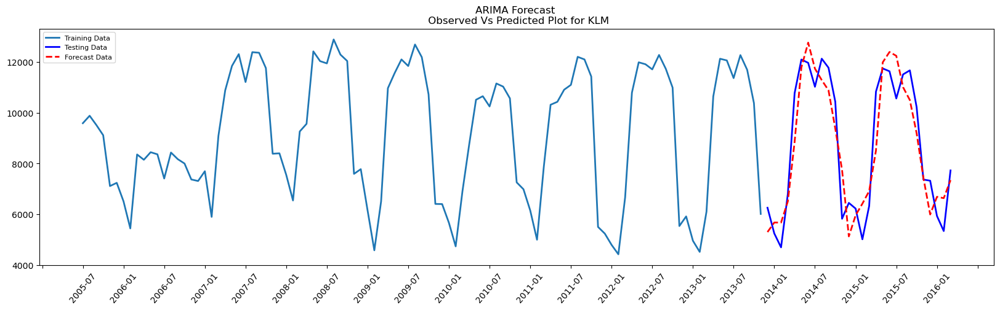

In [74]:
plot_ARIMA(klm_full_df, train_pctg, (klm_arima_order),"KLM"  )

predicted=627664.046981, expected=727154.000000
predicted=716906.066515, expected=644051.000000
predicted=625576.128550, expected=591906.000000
predicted=603241.063232, expected=718590.000000
predicted=636523.086197, expected=747788.000000
predicted=785509.829848, expected=804017.000000
predicted=748545.684213, expected=839154.000000
predicted=815298.635011, expected=839442.000000
predicted=823814.826971, expected=860524.000000
predicted=781566.852220, expected=744977.000000
predicted=742376.872709, expected=775863.000000
predicted=708143.470031, expected=683178.000000
predicted=681656.231765, expected=725061.000000
predicted=710721.018150, expected=636301.000000
predicted=595317.569935, expected=591246.000000
predicted=624896.586169, expected=731963.000000
predicted=697115.358376, expected=719732.000000
predicted=763896.281637, expected=801291.000000
predicted=748036.648619, expected=848604.000000
predicted=841584.516292, expected=874616.000000
predicted=862408.632754, expected=865614

<Figure size 1200x500 with 0 Axes>

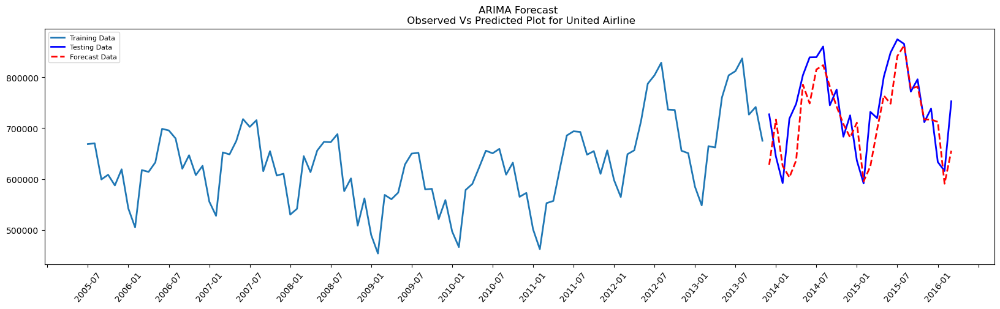

In [75]:
plot_ARIMA(unitedAirline_full_df, train_pctg, (unitedAirline_arima_order),"United Airline"  )

predicted=1381212.495659, expected=1522640.000000
predicted=1507526.475872, expected=1306268.000000
predicted=1197725.735445, expected=1196235.000000
predicted=1242487.387737, expected=1491577.000000
predicted=1428148.070811, expected=1525445.000000
predicted=1610817.323555, expected=1602808.000000
predicted=1492693.556950, expected=1677202.000000
predicted=1613426.057043, expected=1705040.000000
predicted=1699138.117440, expected=1743348.000000
predicted=1603103.345853, expected=1518479.000000
predicted=1527068.342717, expected=1606936.000000
predicted=1470759.724028, expected=1458968.000000
predicted=1464197.063043, expected=1525051.000000
predicted=1482760.879480, expected=1351971.000000
predicted=1259049.828860, expected=1257293.000000
predicted=1314618.151880, expected=1579309.000000
predicted=1501529.885030, expected=1576925.000000
predicted=1672552.304838, expected=1666018.000000
predicted=1541692.733983, expected=1760459.000000
predicted=1709424.837164, expected=1815878.000000


<Figure size 1200x500 with 0 Axes>

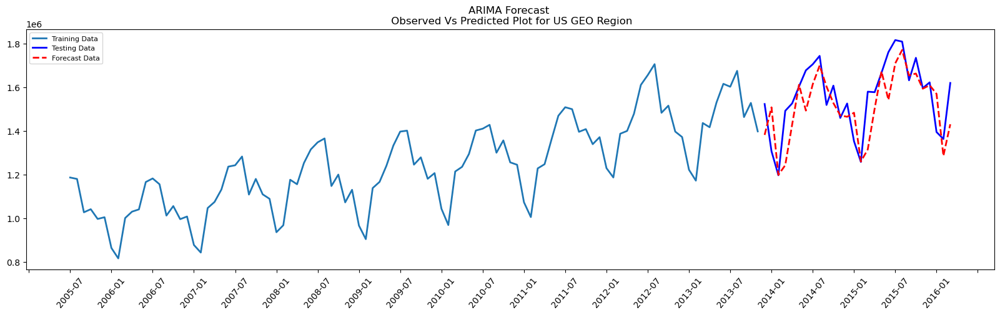

In [76]:
plot_ARIMA(us_full_df, train_pctg, (us_arima_order),"US GEO Region"  )

predicted=347701.654375, expected=385006.000000
predicted=361351.036223, expected=306237.000000
predicted=304408.476064, expected=289944.000000
predicted=297174.293598, expected=364667.000000
predicted=357380.483475, expected=371037.000000
predicted=352297.854495, expected=394907.000000
predicted=378293.096765, expected=412681.000000
predicted=412176.332735, expected=414054.000000
predicted=417658.151665, expected=412197.000000
predicted=386396.466443, expected=365571.000000
predicted=363616.036891, expected=378945.000000
predicted=390011.855427, expected=361020.000000
predicted=369130.721982, expected=380477.000000
predicted=375870.131942, expected=334020.000000
predicted=334910.854400, expected=317115.000000
predicted=334327.677956, expected=398492.000000
predicted=391679.247093, expected=401825.000000
predicted=388036.319329, expected=413415.000000
predicted=395523.411551, expected=429627.000000
predicted=440634.591544, expected=438805.000000
predicted=446205.394741, expected=447315

<Figure size 1200x500 with 0 Axes>

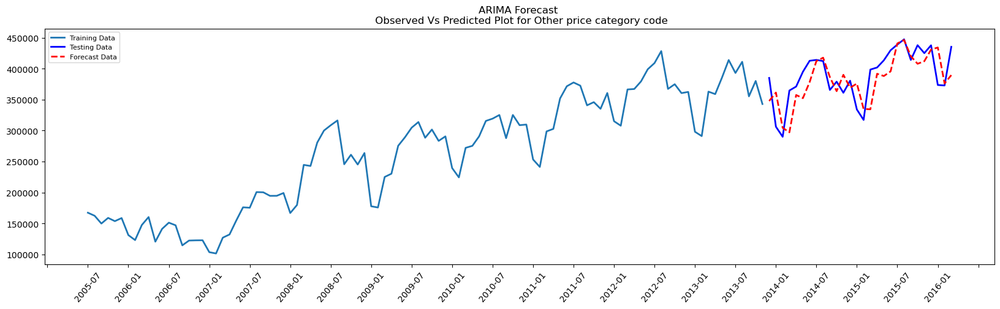

In [77]:
plot_ARIMA(other_full_df, train_pctg, (other_arima_order),"Other price category code"  )

predicted=356550.711186, expected=394174.000000
predicted=402756.239803, expected=369544.000000
predicted=367941.600835, expected=336955.000000
predicted=369197.730635, expected=388397.000000
predicted=371849.345926, expected=391403.000000
predicted=412940.841559, expected=475889.000000
predicted=468867.145278, expected=503458.000000
predicted=493576.615660, expected=490643.000000
predicted=488445.245845, expected=505407.000000
predicted=471039.583282, expected=429941.000000
predicted=424526.520568, expected=428013.000000
predicted=414102.197493, expected=371366.000000
predicted=367527.012569, expected=416055.000000
predicted=428272.718917, expected=384604.000000
predicted=389456.642579, expected=354328.000000
predicted=386355.216316, expected=421005.000000
predicted=400488.172844, expected=415593.000000
predicted=441797.221070, expected=507713.000000
predicted=497200.805318, expected=549134.000000
predicted=533479.662163, expected=535420.000000
predicted=534441.983071, expected=548091

<Figure size 1200x500 with 0 Axes>

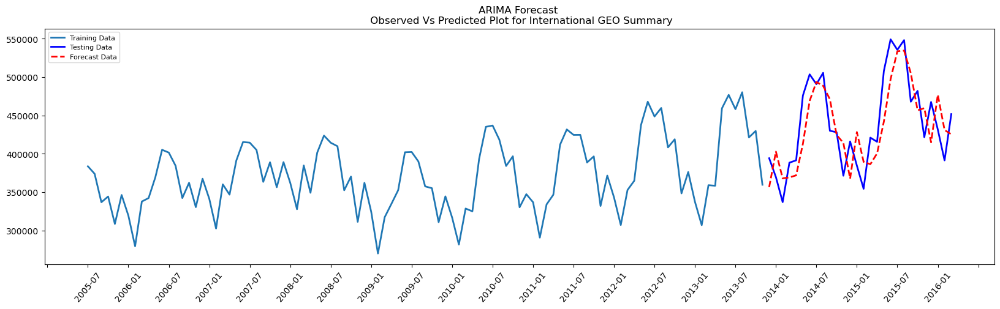

In [78]:
plot_ARIMA(international_full_df, train_pctg, (international_arima_order),"International GEO Summary"  )

predicted=343619.546551, expected=381488.000000
predicted=365196.697402, expected=303237.000000
predicted=294210.394528, expected=286688.000000
predicted=292437.941710, expected=360037.000000
predicted=356449.478164, expected=366404.000000
predicted=351633.227049, expected=389918.000000
predicted=369543.447829, expected=407396.000000
predicted=408034.759158, expected=408891.000000
predicted=412032.842473, expected=408134.000000
predicted=382640.327489, expected=364586.000000
predicted=361065.988098, expected=377352.000000
predicted=387782.824603, expected=357033.000000
predicted=365342.216280, expected=376297.000000
predicted=355353.117532, expected=330257.000000
predicted=314014.698496, expected=312523.000000
predicted=324853.681682, expected=394377.000000
predicted=389274.995740, expected=397409.000000
predicted=382192.943396, expected=409591.000000
predicted=391069.566354, expected=425266.000000
predicted=425042.568272, expected=431327.000000
predicted=438116.915150, expected=443774

<Figure size 1200x500 with 0 Axes>

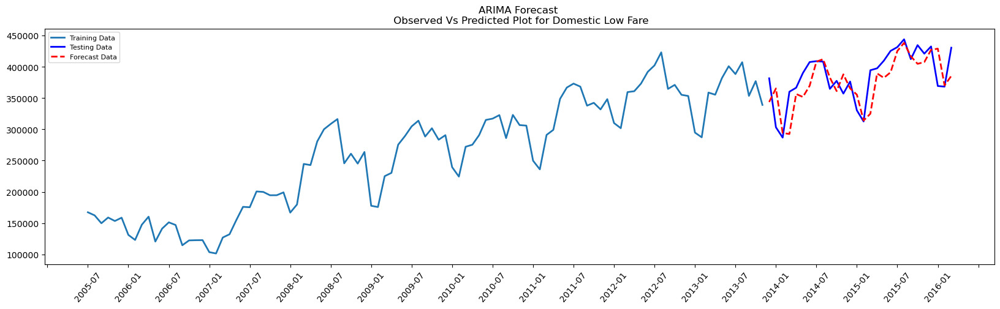

In [79]:
plot_ARIMA(domestic_lowFarePriceCode_full_df, train_pctg, (domestic_lowFarePriceCode_arima_order),"Domestic Low Fare"  )

### 4.4 Autoregression Forecasting Model
Autoregression is a linear regression model that uses lagged variables as input.The statsmodels library provides an AutoReg class that can be instantiated passing a lag value parameter. After creating the model we call fit() method to train it on our dataset which returns an AutoRegResults object. Once fit, we can use the model to make a predict future values by calling the predict() function.

In [80]:
def plot_autoreg(df , test_percent, dataset_name) :
    from statsmodels.tsa.ar_model import AutoReg
    from sklearn.metrics import mean_squared_error
    from sklearn.metrics import mean_absolute_error
    from sklearn.metrics import mean_absolute_percentage_error
    from math import sqrt
    
    X = df
    train_size = int(len(X) * test_percent / 100)
    train, test = X[0:train_size], X[train_size:len(X)]
    
    # train autoregression Model 
    window = 12
    model = AutoReg(train.values, lags=12)
    model_fit = model.fit()
    print("Autoregression Forecast for "+dataset_name)
    #print(model_fit.summary())
    coef = model_fit.params
    # walk forward over time steps in test
    history = train.values[len(train)-window:]
    #print(history)
    history = [history[i] for i in range(len(history))]
    predictions = list()
    for t in range(len(test)):
        length = len(history)
        lag = [history[i] for i in range(length-window,length)]
        yhat = coef[0]
        for d in range(window):
            yhat += coef[d+1] * lag[window-d-1]
        obs = test.values[t]
        predictions.append(yhat)
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
    # Print Forecasting Errors to evaluation
    rmse = sqrt(mean_squared_error(test, predictions))
    print("For "+dataset_name + " Dataset : " +'Test RMSE: %.3f' % rmse)
    
    mae = mean_absolute_error(test, predictions)
    print("For "+dataset_name + " Dataset : " +'Test MAE: %.3f' % mae)
    
    mape = mean_absolute_percentage_error(test, predictions)
    print("For "+dataset_name + " Dataset : " +'Test MAPE: %.3f' % mape)
    
    # plot forecasts against actual outcomes
    pyplot.figure(figsize=(12,5), dpi=100)
    
    fig, ax = plt.subplots(figsize=(20, 5) )
    # Rotating X-axis labels
    ax.tick_params(axis='x', labelrotation = 50)
    space = 6
    ax.xaxis.set_major_locator(ticker.MultipleLocator(space))
    pyplot.plot(train,  label='Training Data', linewidth=2)
    pyplot.plot(test, 'b', label='Testing Data', linewidth=2)
    pyplot.plot(pd.DataFrame(predictions, test.index), 'r--', label='Forecast Data', linewidth=2)
    
    pyplot.title("Autoregression Forecast \n Observed Vs Predicted Plot for " + dataset_name )
    pyplot.legend(loc='upper left', fontsize=8)
    pyplot.show()
    model_summary.loc[('Auto Regression', 'RMSE'), 
                  dataset_name], model_summary.loc[('Auto Regression', 'MAE'), 
                dataset_name], model_summary.loc[('Auto Regression', 'MAPE'), 
                dataset_name]   = rmse, mae, mape

Autoregression Forecast for KLM
predicted=5390.621050, expected=6256.000000
predicted=5464.292496, expected=5244.000000
predicted=4983.271111, expected=4695.000000
predicted=5871.312458, expected=6797.000000
predicted=9679.825112, expected=10771.000000
predicted=12575.738599, expected=12097.000000
predicted=12730.879380, expected=11966.000000
predicted=12043.588589, expected=11023.000000
predicted=11665.712694, expected=12130.000000
predicted=11628.530433, expected=11774.000000
predicted=10159.478245, expected=10433.000000
predicted=7285.231787, expected=5822.000000
predicted=5533.644140, expected=6447.000000
predicted=5721.738229, expected=6222.000000
predicted=5559.787519, expected=5012.000000
predicted=6289.698440, expected=6327.000000
predicted=9434.477162, expected=10831.000000
predicted=12590.295134, expected=11745.000000
predicted=12454.230054, expected=11633.000000
predicted=11630.430279, expected=10562.000000
predicted=11431.790294, expected=11510.000000
predicted=11492.272158

<Figure size 1200x500 with 0 Axes>

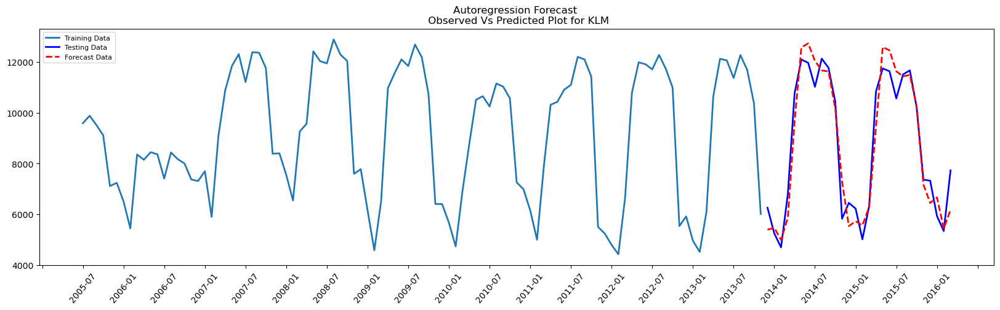

In [81]:
plot_autoreg(klm_full_df , train_pctg, "KLM")

Autoregression Forecast for United Airline
predicted=663624.602202, expected=727154.000000
predicted=675266.822014, expected=644051.000000
predicted=622358.328467, expected=591906.000000
predicted=688398.619584, expected=718590.000000
predicted=679307.626092, expected=747788.000000
predicted=791136.439380, expected=804017.000000
predicted=819565.053535, expected=839154.000000
predicted=868372.218292, expected=839442.000000
predicted=879847.217961, expected=860524.000000
predicted=781980.091317, expected=744977.000000
predicted=746390.050650, expected=775863.000000
predicted=696227.394836, expected=683178.000000
predicted=715968.177886, expected=725061.000000
predicted=712795.311407, expected=636301.000000
predicted=631458.552499, expected=591246.000000
predicted=705462.174218, expected=731963.000000
predicted=723698.260468, expected=719732.000000
predicted=809762.575510, expected=801291.000000
predicted=834198.322803, expected=848604.000000
predicted=884874.625571, expected=874616.0000

<Figure size 1200x500 with 0 Axes>

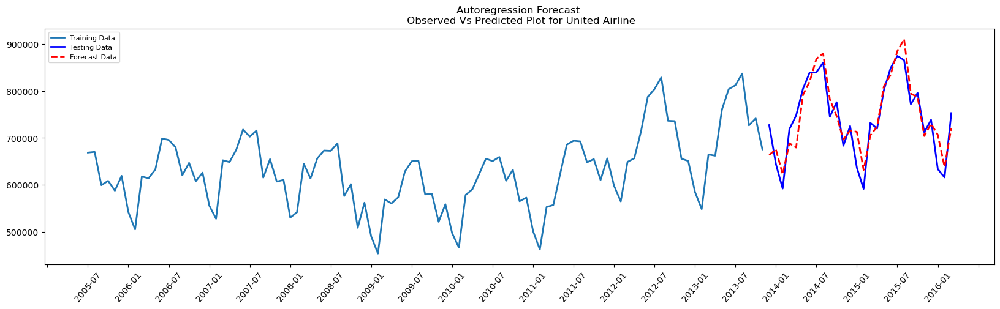

In [82]:
plot_autoreg(unitedAirline_full_df , train_pctg, "United Airline")

Autoregression Forecast for US GEO Region
predicted=1407875.553427, expected=1522640.000000
predicted=1361877.667753, expected=1306268.000000
predicted=1255908.276571, expected=1196235.000000
predicted=1458424.140545, expected=1491577.000000
predicted=1448144.201203, expected=1525445.000000
predicted=1607616.372010, expected=1602808.000000
predicted=1644244.161715, expected=1677202.000000
predicted=1708599.024520, expected=1705040.000000
predicted=1762146.842158, expected=1743348.000000
predicted=1536172.819730, expected=1518479.000000
predicted=1561393.770577, expected=1606936.000000
predicted=1464162.411417, expected=1458968.000000
predicted=1536505.747813, expected=1525051.000000
predicted=1420226.786084, expected=1351971.000000
predicted=1288457.873712, expected=1257293.000000
predicted=1516994.964835, expected=1579309.000000
predicted=1550523.313342, expected=1576925.000000
predicted=1682078.149766, expected=1666018.000000
predicted=1717602.082063, expected=1760459.000000
predicte

<Figure size 1200x500 with 0 Axes>

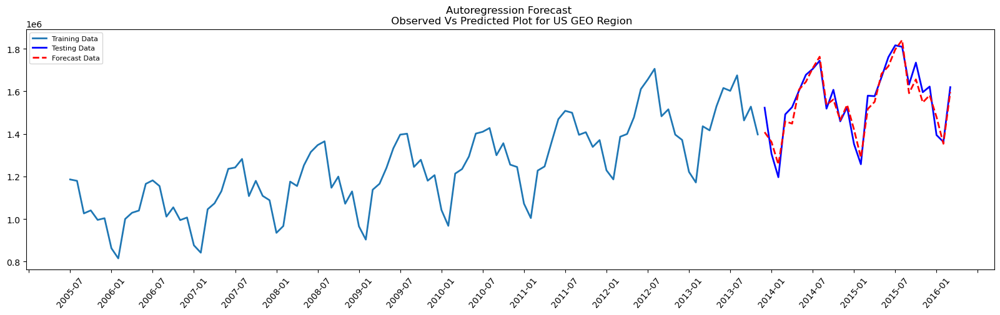

In [83]:
plot_autoreg(us_full_df , train_pctg, "US GEO Region")

Autoregression Forecast for Other price category code
predicted=347280.058700, expected=385006.000000
predicted=380665.923454, expected=306237.000000
predicted=305632.792129, expected=289944.000000
predicted=333966.359575, expected=364667.000000
predicted=356093.294883, expected=371037.000000
predicted=396168.830160, expected=394907.000000
predicted=391966.547347, expected=412681.000000
predicted=441792.920559, expected=414054.000000
predicted=426898.665973, expected=412197.000000
predicted=375208.081223, expected=365571.000000
predicted=380498.438459, expected=378945.000000
predicted=358168.163336, expected=361020.000000
predicted=368152.665327, expected=380477.000000
predicted=372859.600759, expected=334020.000000
predicted=332661.645312, expected=317115.000000
predicted=351909.109202, expected=398492.000000
predicted=388230.831088, expected=401825.000000
predicted=416628.138212, expected=413415.000000
predicted=412678.059715, expected=429627.000000
predicted=447076.178083, expected=

<Figure size 1200x500 with 0 Axes>

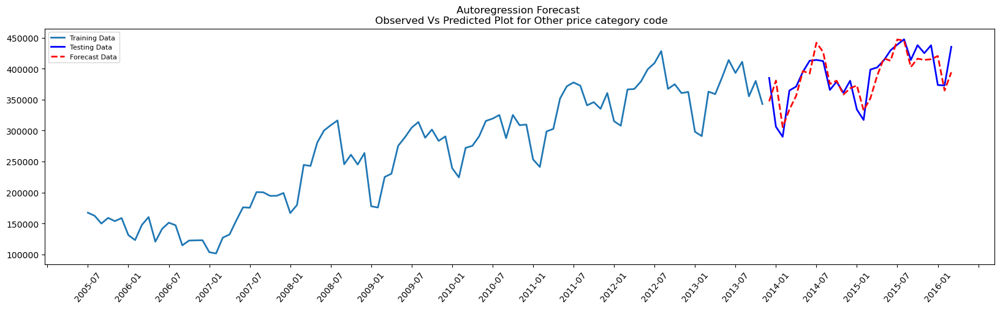

In [84]:
plot_autoreg(other_full_df , train_pctg, "Other price category code")

Autoregression Forecast for International GEO Summary
predicted=365412.333420, expected=394174.000000
predicted=347081.371819, expected=369544.000000
predicted=325020.244140, expected=336955.000000
predicted=381244.288613, expected=388397.000000
predicted=360208.529366, expected=391403.000000
predicted=460347.221062, expected=475889.000000
predicted=484956.832300, expected=503458.000000
predicted=491623.005288, expected=490643.000000
predicted=490429.056388, expected=505407.000000
predicted=438708.656880, expected=429941.000000
predicted=440361.449006, expected=428013.000000
predicted=374312.351669, expected=371366.000000
predicted=378650.874395, expected=416055.000000
predicted=381841.607562, expected=384604.000000
predicted=352294.834726, expected=354328.000000
predicted=400963.507643, expected=421005.000000
predicted=390883.559588, expected=415593.000000
predicted=487184.351264, expected=507713.000000
predicted=515899.887949, expected=549134.000000
predicted=522262.177374, expected=

<Figure size 1200x500 with 0 Axes>

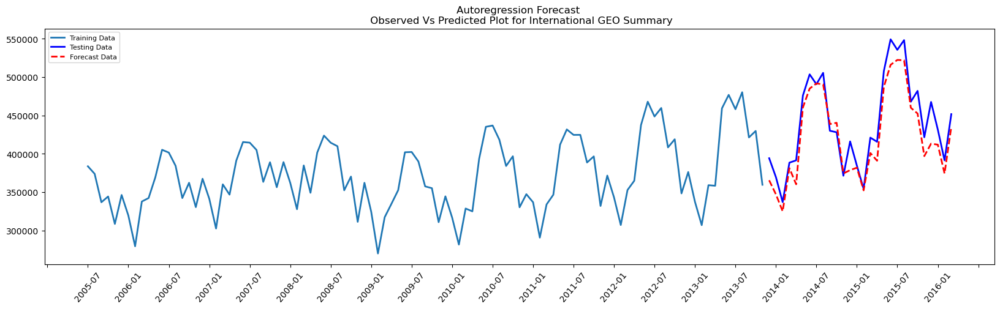

In [85]:
plot_autoreg(international_full_df , train_pctg, "International GEO Summary")

Autoregression Forecast for Domestic Low Fare
predicted=342860.232762, expected=381488.000000
predicted=375219.337643, expected=303237.000000
predicted=299914.038191, expected=286688.000000
predicted=329111.618090, expected=360037.000000
predicted=352235.740310, expected=366404.000000
predicted=396147.652974, expected=389918.000000
predicted=380050.944132, expected=407396.000000
predicted=438626.897454, expected=408891.000000
predicted=420358.984406, expected=408134.000000
predicted=371661.527123, expected=364586.000000
predicted=378343.842209, expected=377352.000000
predicted=356979.279253, expected=357033.000000
predicted=361890.776110, expected=376297.000000
predicted=368594.923650, expected=330257.000000
predicted=327710.884705, expected=312523.000000
predicted=345422.354149, expected=394377.000000
predicted=385718.482876, expected=397409.000000
predicted=415188.185000, expected=409591.000000
predicted=405371.657945, expected=425266.000000
predicted=443037.677020, expected=431327.0

<Figure size 1200x500 with 0 Axes>

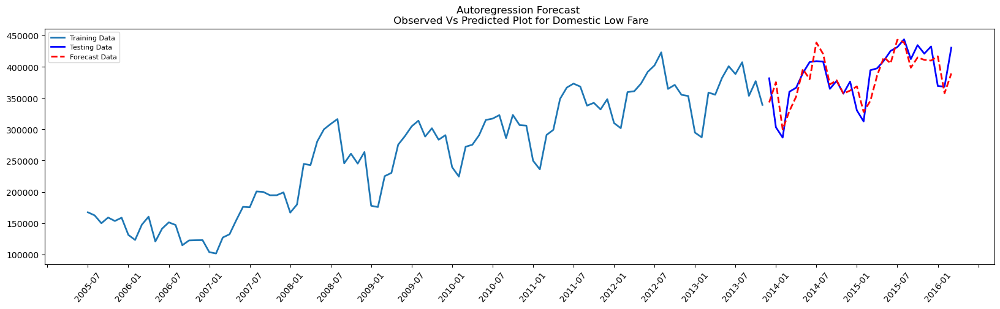

In [86]:
plot_autoreg(domestic_lowFarePriceCode_full_df , train_pctg, "Domestic Low Fare")

### ARIMA- SARIMAX Forecasting Model
#### 4.5.1 Visualizing Seasonal Decomposition of Time series data

In [87]:
def plot_seasonal_decomposition(df, dataset_name):
    from pylab import rcParams
    import statsmodels.api as sm

    df= df.groupby('Activity_Period_Start_Date')['Adjusted Passenger Count'].sum().reset_index()
    df=df.set_index('Activity_Period_Start_Date')
    y = df['Adjusted Passenger Count'].resample('MS').mean()
    
    print("Decomposition Plots for ", dataset_name )
    rcParams['figure.figsize'] = 12, 8
    decomposition = sm.tsa.seasonal_decompose(y, model='additive')
    fig = decomposition.plot()
    plt.show()

Decomposition Plots for  KLM


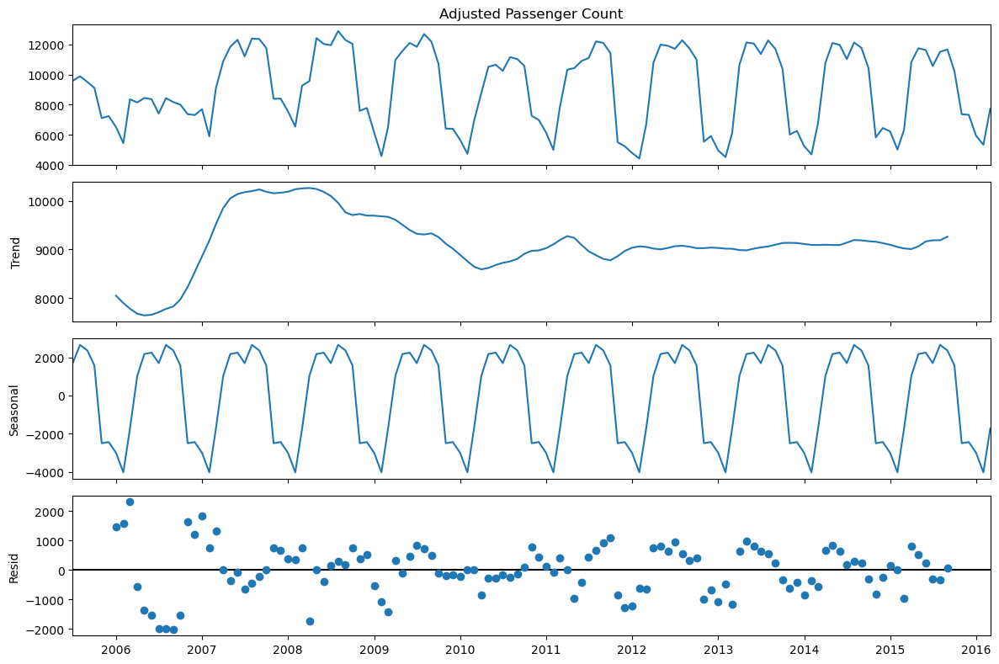

In [88]:
plot_seasonal_decomposition(klm_ds,'KLM')

Decomposition Plots for  United Airline


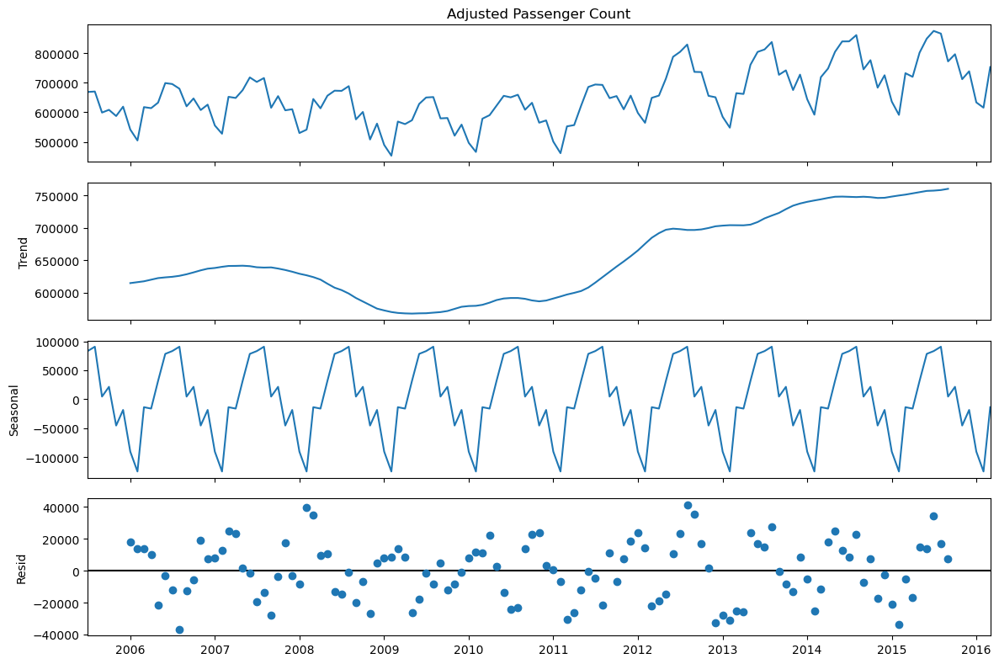

In [89]:
plot_seasonal_decomposition(unitedAirline_ds,'United Airline')

Decomposition Plots for  US GEO Region


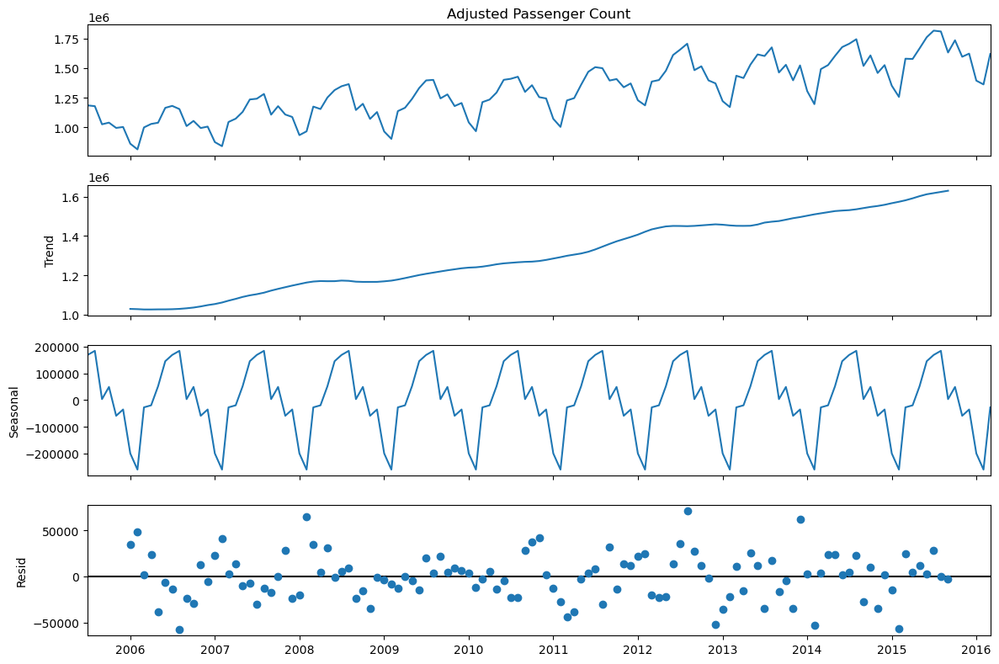

In [90]:
plot_seasonal_decomposition(us_ds,'US GEO Region')

Decomposition Plots for  Other price category code


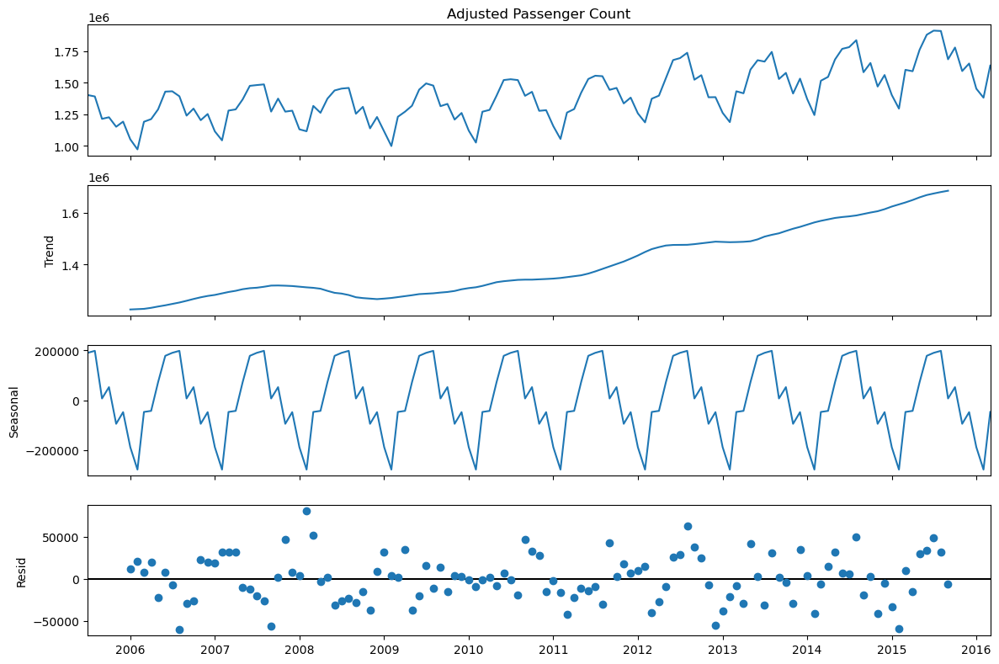

In [91]:
plot_seasonal_decomposition(other_price_ds,'Other price category code')

Decomposition Plots for  International GEO Summary


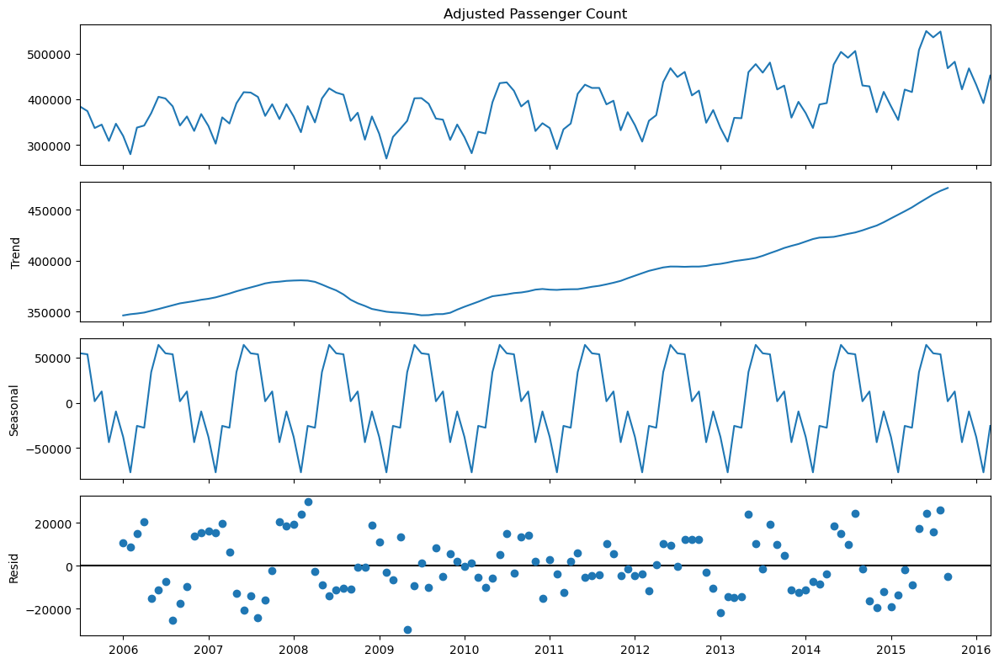

In [92]:
plot_seasonal_decomposition(international_ds,'International GEO Summary')

Decomposition Plots for  Domestic Low Fare


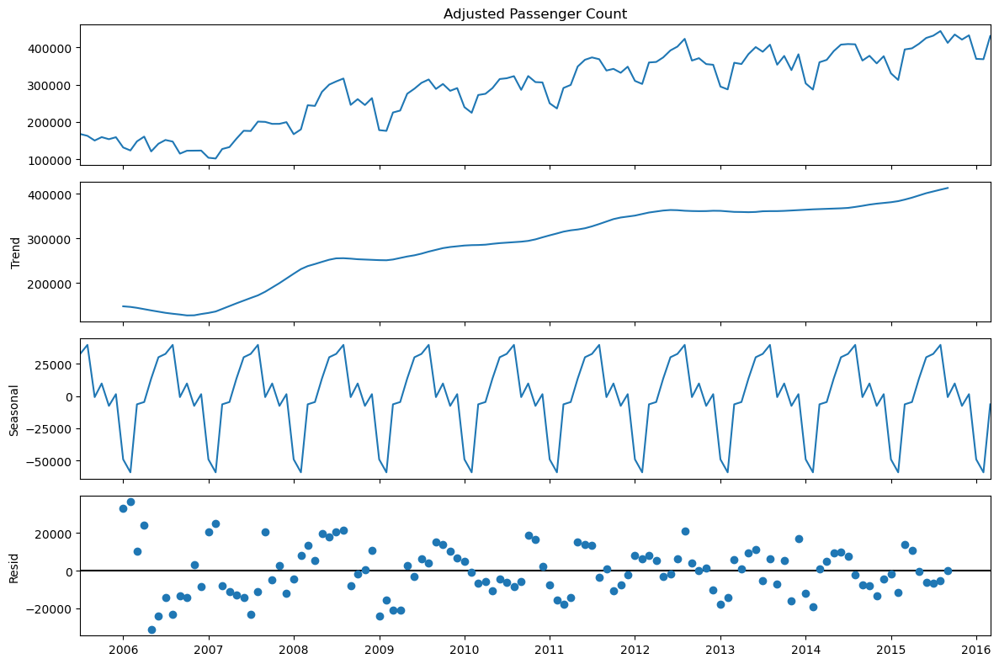

In [93]:
plot_seasonal_decomposition(domestic_lowFarePriceCode_ds,'Domestic Low Fare')

#### 4.5.2 Calculate SARIMAX Parameter

In [94]:
def compute_SARIMAX_param(df, dataset_name ):
    
    df= df.groupby('Activity_Period_Start_Date')['Adjusted Passenger Count'].sum().reset_index()
    df=df.set_index('Activity_Period_Start_Date')
    y = df['Adjusted Passenger Count'].resample('MS').mean()
    
    p = d = q = range(0, 2)
    pdq = list(itertools.product(p, d, q))
    seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]


    best_aic, best_cfg , best_scfg= float("inf"), None, None
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(y,
                                                order=param,
                                                seasonal_order=param_seasonal,
                                                enforce_stationarity=False,
                                                enforce_invertibility=False)
                results = mod.fit()

                #print('ARIMA{}x{}12 - AIC:{} - BIC:{}'.format(param, param_seasonal, results.aic, results.bic))

                if results.aic < best_aic:
                    best_aic, best_cfg, best_scfg = results.aic , param , param_seasonal
            except:
                continue
    print("For "+ dataset_name +': Best AIC:{} SARIMAX: {} x {}'.format(best_aic, best_cfg, best_scfg))
    return results.aic , param , param_seasonal

In [95]:
klm_aic , klm_param , klm_param_seasonal = compute_SARIMAX_param(klm_ds , 'KLM' )

For KLM: Best AIC:1648.5400930612086 SARIMAX: (1, 1, 1) x (0, 1, 1, 12)


In [96]:
unitedAirline_aic , unitedAirline_param , unitedAirline_param_seasonal = compute_SARIMAX_param(unitedAirline_ds , 'United Airline' )

For United Airline: Best AIC:2326.082245597009 SARIMAX: (0, 1, 1) x (0, 1, 1, 12)


In [97]:
us_aic , us_param , us_param_seasonal = compute_SARIMAX_param(us_ds , 'US GEO Region' )

For US GEO Region: Best AIC:2435.389138656157 SARIMAX: (0, 1, 1) x (1, 1, 1, 12)


In [98]:
other_price_aic , other_price_param , other_price_param_seasonal = compute_SARIMAX_param(other_price_ds , 'Other price category code' )

For Other price category code: Best AIC:2428.552477554257 SARIMAX: (0, 1, 1) x (1, 1, 1, 12)


In [99]:
international_aic , international_param , international_param_seasonal = compute_SARIMAX_param(international_ds , 'International GEO Summary' )

For International GEO Summary: Best AIC:2218.649348876589 SARIMAX: (0, 1, 1) x (1, 1, 1, 12)


In [100]:
domestic_lowFarePriceCode_aic , domestic_lowFarePriceCode_param , domestic_lowFarePriceCode_param_seasonal = compute_SARIMAX_param(domestic_lowFarePriceCode_ds , 'Domestic Low Fare' )

For Domestic Low Fare: Best AIC:2269.6233231705137 SARIMAX: (0, 1, 1) x (0, 1, 1, 12)


#### 4.5.3 Plot SARIMAX Model Summary and SARIMAX Forecast

In [101]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

def plot_SARIMAX_FCST_model_summary(df, arima_order, sea_order, dataset_name):
    
    df= df.groupby('Activity_Period_Start_Date')['Adjusted Passenger Count'].sum().reset_index()
    df=df.set_index('Activity_Period_Start_Date')
    y = df['Adjusted Passenger Count'].resample('MS').mean()
    
    mod = sm.tsa.statespace.SARIMAX(y,
                                order= arima_order, #(0, 1, 1),
                                seasonal_order = sea_order, #   (0, 1, 1, 12),
                                #enforce_stationarity=False,
                                enforce_invertibility=False)

    results = mod.fit()
    print("SARIMAX Model Summary for "+ dataset_name)
    print(results.summary().tables[1])
    results.plot_diagnostics(figsize=(16, 8))
    plt.show()
    
    pred = results.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)
    pred_ci = pred.conf_int()
    
    ax = y['2005':].plot(label='observed')
    pred.predicted_mean.plot(ax=ax, label='SARIMAX Forecast', alpha=.7, figsize=(14, 7))

    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)
    ax.set_xlabel('Date')
    ax.set_ylabel( dataset_name +'  Adjusted Passenger Count')
    ax.set_title ( " SARIMAX Validate Forecast With Test Data For "+dataset_name + " Adjusted Passenger Count")
    plt.legend(loc='upper left', fontsize=8)
    plt.show()
    
    y_forecasted = pred.predicted_mean
    y_truth = y['2015-01-01':]
    
    #print(y_forecasted)
    #print(y_truth)
    # Calculate  the Root mean square error
     
    rmse = sqrt(mean_squared_error(y_truth, y_forecasted))
    print("For "+dataset_name + " Dataset : " +'Test RMSE: %.3f' % rmse)
    
    # Calculate  the  mean absolute error
    mae = mean_absolute_error(y_truth, y_forecasted)
    print( "For "+dataset_name + " Dataset : " +'Test MAE: %.3f' % mae)
    
    # Calculate  the  mean absolute percentage error
    mape = mean_absolute_percentage_error(y_truth, y_forecasted)
    print( "For "+dataset_name + " Dataset : " +'Test MAPE: %.3f' % mape)
    
    pred_uc = results.get_forecast(steps=60)
    pred_ci = pred_uc.conf_int()
    ax = y.plot(label='observed', figsize=(14, 7))
    pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
    ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.25)
    ax.set_xlabel('Date')
    ax.set_title("  SARIMAX Forecast for Next 5 Years : "+dataset_name)
    ax.set_ylabel(dataset_name +'Adjusted Passenger Count')

    plt.legend()
    plt.show()
    model_summary.loc[('SARIMAX', 'RMSE'), 
                  dataset_name], model_summary.loc[('SARIMAX', 'MAE'), 
                dataset_name], model_summary.loc[('SARIMAX', 'MAPE'), 
                dataset_name]   = rmse, mae, mape

SARIMAX Model Summary for KLM
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4099      0.486     -0.844      0.399      -1.362       0.542
ma.L1          0.2310      0.524      0.441      0.660      -0.797       1.259
ar.S.L12      -0.1689      0.187     -0.905      0.366      -0.535       0.197
ma.S.L12      -0.2909      0.227     -1.282      0.200      -0.736       0.154
sigma2      6.011e+05   6.16e+04      9.762      0.000     4.8e+05    7.22e+05


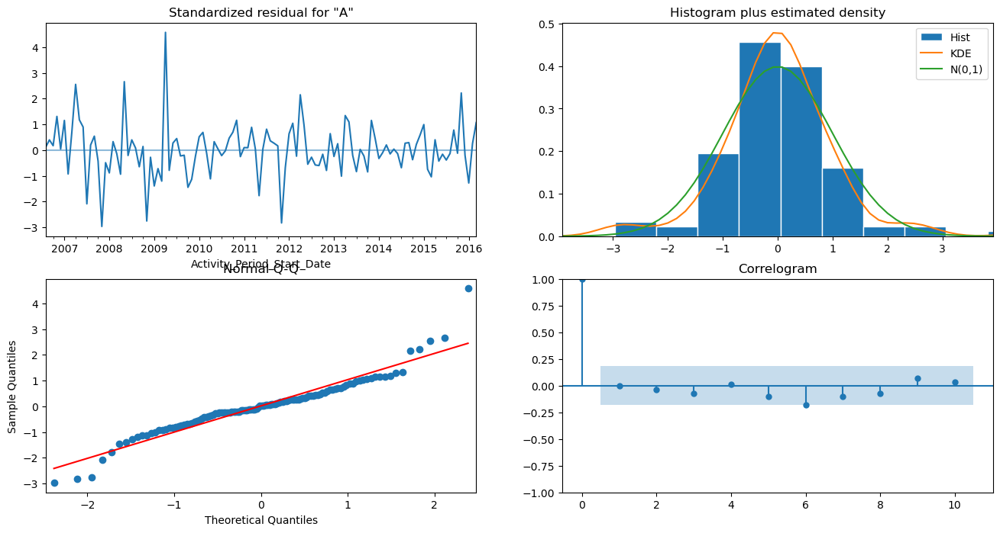

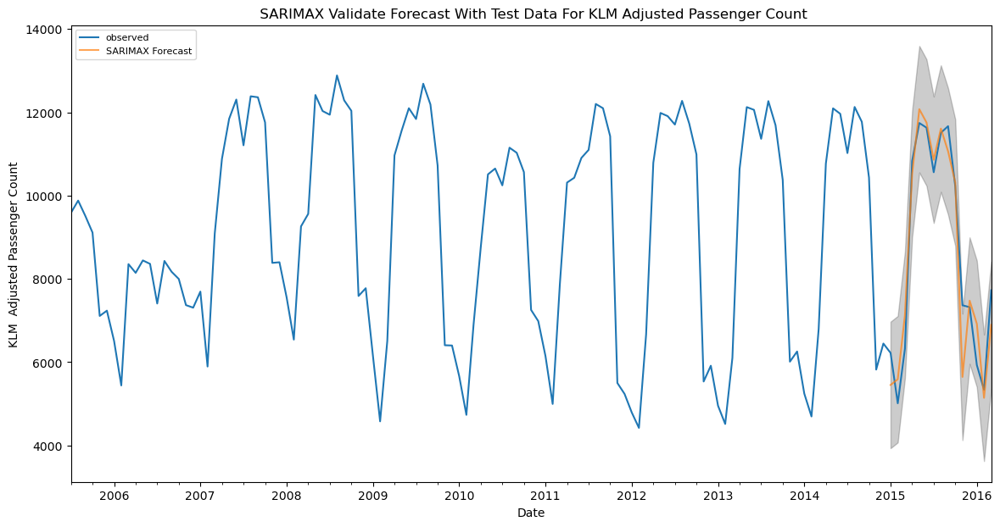

For KLM Dataset : Test RMSE: 681.323
For KLM Dataset : Test MAE: 527.306
For KLM Dataset : Test MAPE: 0.073


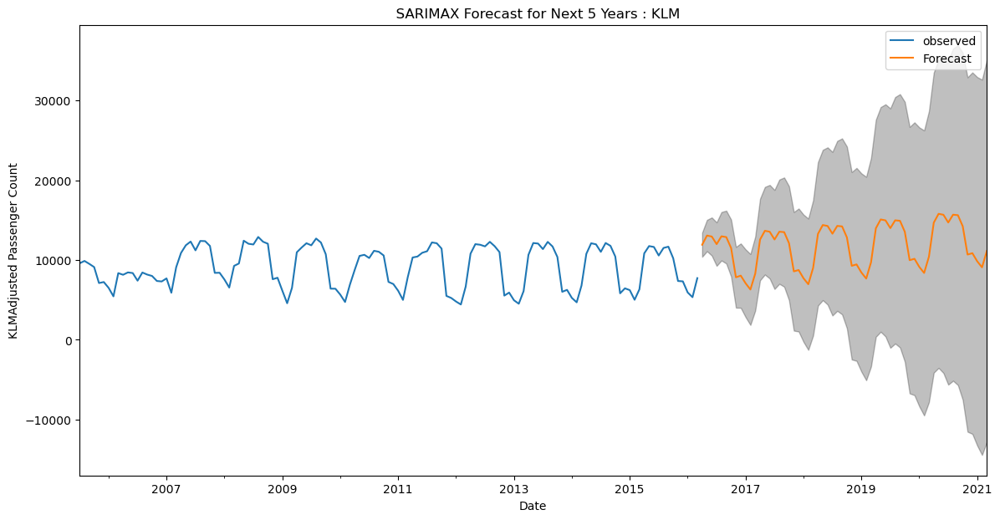

In [102]:
plot_SARIMAX_FCST_model_summary(klm_ds, unitedAirline_param, klm_param_seasonal, 'KLM')

SARIMAX Model Summary for United Airline
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7284      1.720      0.423      0.672      -2.644       4.100
ma.L1         -0.7372      1.706     -0.432      0.666      -4.081       2.607
ar.S.L12       0.6499      0.146      4.463      0.000       0.365       0.935
ma.S.L12      -0.7920      0.173     -4.576      0.000      -1.131      -0.453
sigma2      5.009e+08    4.7e-10   1.07e+18      0.000    5.01e+08    5.01e+08


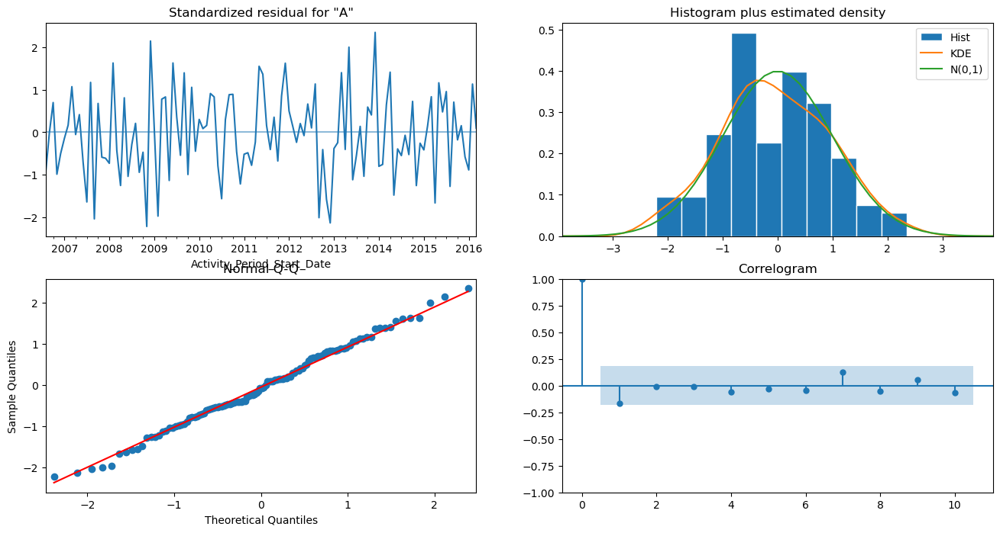

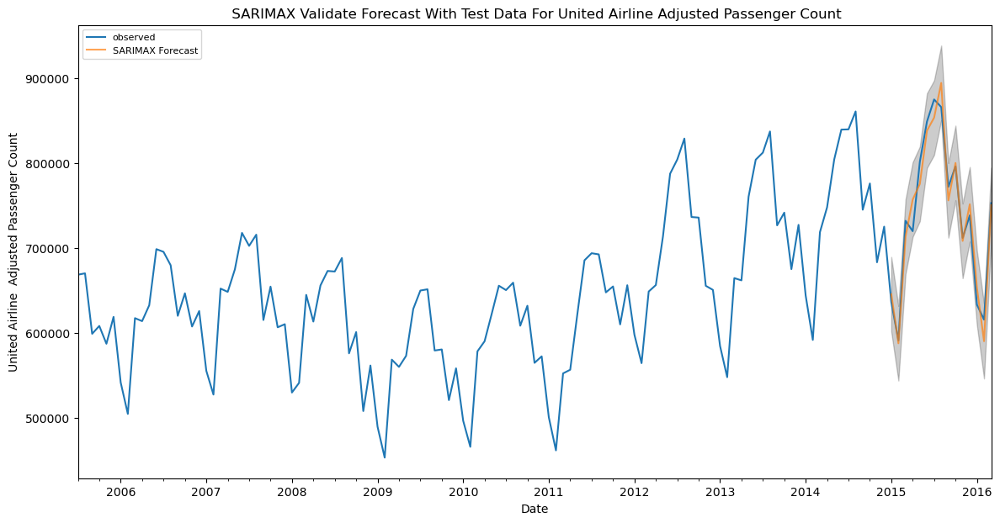

For United Airline Dataset : Test RMSE: 18927.785
For United Airline Dataset : Test MAE: 15910.831
For United Airline Dataset : Test MAPE: 0.022


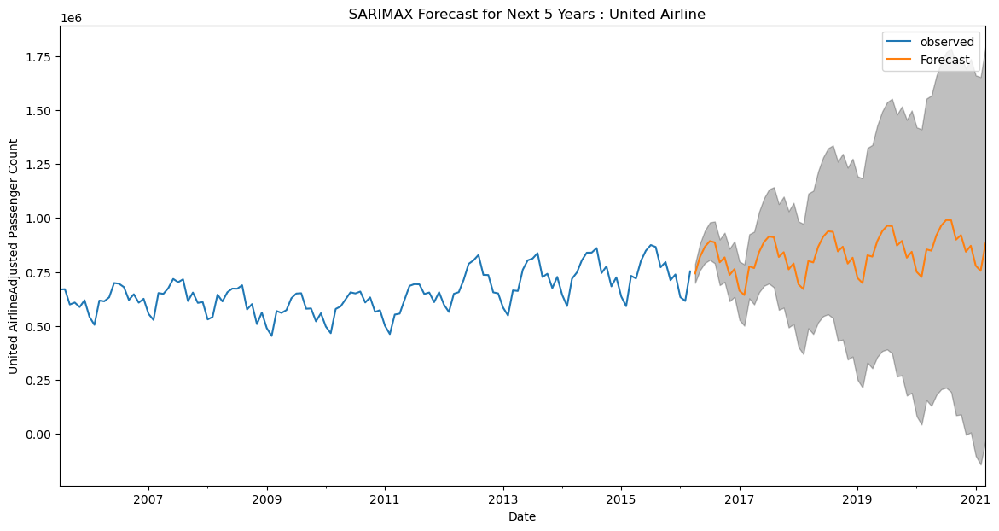

In [103]:
plot_SARIMAX_FCST_model_summary(unitedAirline_ds, unitedAirline_param, unitedAirline_param_seasonal, 'United Airline')

SARIMAX Model Summary for US GEO Region
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9265      0.111      8.329      0.000       0.708       1.145
ma.L1         -0.9546      0.105     -9.095      0.000      -1.160      -0.749
ar.S.L12       0.6016      0.197      3.051      0.002       0.215       0.988
ma.S.L12      -0.7084      0.218     -3.246      0.001      -1.136      -0.281
sigma2      1.438e+09   3.14e-11   4.58e+19      0.000    1.44e+09    1.44e+09


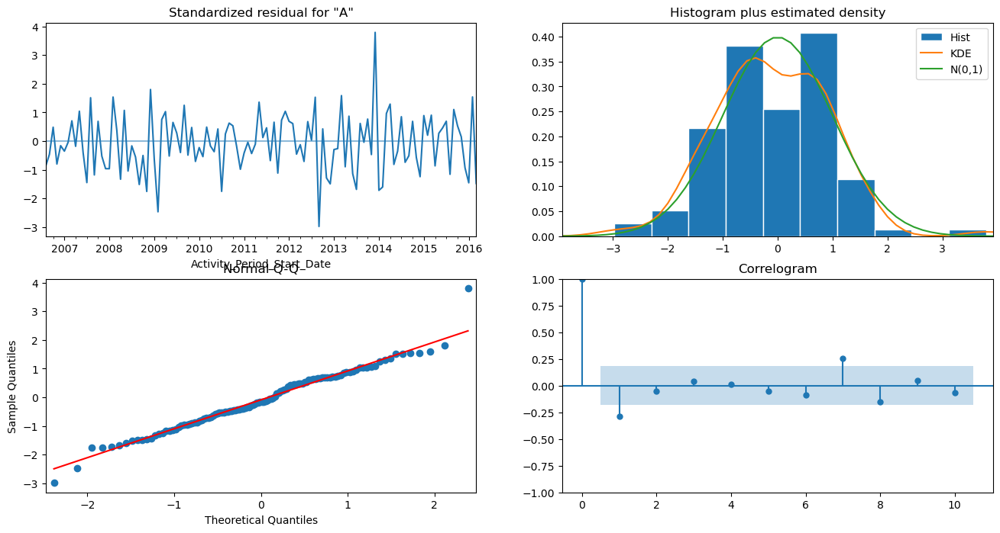

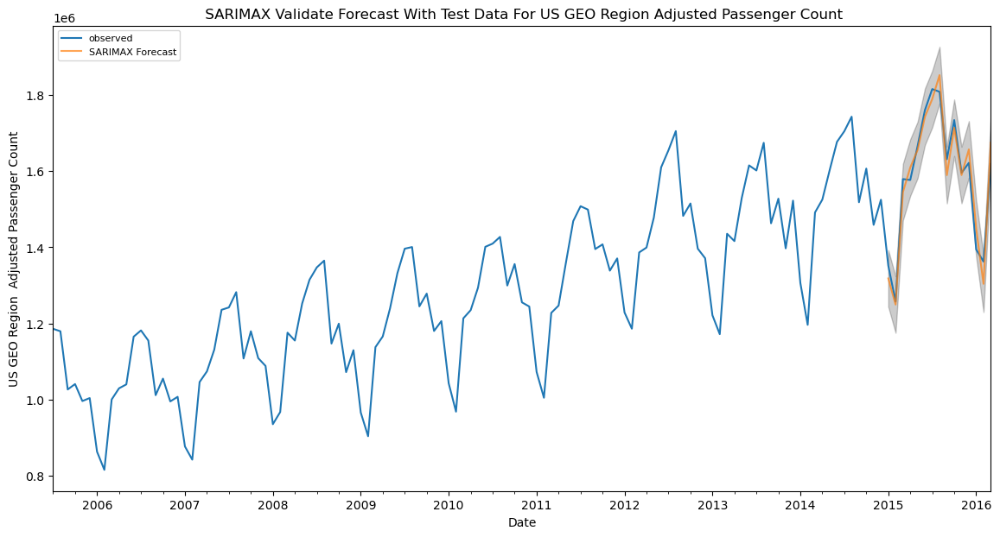

For US GEO Region Dataset : Test RMSE: 36049.018
For US GEO Region Dataset : Test MAE: 31936.122
For US GEO Region Dataset : Test MAPE: 0.021


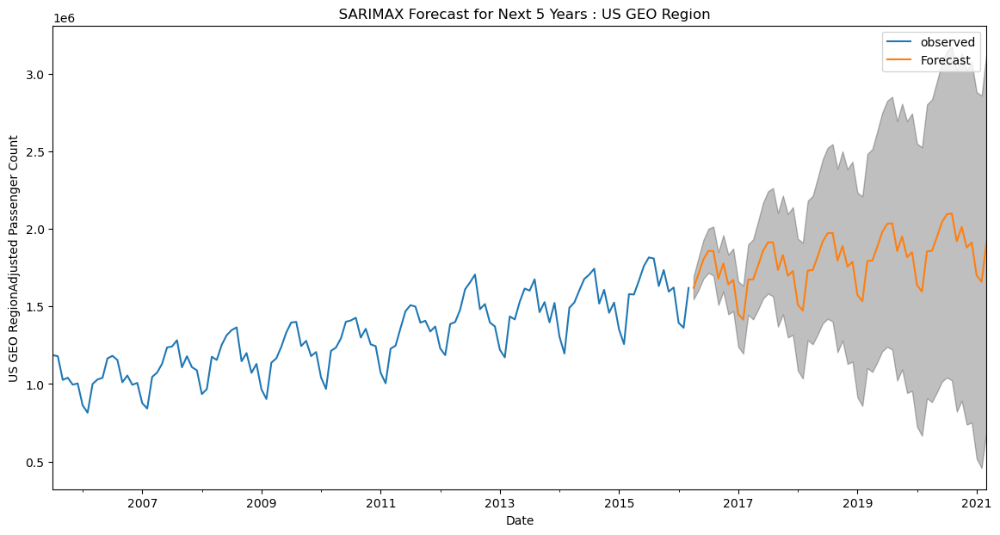

In [104]:
plot_SARIMAX_FCST_model_summary(us_ds, us_param, us_param_seasonal, 'US GEO Region')

SARIMAX Model Summary for Other price category code
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7312      0.631      1.159      0.247      -0.506       1.968
ma.L1         -0.7499      0.629     -1.193      0.233      -1.982       0.483
ar.S.L12       0.6129      0.219      2.799      0.005       0.184       1.042
ma.S.L12      -0.7082      0.234     -3.027      0.002      -1.167      -0.250
sigma2      1.365e+09   9.71e-11   1.41e+19      0.000    1.37e+09    1.37e+09


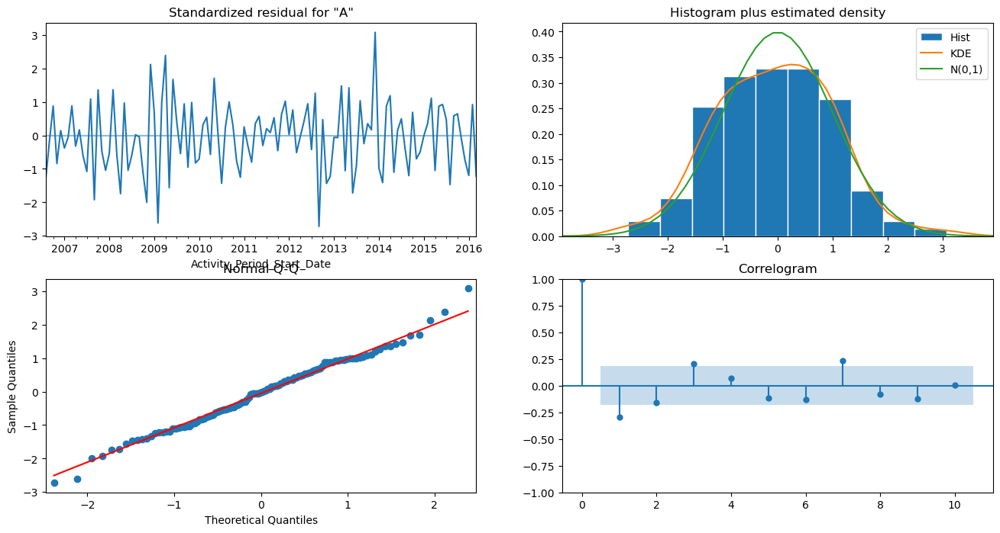

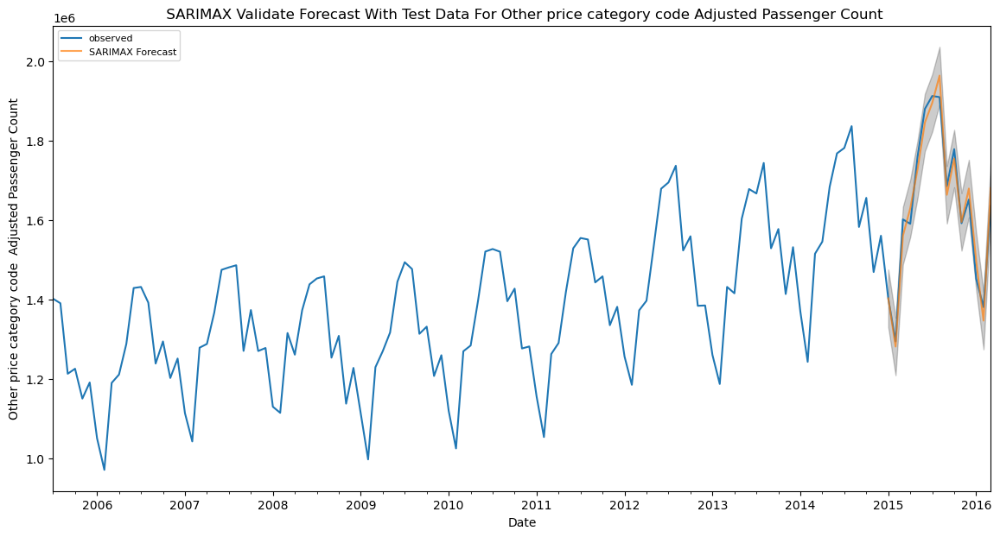

For Other price category code Dataset : Test RMSE: 32408.618
For Other price category code Dataset : Test MAE: 28725.829
For Other price category code Dataset : Test MAPE: 0.017


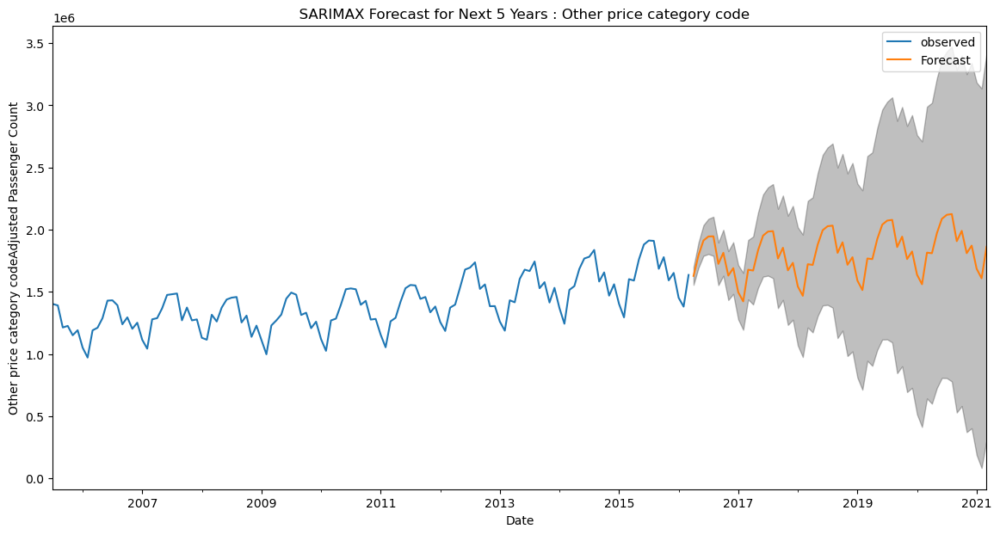

In [105]:
plot_SARIMAX_FCST_model_summary(other_price_ds, other_price_param, other_price_param_seasonal, 'Other price category code')

SARIMAX Model Summary for International GEO Summary
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3545      1.194     -0.297      0.766      -2.694       1.985
ma.L1          0.3204      1.198      0.267      0.789      -2.028       2.668
ar.S.L12       0.4718      0.263      1.795      0.073      -0.043       0.987
ma.S.L12      -0.5662      0.279     -2.033      0.042      -1.112      -0.020
sigma2      1.611e+08   2.16e-08   7.44e+15      0.000    1.61e+08    1.61e+08


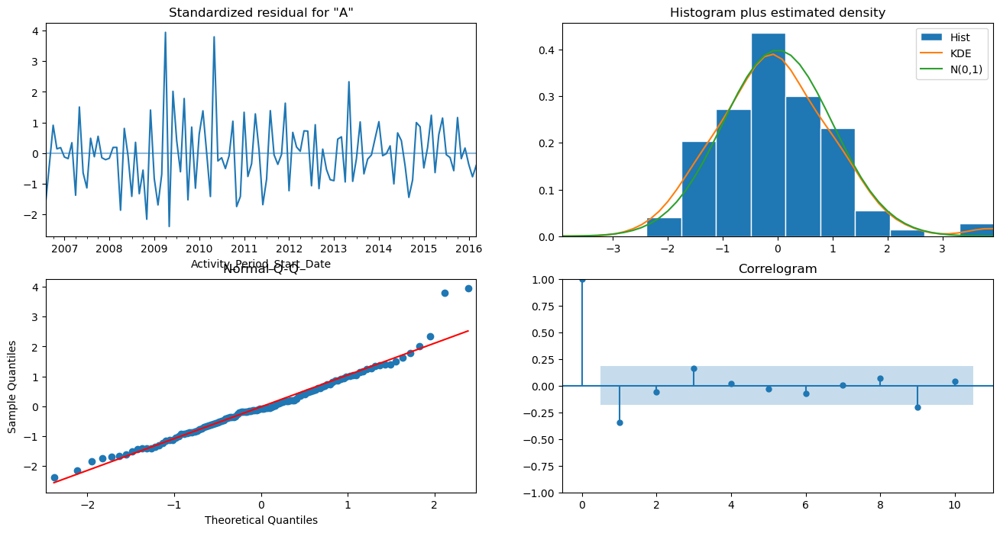

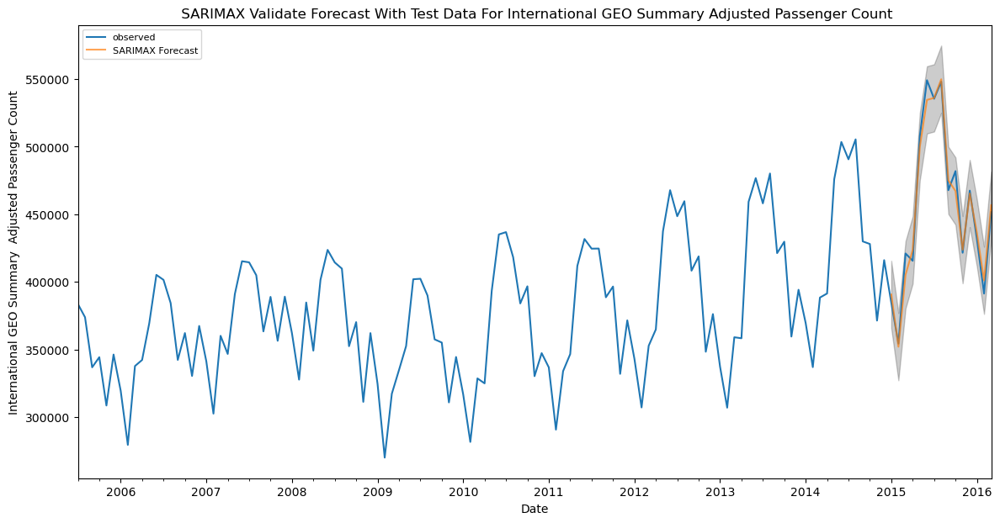

For International GEO Summary Dataset : Test RMSE: 8366.976
For International GEO Summary Dataset : Test MAE: 6840.929
For International GEO Summary Dataset : Test MAPE: 0.015


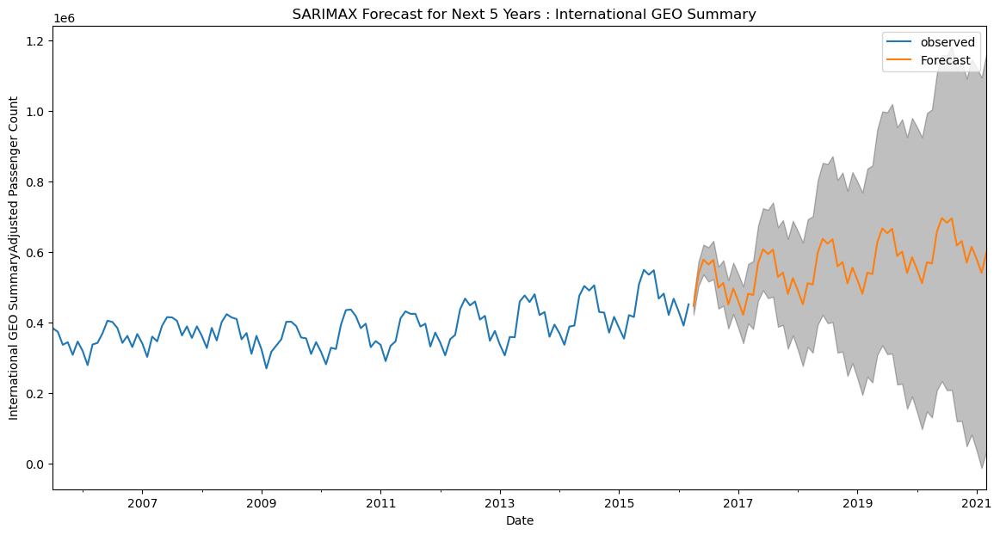

In [106]:
plot_SARIMAX_FCST_model_summary(international_ds, international_param, international_param_seasonal, 'International GEO Summary')

SARIMAX Model Summary for Domestic Low Fare
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2857      0.697     -0.410      0.682      -1.652       1.081
ma.L1          0.1496      0.757      0.198      0.843      -1.334       1.634
ar.S.L12       0.1318      0.135      0.974      0.330      -0.133       0.397
ma.S.L12      -0.5753      0.185     -3.110      0.002      -0.938      -0.213
sigma2      3.389e+08   2.93e-09   1.16e+17      0.000    3.39e+08    3.39e+08


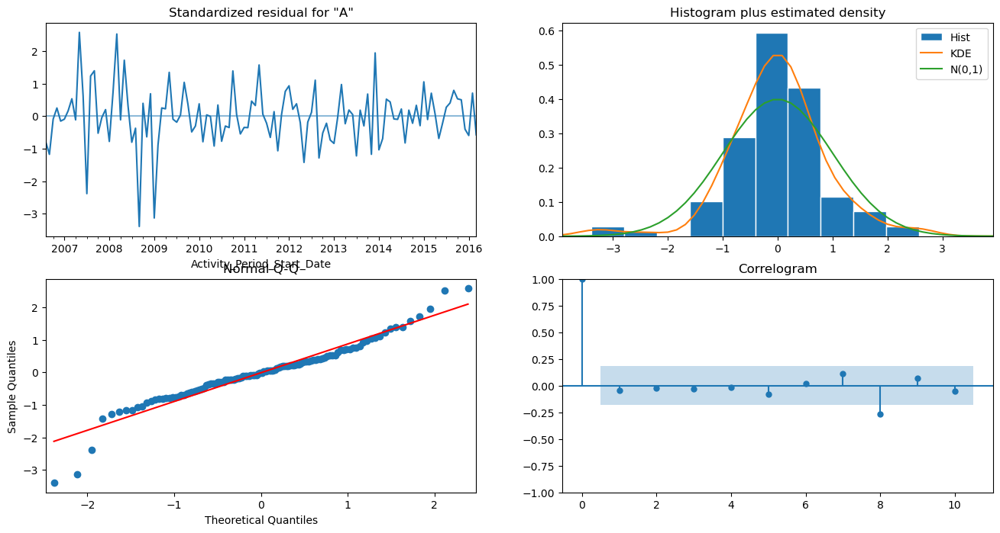

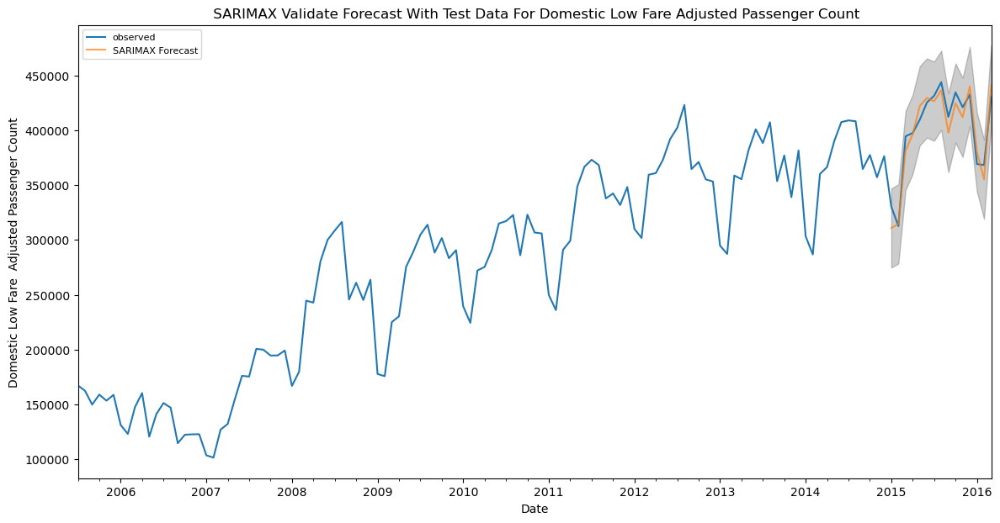

For Domestic Low Fare Dataset : Test RMSE: 10514.497
For Domestic Low Fare Dataset : Test MAE: 9355.120
For Domestic Low Fare Dataset : Test MAPE: 0.024


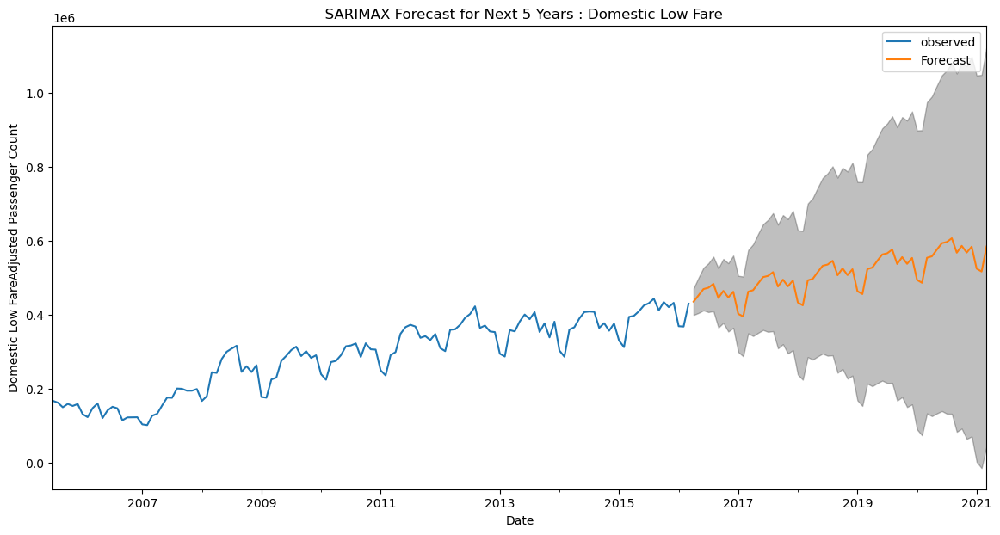

In [107]:
plot_SARIMAX_FCST_model_summary(domestic_lowFarePriceCode_ds, domestic_lowFarePriceCode_param, domestic_lowFarePriceCode_param_seasonal, 'Domestic Low Fare')

### 4.6 Prophet Forecasting Model

In [108]:
import datetime
def create_Prophet_df(df):
    df= df[['Activity_Period_Start_Date','Adjusted Passenger Count']]
    df = df.groupby('Activity_Period_Start_Date')['Adjusted Passenger Count'].sum().reset_index() #.to_frame('Adjusted Passenger Count')
    #df= df.reset_index()
    df = df.set_index('Activity_Period_Start_Date')
    df = df['Adjusted Passenger Count'].resample('MS').mean()
    df = pd.DataFrame({'Activity_Period_Start_Date':df.index, 'Adjusted Passenger Count':df.values})
    return df

In [109]:
unitedAirline_prophet_dataset  = create_Prophet_df(unitedAirline_ds)
us_prophet_dataset  = create_Prophet_df(us_ds)
other_price_prophet_dataset  = create_Prophet_df(other_price_ds)
international_prophet_dataset  = create_Prophet_df(international_ds)
domestic_lowFarePriceCode_prophet_dataset  = create_Prophet_df(domestic_lowFarePriceCode_ds)
americanAirline_prophet_dataset  = create_Prophet_df(americanAirline_ds)
klm_prophet_dataset  = create_Prophet_df(klm_ds)

In [110]:
#!pip install pystan
#!pip install convertdate
#!pip install lunarcalendar
#!pip install lunardate
#!pip install holidays
#!pip install ephem
#!pip install prophet

In [111]:
from pandas import read_csv
from pandas import to_datetime
from pandas import DataFrame
from prophet import Prophet
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from matplotlib import pyplot
  
def plot_prophet_forecast(df, train_percent, dataset_name):
    df.columns = ['ds', 'y']
    train_size = int(len(X) * train_percent / 100)
    test_size = len(df) - train_size
    train, future = df[0:train_size], df
    future = future.drop(['y'], axis=1)
    # define the model
    model = Prophet()
    # fit the model
    model.fit(train)
     # use the model to make a forecast    
    #print(future.tail(test_size))
    
    forecast=model.predict(future)
    #print(forecast)
    fig1 = model.plot(forecast)
    ax = fig1.gca()
    ax.set_title("Plot of the forecast for " + dataset_name, size=12)
    
    fig1 = model.plot_components(forecast)     
    ax = fig1.gca()
    ax.set_title("The components of the forecast for: " + dataset_name, size=8)
    
    # calculate MAE between expected and predicted values 
    y_true = df['y'][-test_size:].values
    #print(y_true)
    y_pred = forecast['yhat'][-test_size:].values
    #print(y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    print('MAE: %.3f' % mae)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    print('MAPE: %.3f' % mape)
    
    pyplot.figure(figsize=(10,5), dpi=100)

    pyplot.plot(train['y'],  label='Training Data', linewidth=2)
    pyplot.plot([None for i in train['y']] + [x for x in y_true] , 'b', label='Testing Data', linewidth=2)
    pyplot.plot([None for i in train['y']] + [x for x in y_pred], 'r--', label='Forecast Data', linewidth=2)

    pyplot.title(" Prophet Forecast \n Observed Vs Predicted Plot for "  + dataset_name )
    pyplot.legend(loc='upper left', fontsize=8)

    pyplot.legend()
    pyplot.show()
    model_summary.loc[('Prophet', 'MAE'), 
                      dataset_name], model_summary.loc[('Prophet', 'MAPE'), 
                      dataset_name] = mae, mape

12:45:33 - cmdstanpy - INFO - Chain [1] start processing
12:45:33 - cmdstanpy - INFO - Chain [1] done processing


MAE: 511.827
MAPE: 0.065


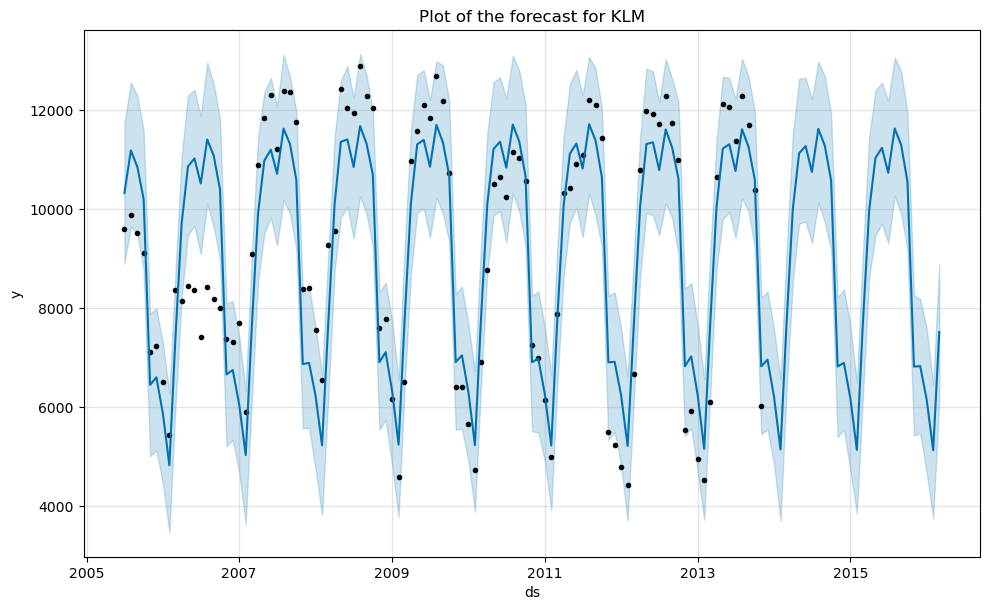

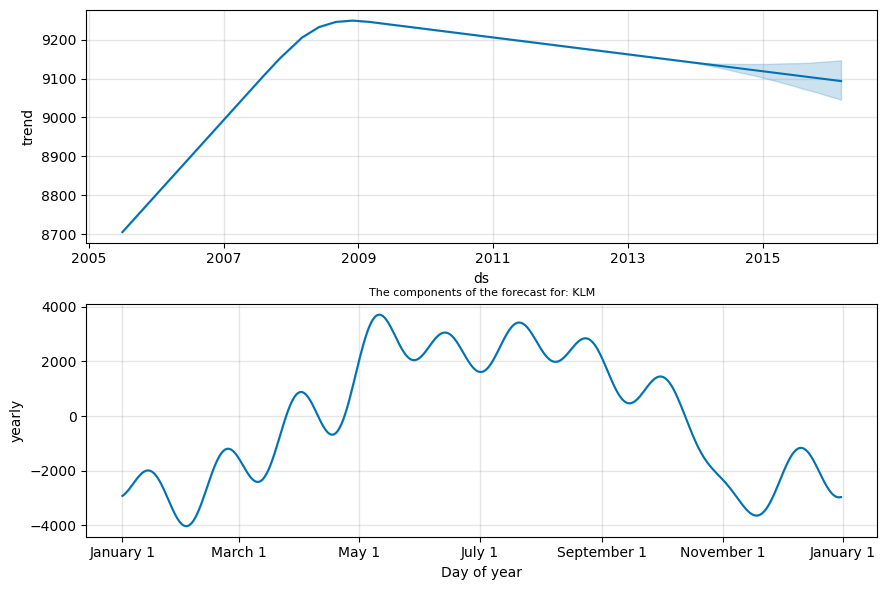

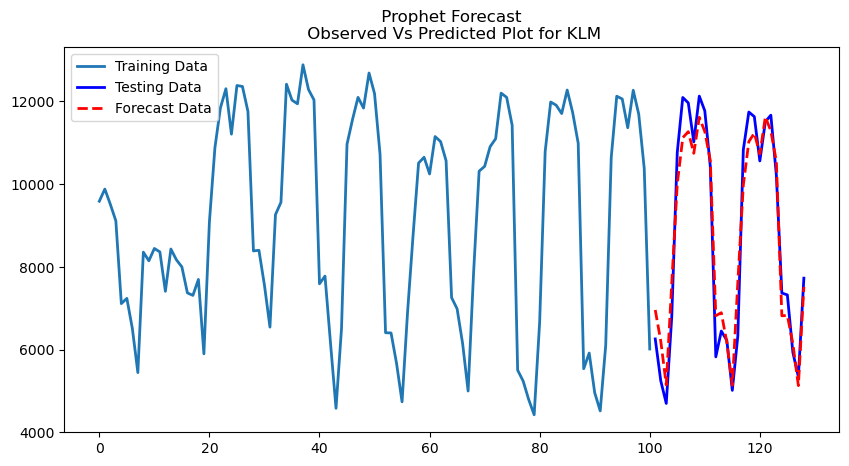

In [112]:
train_pctg_prophet = 79 
plot_prophet_forecast(klm_prophet_dataset, train_pctg_prophet, "KLM")

#### Observations for KLM

* We seee that there is a significant growth in the trend from 2007 up until 2009, with passenger numbers levelling off after that.
* We also observe that passenger numbers appear to be highest from approximately May — September, after which we see a dip in numbers for the rest of the year.
* Model Validation: Now that the forecasting model has been developed, we can compare the predicted passenger numbers to the test data in order to evaluate model accuracy. Mean Forecast Error is 511. With a mean of approximately 9000 passengers per month — the errors are quite low in comparison to this figure — indicating that the model is performing well in forecasting monthly passenger numbers.

12:45:35 - cmdstanpy - INFO - Chain [1] start processing
12:45:35 - cmdstanpy - INFO - Chain [1] done processing


MAE: 49676.393
MAPE: 0.071


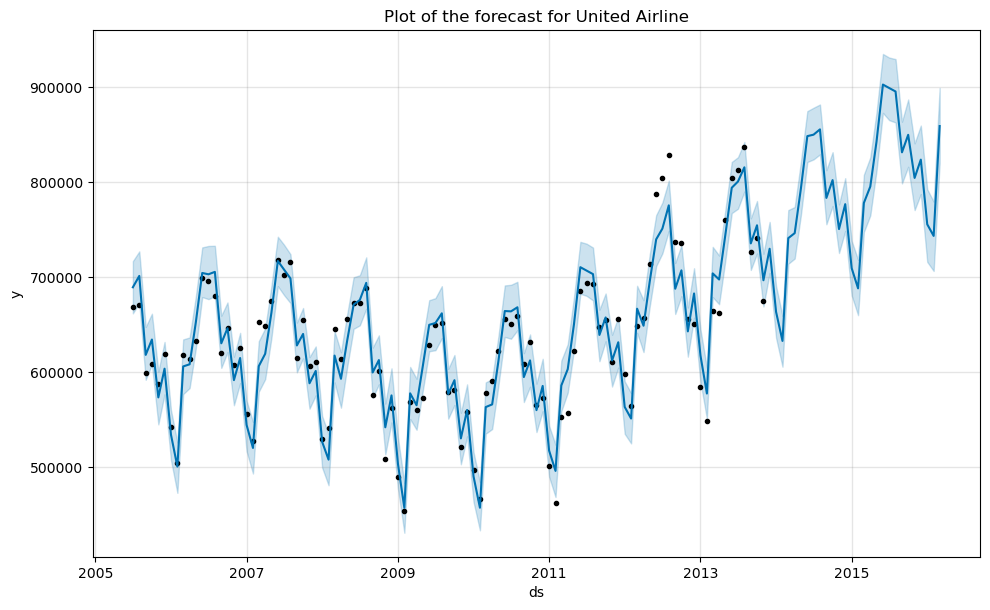

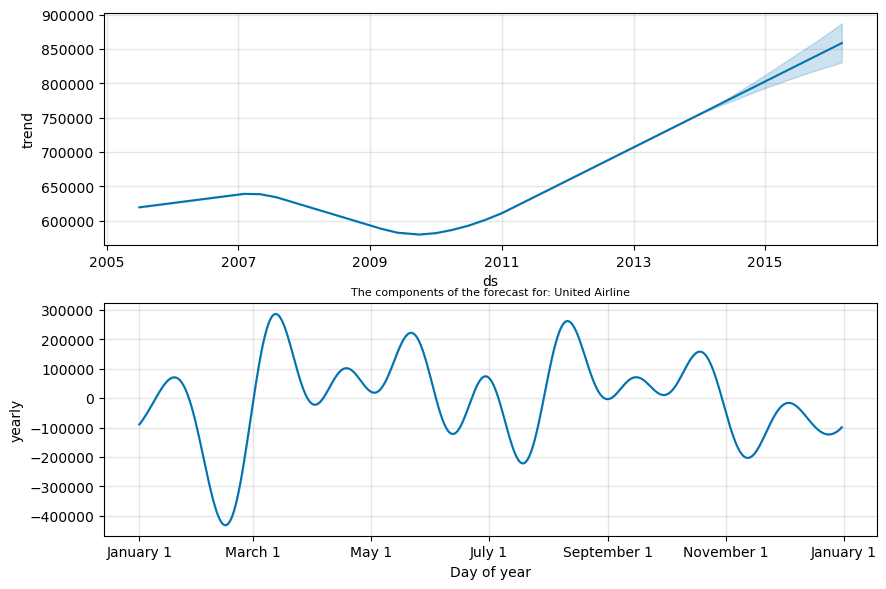

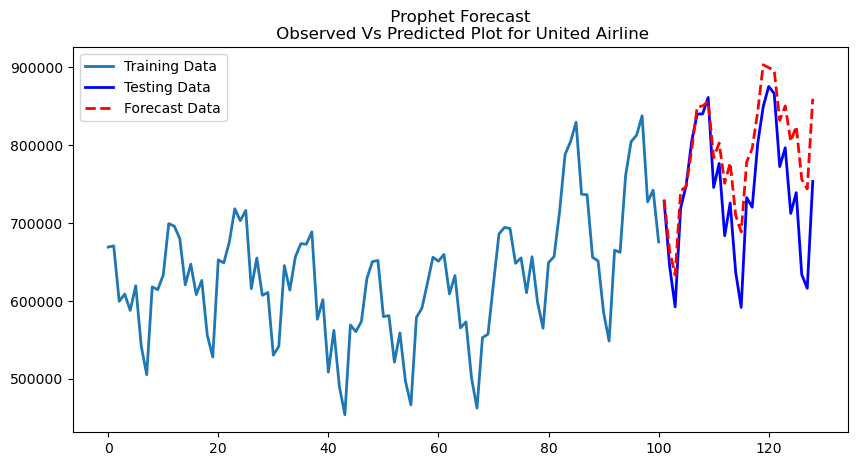

In [113]:
plot_prophet_forecast(unitedAirline_prophet_dataset, train_pctg_prophet, "United Airline")

12:45:36 - cmdstanpy - INFO - Chain [1] start processing
12:45:36 - cmdstanpy - INFO - Chain [1] done processing


MAE: 32746.651
MAPE: 0.021


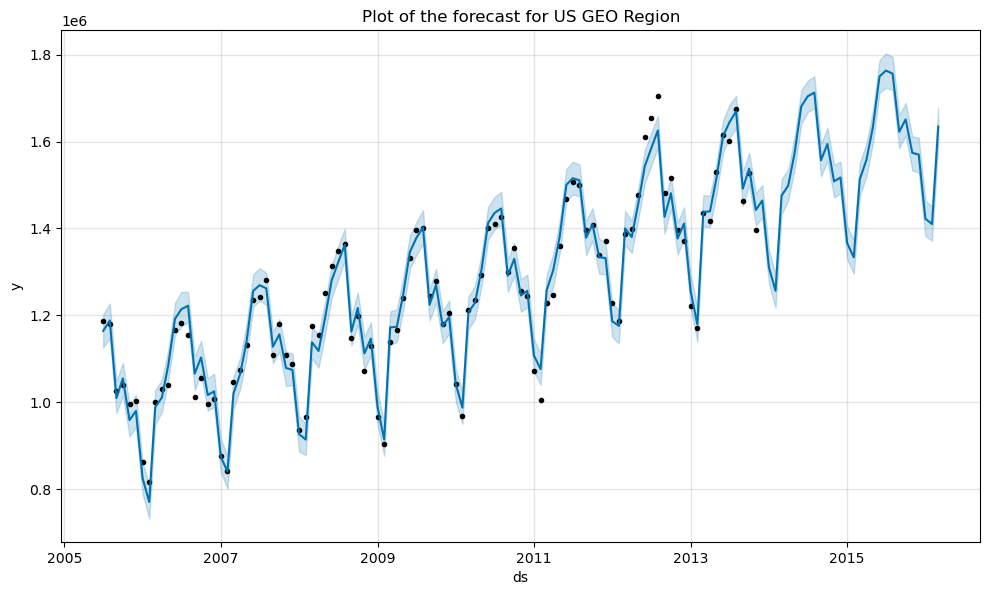

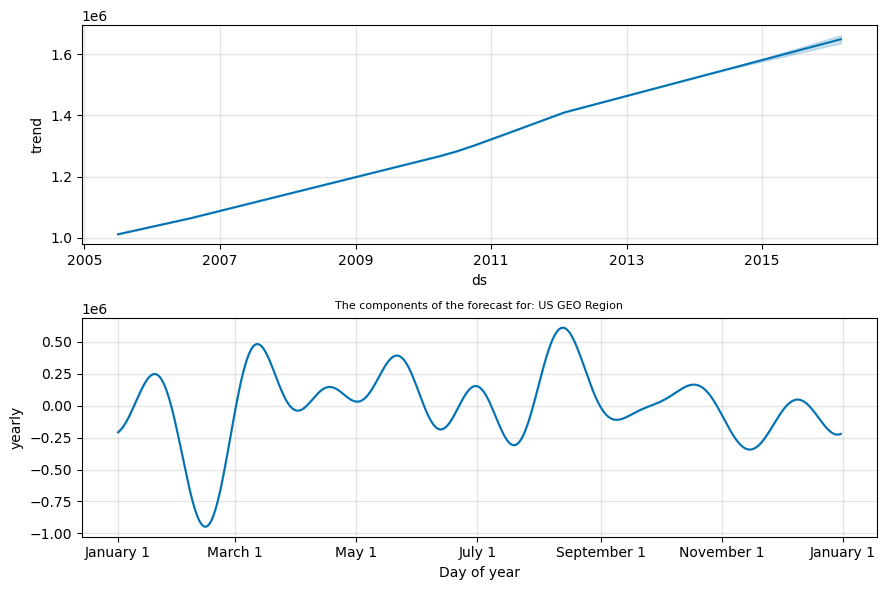

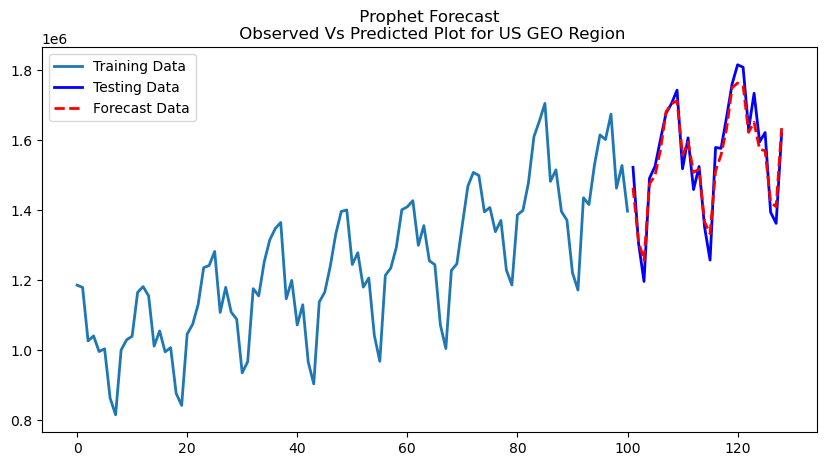

In [114]:
plot_prophet_forecast(us_prophet_dataset, train_pctg_prophet, "US GEO Region")

12:45:38 - cmdstanpy - INFO - Chain [1] start processing
12:45:38 - cmdstanpy - INFO - Chain [1] done processing


MAE: 37290.180
MAPE: 0.023


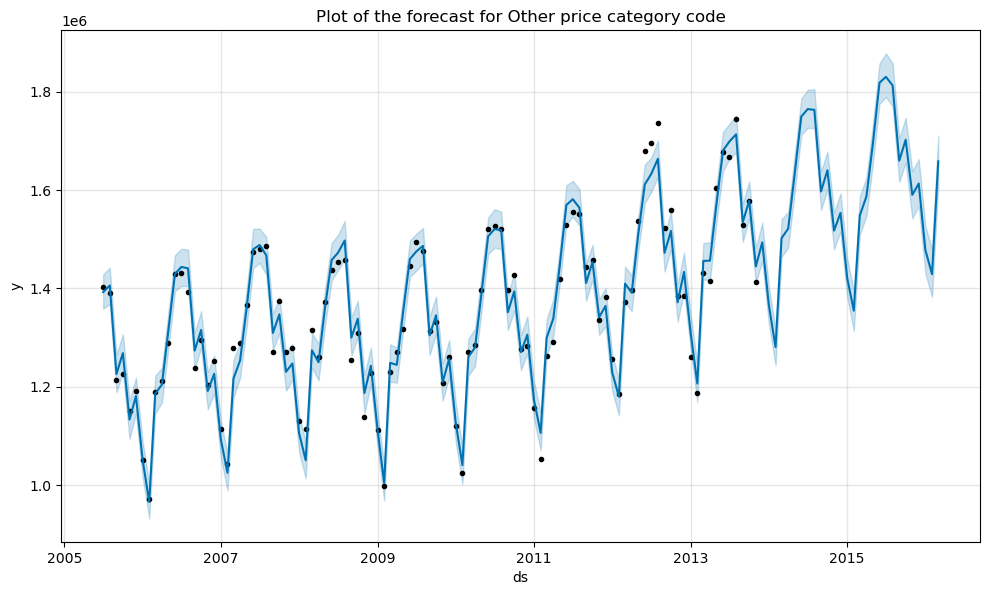

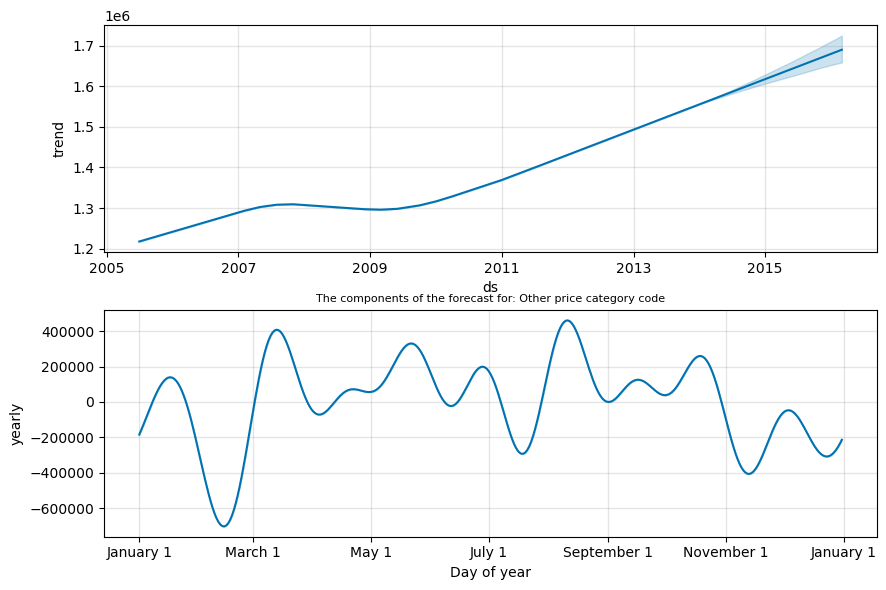

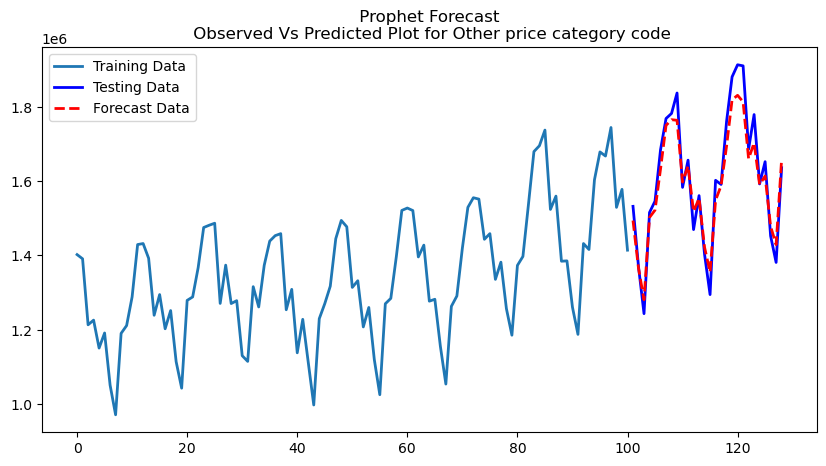

In [115]:
plot_prophet_forecast(other_price_prophet_dataset, train_pctg_prophet, "Other price category code")

12:45:40 - cmdstanpy - INFO - Chain [1] start processing
12:45:40 - cmdstanpy - INFO - Chain [1] done processing


MAE: 22127.973
MAPE: 0.046


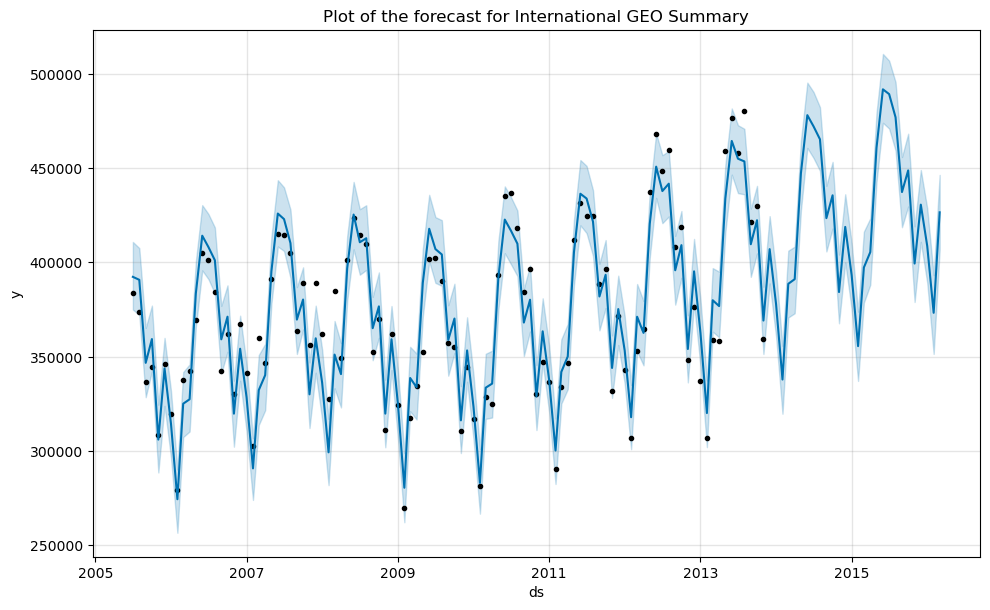

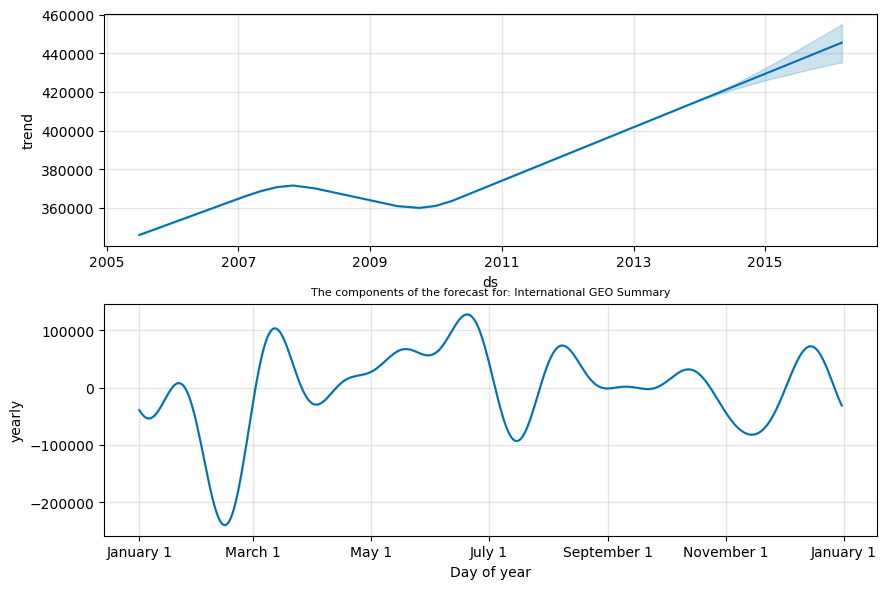

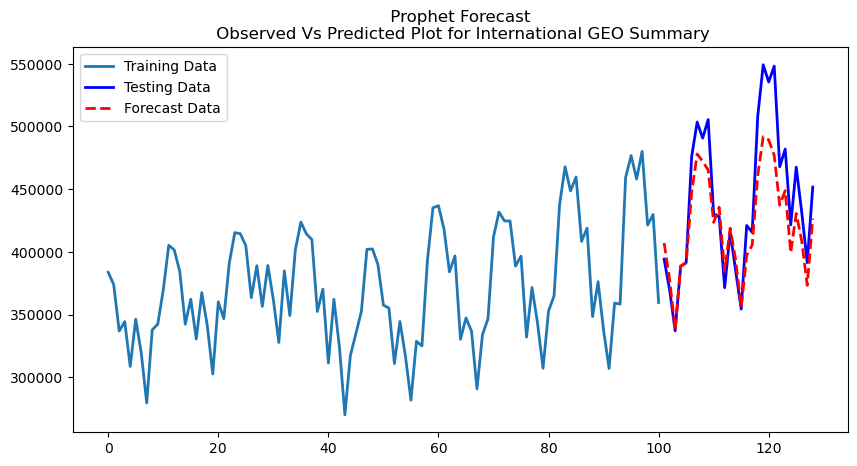

In [116]:
plot_prophet_forecast(international_prophet_dataset, train_pctg_prophet, "International GEO Summary")

12:45:41 - cmdstanpy - INFO - Chain [1] start processing
12:45:41 - cmdstanpy - INFO - Chain [1] done processing


MAE: 30407.522
MAPE: 0.082


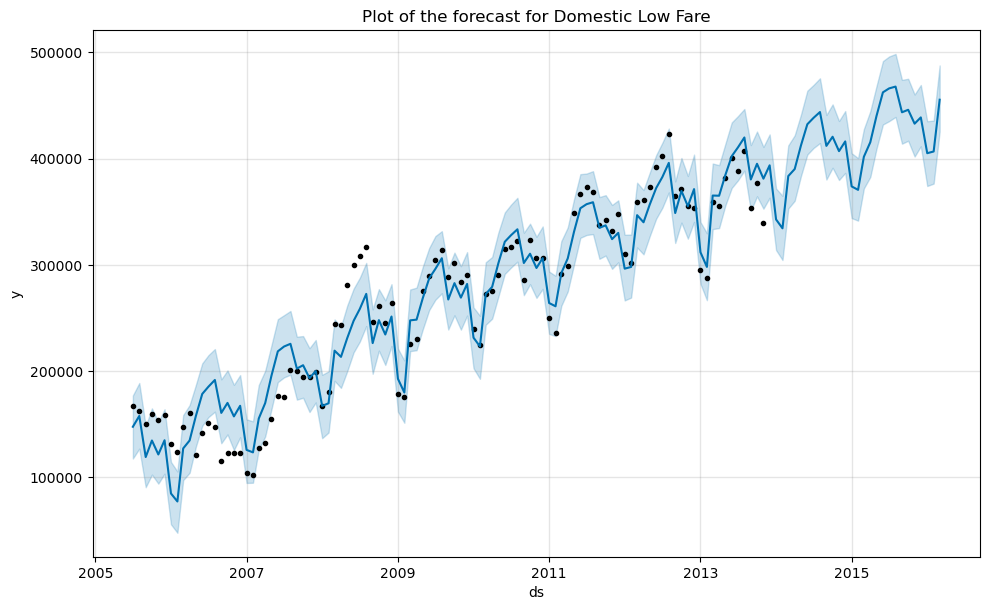

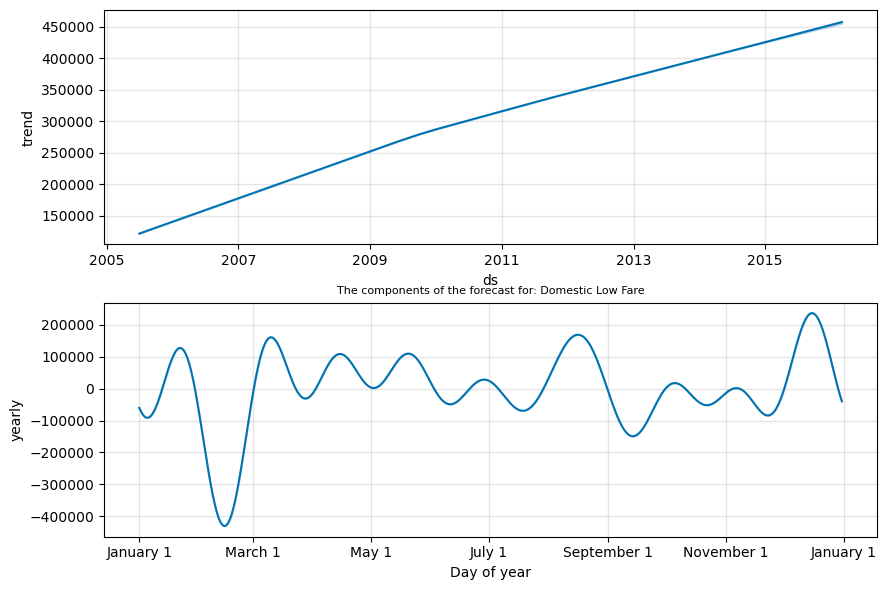

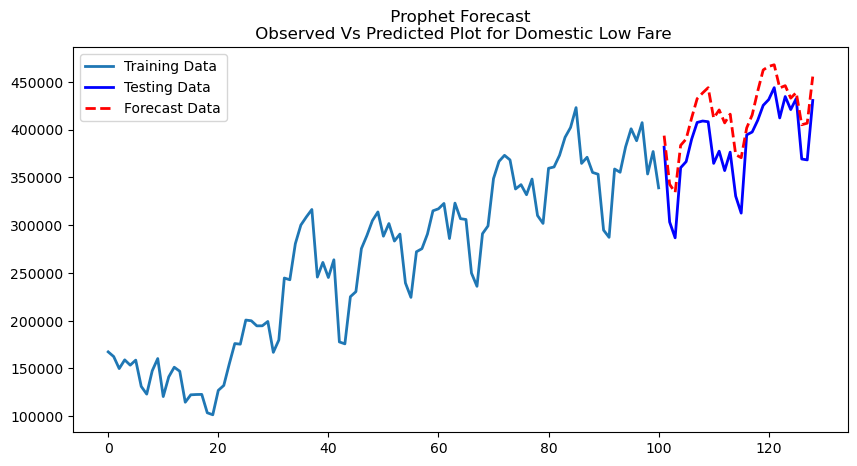

In [117]:
plot_prophet_forecast(domestic_lowFarePriceCode_prophet_dataset, train_pctg_prophet, "Domestic Low Fare")

### 5. Evaluate Model & Conclusion Summary
This project focuses on developing models to forecast air travel demand. Time Series Analysis and Forecasting is performed using several statistical Models and visualizations. The crucial step here is to verify the model's correctness by doing an error measurement. It is essential to note the forecasting deviation from the actual data.
We will evaluate Forecasting Models using **MAPE - Mean Absolute PercentageError**. The table below shows the MAPE, MAE (and RMSE in some cases) for each forecasting model used to generate the projected data.

If the value of data is large, e.g., Adjusted Passengers Count ranging from 1000 to 1000,000, the use of MAPE method is a better choice. The reason is that the value of MAE may be too big and lead to confusion. For example, for a data value of 10,000, the value for MAE is 500 and the corresponding value for MAPE is 5%, which is within good engineering tolerance. However, if the absolute value of 500 is used, it is quite large in an absolute sense and just leads to confusion.

In [118]:
# Define a function to highlight minimum value
def highlight_min_mae(x):
   min_val = model_summary.loc[(slice(None), ["MAE"]), :].min()[x.name]
   return ['background-color: gold' if val == min_val else '' for val in x]

# Define a function to highlight minimum MAPE value
def highlight_min_mape(x):
   min_val = model_summary.loc[(slice(None), ["MAPE"]), :].min()[x.name]
   return ['background-color: yellow' if val == min_val else '' for val in x]

# Apply the function to the DataFrame
highlighted_df = model_summary.style.apply(highlight_min_mape)

# Display the highlighted DataFrame
highlighted_df  

<Axes: xlabel='MAPE', ylabel='Dataset'>

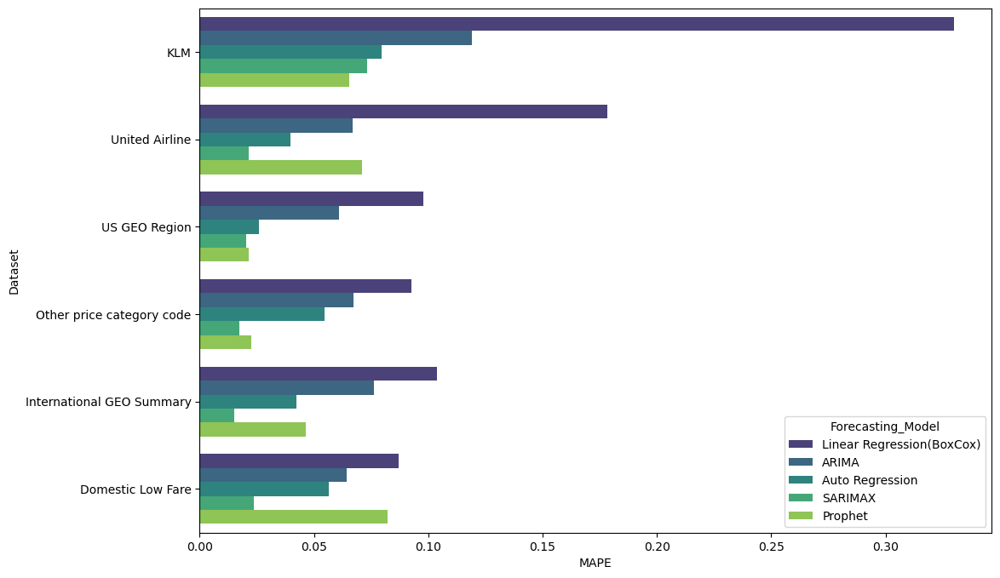

In [119]:
model_summary_mape = model_summary.stack().reset_index()
model_summary_mape = model_summary_mape[model_summary_mape['level_1'] == 'MAPE']
# Changing columns name 
model_summary_mape.rename(columns={"level_2": "Dataset", "level_0": "Forecasting_Model", 0:"MAPE"}, inplace=True)
sns.barplot(x='MAPE', y='Dataset', hue= 'Forecasting_Model', data=model_summary_mape, orient='h', palette='viridis')

#### Observations:
1. For KLM, Prophet and SARIMAX Models have the lowest MAEs and MAPEs. By numbers Prophet appears to be more Suitable.
2. For Uniter Airline SARIMAX Model appears to be the Best Fit, considering the lowest MAPE and MAE among 5 Forecasting Models. Auto Regression has the next lowest MAPE.
3. For the US GEO region Dataset, SARIMAX and Prophet look to have the lowest MAPEs and MAEs, but SARIMAX is more suitable.
4. For Other Price Category Code, SARIMAX is clearly a more suitable model. Prophet has the next lowest MAPE.
5. The SARIMAX Forecast has the lowest MAPE and MAE for the International GEO Summary category.
6. SARIMAX is the best-fit model with the lowest MAPE and MAE for the Domestic Low Fare segment.


**Overall SARIMAX model seems suitable for most of the sub-datasets we tested.** <br>

#### Further Opportunities:
To expand the study of this dataset, we can run the models against sub-datasets for other regions, and carriers and evaluate the model’s fit with a larger number of datasets.

#### Appendix:

Data Source: https://data.world/data-society/air-traffic-passenger-data
<br>
Source Code: https://github.com/naeemasma/cscie83/tree/main